In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

from google.colab import auth
auth.authenticate_user()

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

In [3]:
data = pd.read_excel('/content/drive/MyDrive/CAPSTONE/CAPSTONE_PROJECT/0_dataset/2_CLEANED DATASET/FULLY_CLEANED DATASET.xlsx')

In [5]:
df=data.copy()
df.head(3)

,Unnamed: 0,Report Number,Local Case Number,Agency Name,ACRS Report Type,Crash Date/Time,Route Type,Road Name,Cross-Street Name,Collision Type,Weather,Surface Condition,Light,Traffic Control,Driver Substance Abuse,Person ID,Driver At Fault,Injury Severity,Driver Distracted By,Drivers License State,Vehicle ID,Vehicle Damage Extent,Vehicle First Impact Location,Vehicle Body Type,Vehicle Movement,Vehicle Going Dir,Speed Limit,Driverless Vehicle,Parked Vehicle,Vehicle Year,Vehicle Make,Latitude,Longitude,Vehicle Model,Circumstance_Category,hour,Crash_year,Crash_month,Crash_day,Crash_hour,Crash_day_name,Crash_date,Crash_week
0,0,MCP3126006X,250037402,Montgomery_County_Police,Injury Crash,2025-08-21 17:21:00,Maryland_State_Route,FREDERICK RD,TILTON DR,Rear-End (Same Direction),Clear,Dry,Daylight,No Control,None Detected,BB3CB0F3-5A89-45FB-9516-48DDDB92B0A9,Yes,No Apparent Injury,Other Distraction,MD,768C98FA-C137-47BC-BE44-EE3BA4B95F66,Superficial,Twelve O Clock,PassengerCar,MovingConstantSpeed,Northbound,40.0,No,No,2013.0,KIA,39.219796,-77.257416,Soul_Kia,Tailgating,17,2025,8,21,17,Thursday,2025-08-21,34
1,1,MCP2349001B,250037516,Montgomery_County_Police,Property Damage Crash,2025-08-22 10:44:00,Interstate_Route,EISENHOWER MEMORIAL HWY,DIAMONDBACK DR,Single Vehicle,Clear,Dry,Daylight,No Control,Alcohol Present,9B84E695-215A-447E-8AA6-D3958187BBCA,No,Suspected Minor Injury,Inattentive / Lost In Thought,XX,BC322ECD-006B-4919-AAF8-3F64D934B789,Vehicle Not at Scene,VehicleNotAtScene,PickupTruck,MovingConstantSpeed,Northbound,55.0,No,No,2018.0,NISSAN,39.180181,-77.250657,Altima_Nissan,Lane Violation,10,2025,8,22,10,Friday,2025-08-22,34
2,2,MCP296500BC,250033157,Montgomery_County_Police,Property Damage Crash,2025-07-25 11:55:00,Bicycle_Route,AIRPARK RD,NEW HAMPSHIRE AVE (SB/L) NORBECK RD (WB/L) SPENCERVILLE RD (WB/L),Sideswipe (Same Direction),Clear,Dry,Daylight,Traffic Signal,None Detected,1D28ADF4-0DB2-4CBC-BDB0-1C1F5E7CF955,No,No Apparent Injury,Not Distracted,CO,1F4EBE18-DB94-4CA7-8D9A-88C30E90400D,Superficial,Seven O Clock,PassengerCar,MovingConstantSpeed,Westbound,40.0,No,No,2023.0,LEXUS,39.121219,-76.988905,RX_Lexus,Lane Violation,11,2025,7,25,11,Friday,2025-07-25,30


In [6]:
df.drop(columns='Unnamed: 0',inplace=True)

In [7]:
num = df.select_dtypes(include=np.number).columns.to_list()
cat = df.select_dtypes(include=object).columns.to_list()

# **DEEP ANALYSIS**

## **5 Point / Descriptive Summary**

In [8]:
df[num].describe().T

,count,mean,std,min,25%,50%,75%,max
Speed Limit,205539.0,32.281100,11.052648,2.500000,25.000000,35.000000,40.000000,62.500000
Vehicle Year,205539.0,2011.366025,6.470171,1993.500000,2007.000000,2012.000000,2016.000000,2025.000000
Latitude,205539.0,39.082942,0.070796,38.851557,39.024418,39.074846,39.139659,39.312521
Longitude,205539.0,-77.111865,0.094728,-77.414384,-77.189266,-77.105170,-77.039188,-76.814070
hour,205539.0,13.365274,5.261188,0.000000,9.000000,14.000000,17.000000,23.000000
Crash_year,205539.0,2019.710449,3.167699,2015.000000,2017.000000,2019.000000,2023.000000,2025.000000
Crash_month,205539.0,6.639810,3.439433,1.000000,4.000000,7.000000,10.000000,12.000000
Crash_day,205539.0,15.695357,8.769084,1.000000,8.000000,16.000000,23.000000,31.000000
Crash_hour,205539.0,13.365274,5.261188,0.000000,9.000000,14.000000,17.000000,23.000000
Crash_week,205539.0,27.102633,14.993967,1.000000,14.000000,27.000000,40.000000,53.000000


### **Interactive Summary of Numerical Features (`df[num].describe()`)**

| Feature        | Key Insights |
|----------------|--------------|
| **Speed Limit** | Average speed limit is **32 mph**, with most roads between **25–40 mph**. Values range from **2.5 to 62.5**, indicating presence of alleys as well as highways. |
| **Vehicle Year** | Typical vehicle year is **2011–2016**. Range spans from **1993 to 2025**, showing a mix of older and newer vehicles. |
| **Latitude** | Values cluster tightly around **39.08**, confirming the dataset covers a **geographically concentrated area**. |
| **Longitude** | Centered around **–77.11**, again showing a **small geographic spread**, consistent with a localized region. |
| **Hour** | Crashes occur mostly during **9 AM to 5 PM**, median at **14:00**, with full coverage from **0–23 hours**. |

## **Conclusion**
The numerical distribution indicates a focused geographic region, typical city-level speed patterns, modern vehicle age distribution, and higher crash frequency during daytime hours.

In [ ]:
df[cat].describe().T

,count,unique,top,freq
Report Number,205539,115863,MCP229800RC,10
Local Case Number,205539,115777,200022715,10
Agency Name,205539,5,Montgomery_County_Police,184224
ACRS Report Type,205539,3,Property Damage Crash,131630
Route Type,205539,14,Maryland_State_Route,98029
Road Name,205539,4704,GEORGIA AVE,13088
Cross-Street Name,205539,7481,GEORGIA AVE,2850
Collision Type,205539,17,Rear-End (Same Direction),67240
Circumstance_Category,205539,13,Road Obstruction,71505
Weather,205539,13,Clear,153737


### **Interactive Summary of Categorical Features (`df[cat].describe()`)**

| Feature | Key Insights |
|---------|--------------|
| **Report Number / Local Case Number** | Extremely high uniqueness (each ≈ one record), used mainly as identifiers. |
| **Agency Name** | Dominated by **Montgomery_County_Police** (≈184k cases), meaning the dataset is heavily county-focused. |
| **ACRS Report Type** | Majority are **Property Damage Crash** (≈131k), indicating most crashes are non-injury. |
| **Route Type** | **Maryland_State_Route** is most common (≈98k), showing crashes mainly occur on state routes. |
| **Road Name / Cross-Street Name** | Very high variability (4,700+ roads, 7,400+ cross streets). **GEORGIA AVE** appears most often—main crash hotspot. |
| **Collision Type** | **Rear-End (Same Direction)** leads (≈67k), typical of urban traffic congestion. |
| **Circumstance_Category** | **Road Obstruction** is top factor, influencing ≈71k crashes. |
| **Weather / Surface Condition / Light** | Majority under **Clear**, **Dry**, and **Daylight**—crashes mostly occur under good conditions. |
| **Traffic Control** | **No Control** most frequent (≈98k), indicating many crashes occur in uncontrolled zones. |
| **Driver Substance Abuse** | **None Detected** dominates (≈196k), showing low reported impairment. |
| **Driver At Fault** | **Yes** is the majority (≈103k). |
| **Injury Severity** | Mostly **No Apparent Injury** (≈167k), matching the high property-damage share. |
| **Driver Distracted By** | Mostly **Not Distracted**, suggesting distractions are underreported. |
| **Drivers License State** | Primarily **MD** (≈181k), confirming local drivers dominate. |
| **Vehicle ID / Person ID** | Fully unique identifiers—one value per record. |
| **Vehicle Damage Extent** | **Disabling** damage is most common (≈80k). |
| **Vehicle First Impact Location** | **Twelve O Clock** (front impact) is highest (~79k). |
| **Vehicle Body Type** | Mostly **PassengerCar** (~144k), typical for urban environments. |
| **Vehicle Movement** | **MovingConstantSpeed** highest (~81k), indicating many rear-end or flow-related collisions. |
| **Vehicle Going Dir** | **North** is the most common direction (~49k). |
| **Driverless Vehicle / Parked Vehicle** | Nearly all records are **No**, meaning active, non-parked vehicles dominate. |
| **Vehicle Make** | **TOYOTA** is the most common brand (~48k). |
| **Vehicle Model** | Highly diverse (450 models), with **Camry_Toyota** most frequent (~27k). |

### **Conclusion**
The categorical distribution shows a crash dataset dominated by local drivers, good-weather daytime conditions, frequent rear-end collisions, and mostly passenger vehicles. Many features exhibit high cardinality, while others are strongly skewed toward a single dominant category.

## **1.Univariate (Numerical)**

## **Univariate Analysis for Numerical Features**
The following analysis summarizes distribution patterns, central tendency, and spread for all numerical columns using a loop-based approach.


---------- Speed Limit ----------


,count,mean,std,min,25%,50%,75%,max
Speed Limit,205539.0,32.2811,11.052648,2.5,25.0,35.0,40.0,62.5


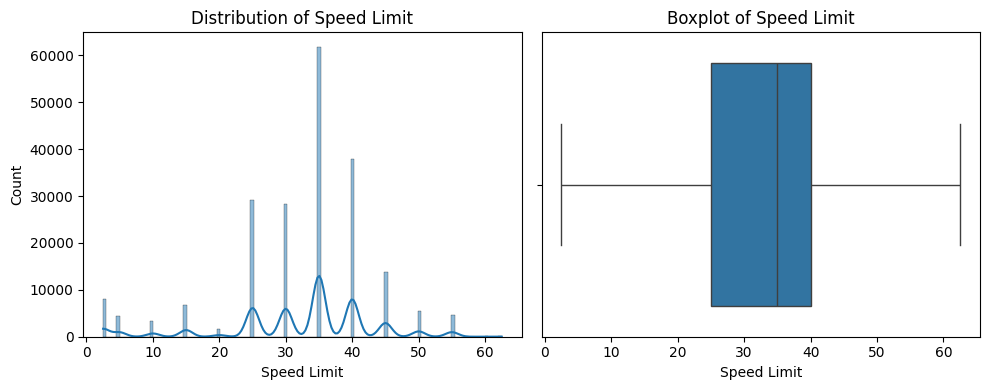


---------- Vehicle Year ----------


,count,mean,std,min,25%,50%,75%,max
Vehicle Year,205539.0,2011.361868,6.47998,1993.0,2007.0,2012.0,2016.0,2025.0


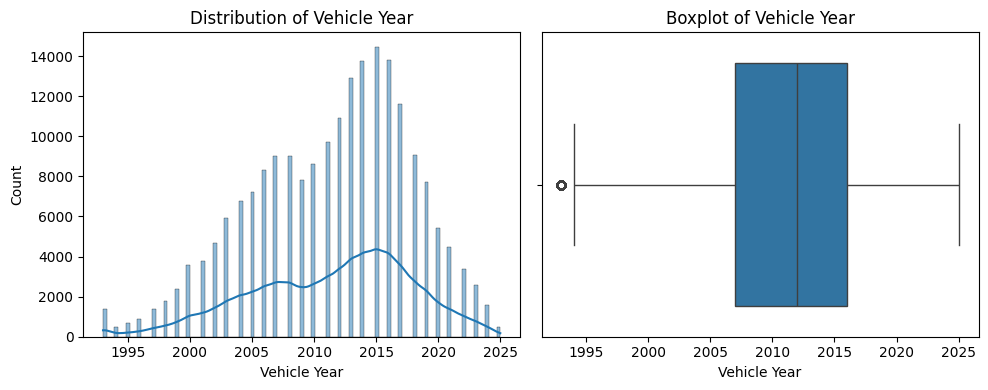


---------- Latitude ----------


,count,mean,std,min,25%,50%,75%,max
Latitude,205539.0,39.082942,0.070796,38.851557,39.024418,39.074846,39.139659,39.312521


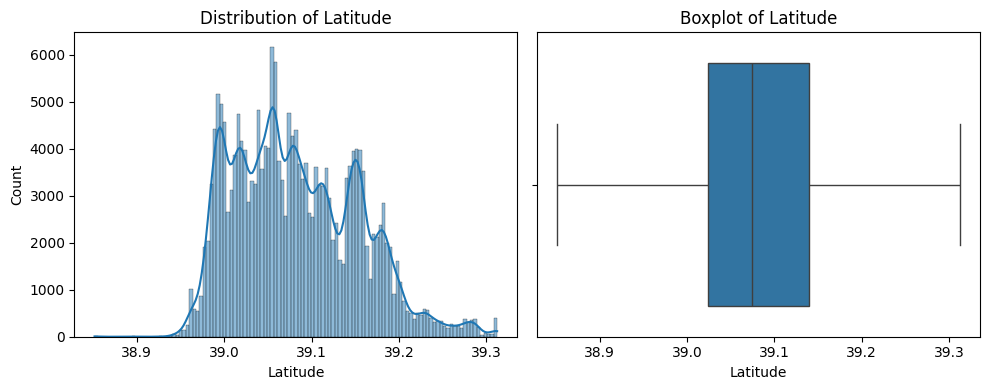


---------- Longitude ----------


,count,mean,std,min,25%,50%,75%,max
Longitude,205539.0,-77.111865,0.094728,-77.414384,-77.189266,-77.10517,-77.039188,-76.81407


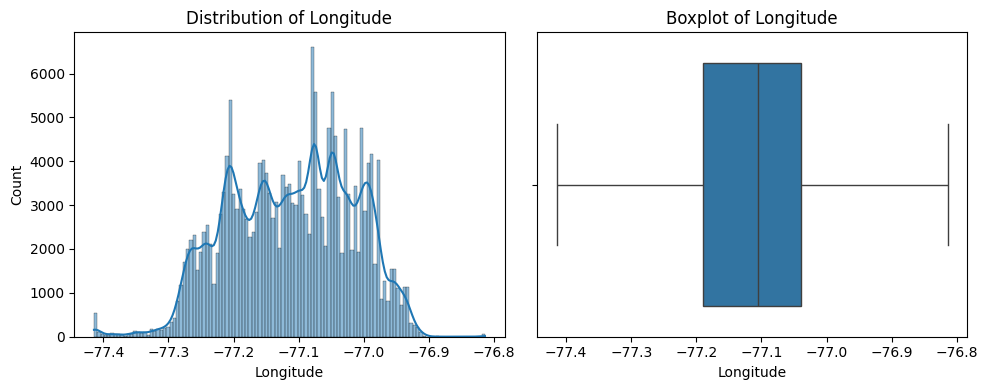


---------- hour ----------


,count,mean,std,min,25%,50%,75%,max
hour,205539.0,13.365274,5.261188,0.0,9.0,14.0,17.0,23.0


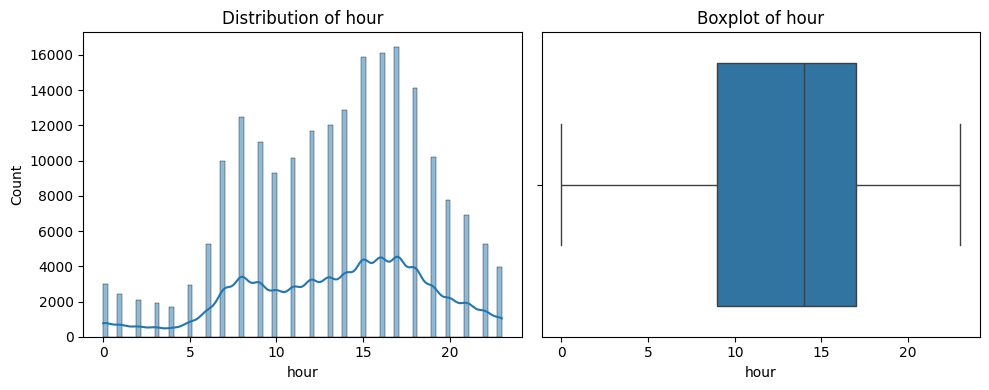


---------- Crash_year ----------


,count,mean,std,min,25%,50%,75%,max
Crash_year,205539.0,2019.710449,3.167699,2015.0,2017.0,2019.0,2023.0,2025.0


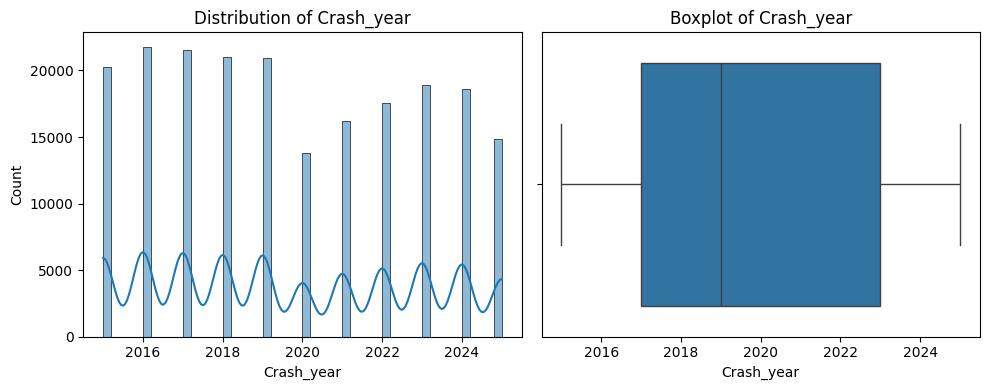


---------- Crash_month ----------


,count,mean,std,min,25%,50%,75%,max
Crash_month,205539.0,6.63981,3.439433,1.0,4.0,7.0,10.0,12.0


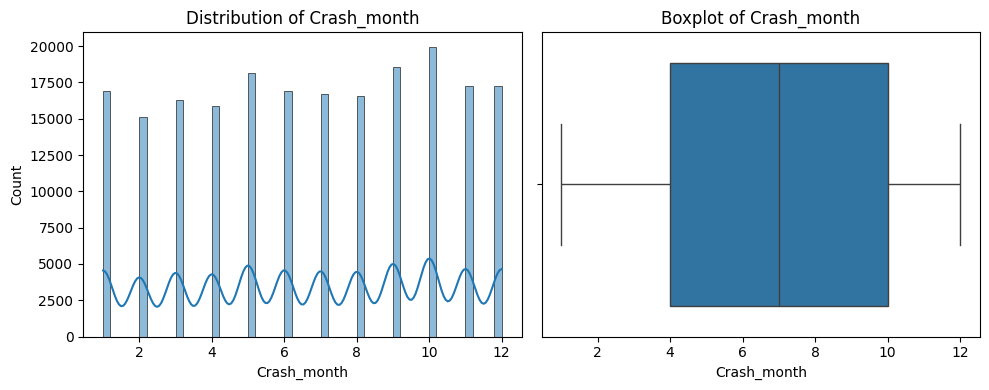


---------- Crash_day ----------


,count,mean,std,min,25%,50%,75%,max
Crash_day,205539.0,15.695357,8.769084,1.0,8.0,16.0,23.0,31.0


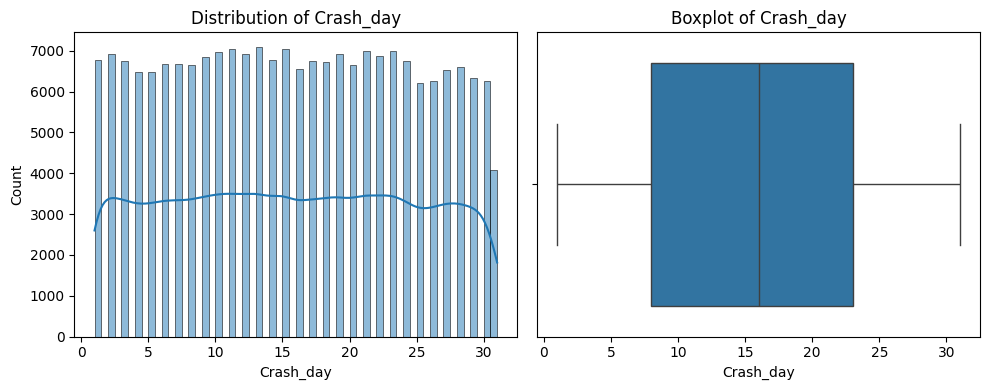


---------- Crash_hour ----------


,count,mean,std,min,25%,50%,75%,max
Crash_hour,205539.0,13.365274,5.261188,0.0,9.0,14.0,17.0,23.0


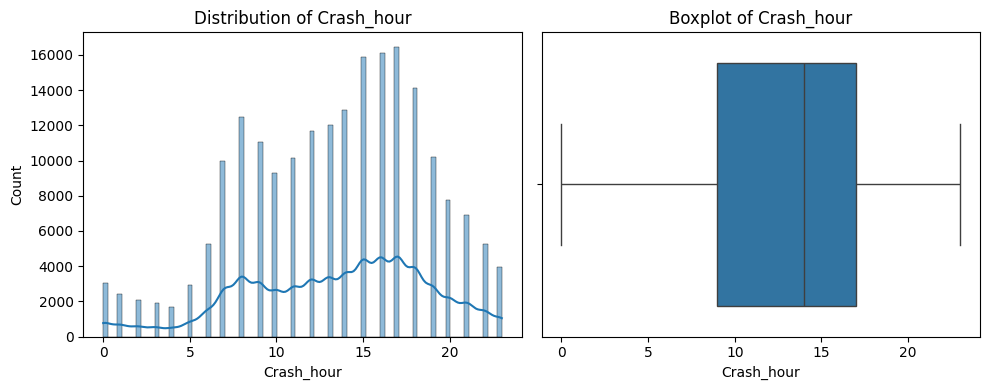


---------- Crash_week ----------


,count,mean,std,min,25%,50%,75%,max
Crash_week,205539.0,27.102633,14.993967,1.0,14.0,27.0,40.0,53.0


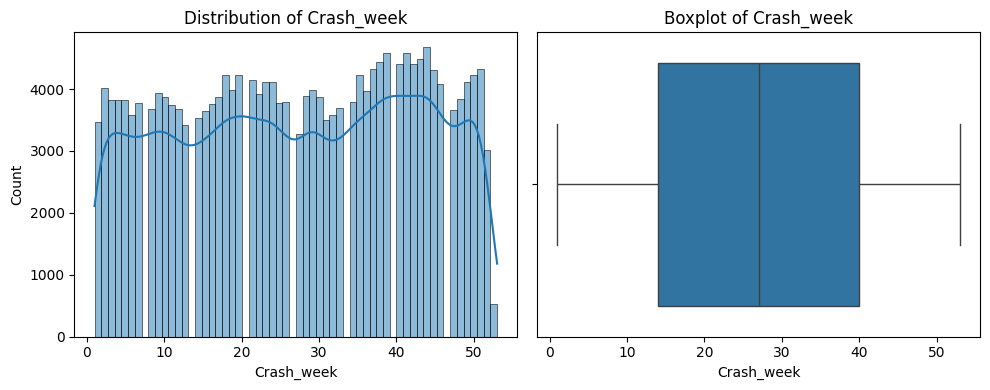

In [ ]:
for col in num:
    print(f"\n---------- {col} ----------")
    display(df[col].describe().to_frame().T)

    plt.figure(figsize=(10,4))

    # Histogram
    plt.subplot(1,2,1)
    sns.histplot(df[col], kde=True)
    plt.title(f"Distribution of {col}")

    # Boxplot
    plt.subplot(1,2,2)
    sns.boxplot(x=df[col])
    plt.title(f"Boxplot of {col}")

    plt.tight_layout()
    plt.show()

## **Univariate Numerical Feature Insights**

| Feature | Key Inference |
|--------|----------------|
| **Speed Limit** | Most values lie between **25–40 mph**, matching typical urban roads. Distribution shows clear mode peaks at common legal limits. Outliers exist at very low (2.5) and high (62.5) ends. |
| **Vehicle Year** | Majority of vehicles fall between **2007–2018**, with a peak around **2012–2016**. Few older (<1995) or very new (>2020) vehicles create mild outliers. |
| **Latitude** | Distribution tightly clustered around **39.08**, indicating crashes occur in a very small geographic zone. Small spread and no major outliers. |
| **Longitude** | Centered around **–77.11**, again confirming a localized study area. Mild skew but no extreme outliers. |
| **Hour** | Crashes peak between **12 PM – 5 PM**, reflecting high traffic periods. Very few incidents occur at night (0–5 AM). Boxplot shows wide spread but no severe outliers. |

## **Conclusion**
The numeric variables show stable, interpretable patterns: speed limits reflect urban roads; vehicle years indicate a modern fleet; lat/long values confirm a geographically compact dataset; and crash timing aligns with daytime traffic behavior. These distributions support reliable downstream analysis with minimal preprocessing.

# 2. **Univariate (Category)**

## **Univariate Analysis for Categorical Features**
The following analysis summarizes the count for all categorical columns using a loop-based approach.


Plotting for: Report Number


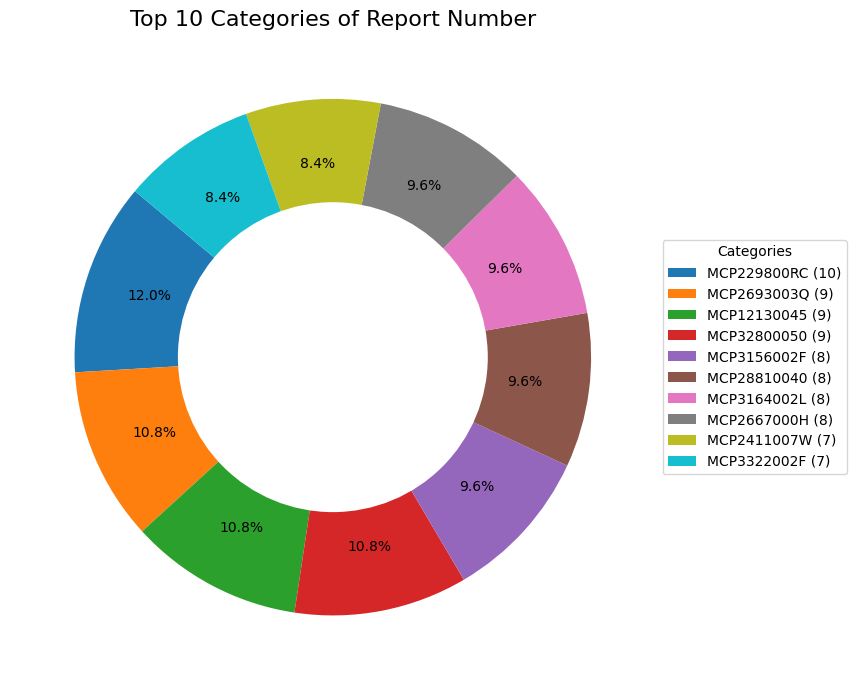


Plotting for: Local Case Number


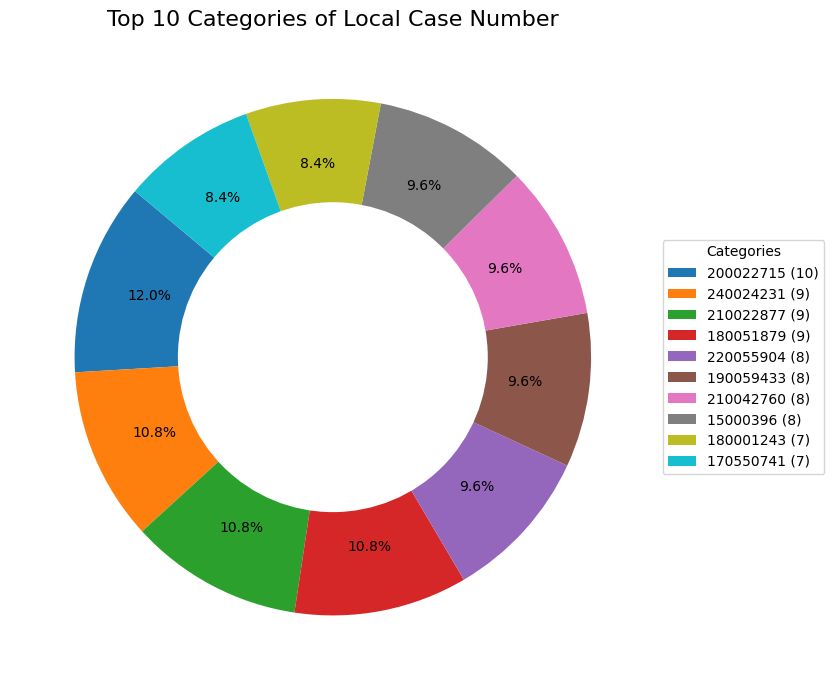


Plotting for: Agency Name


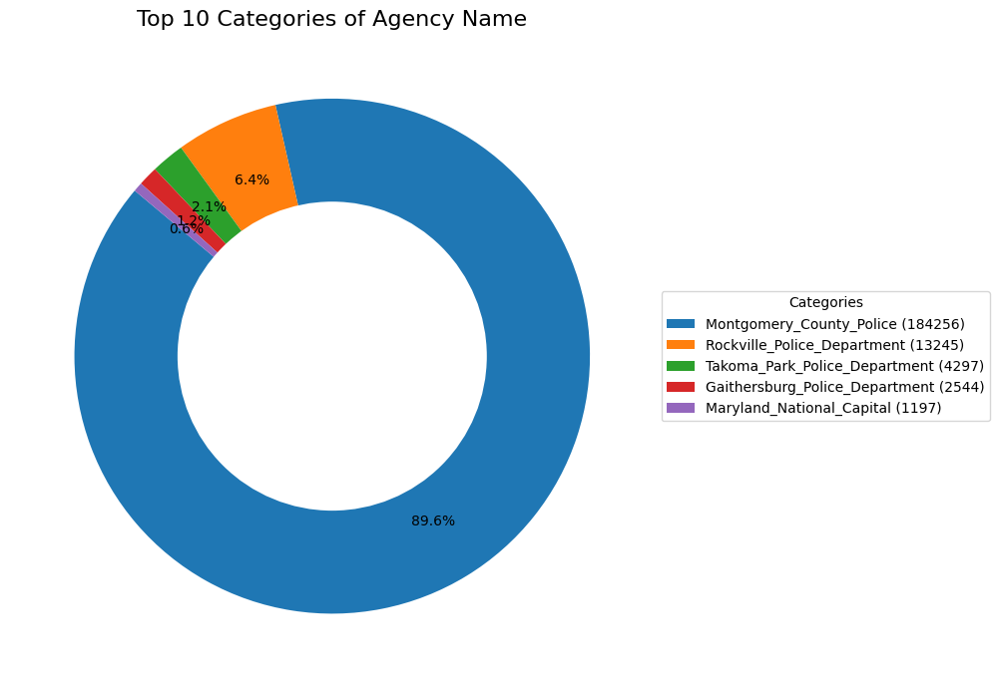


Plotting for: ACRS Report Type


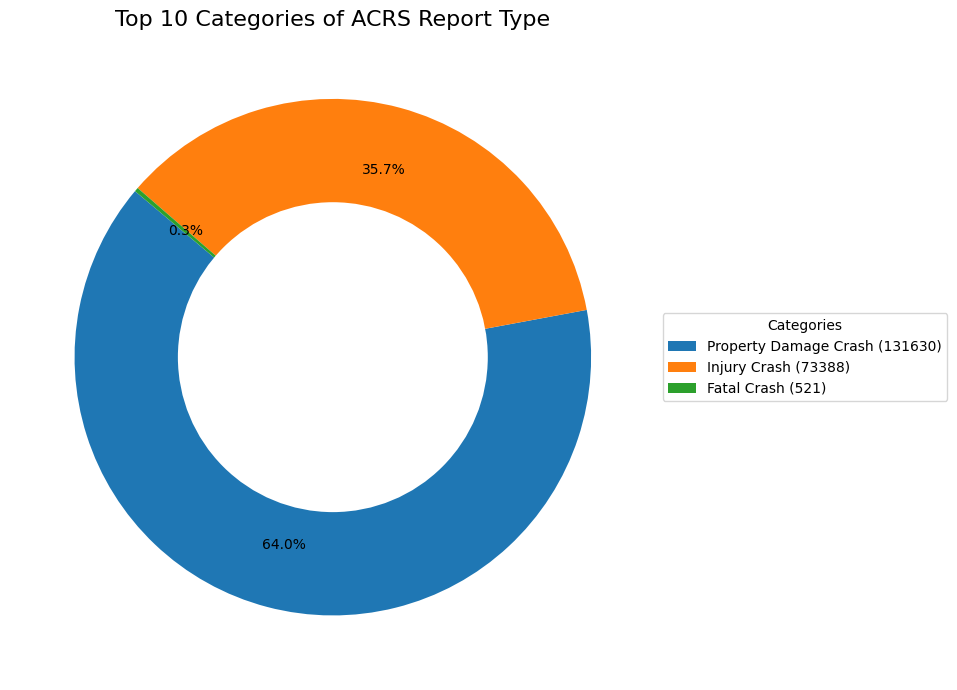


Plotting for: Route Type


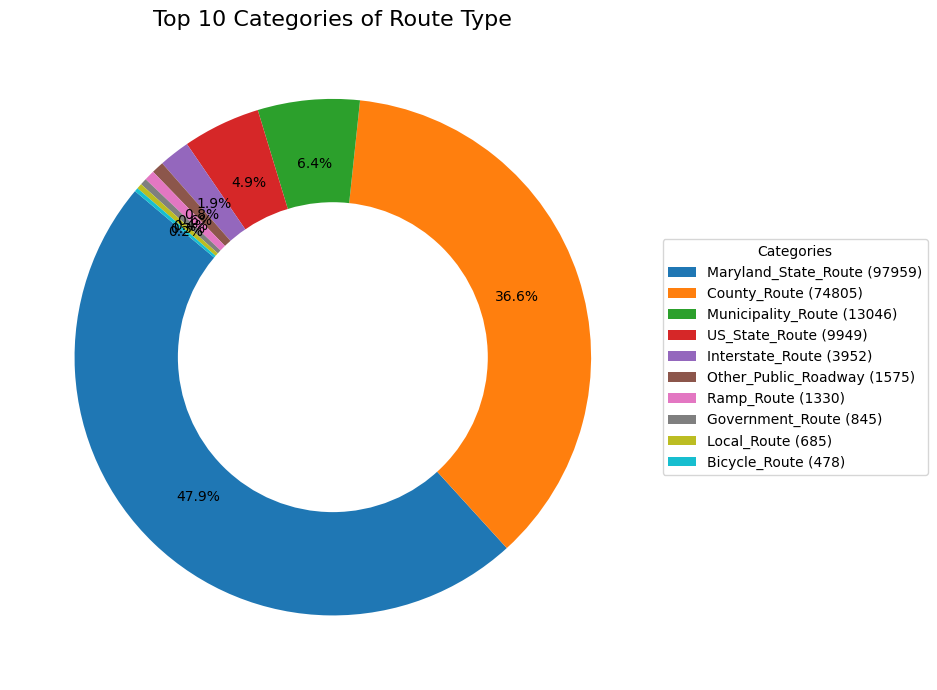


Plotting for: Road Name


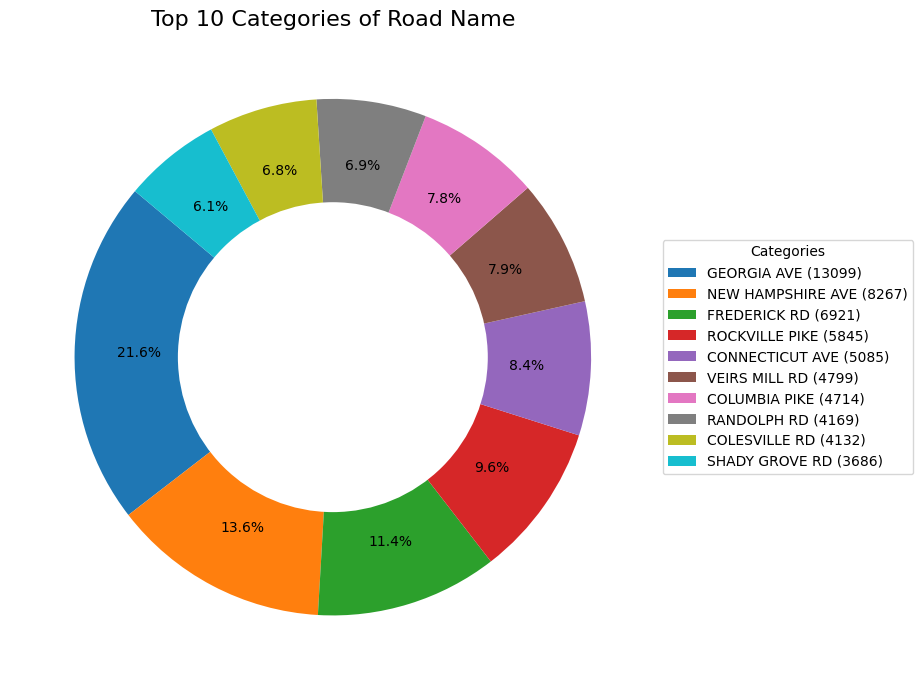


Plotting for: Cross-Street Name


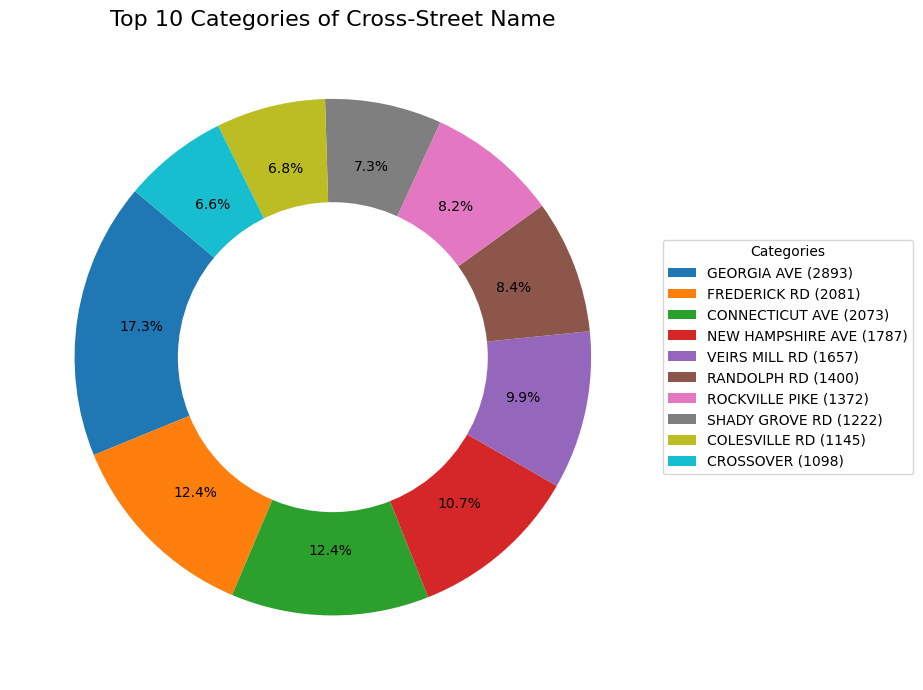


Plotting for: Collision Type


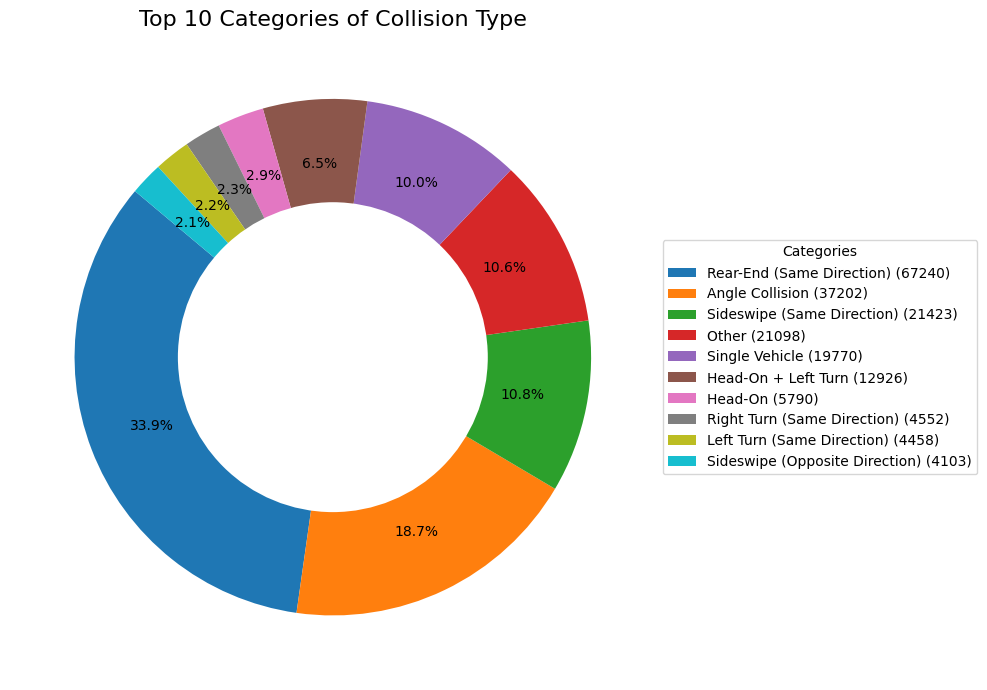


Plotting for: Weather


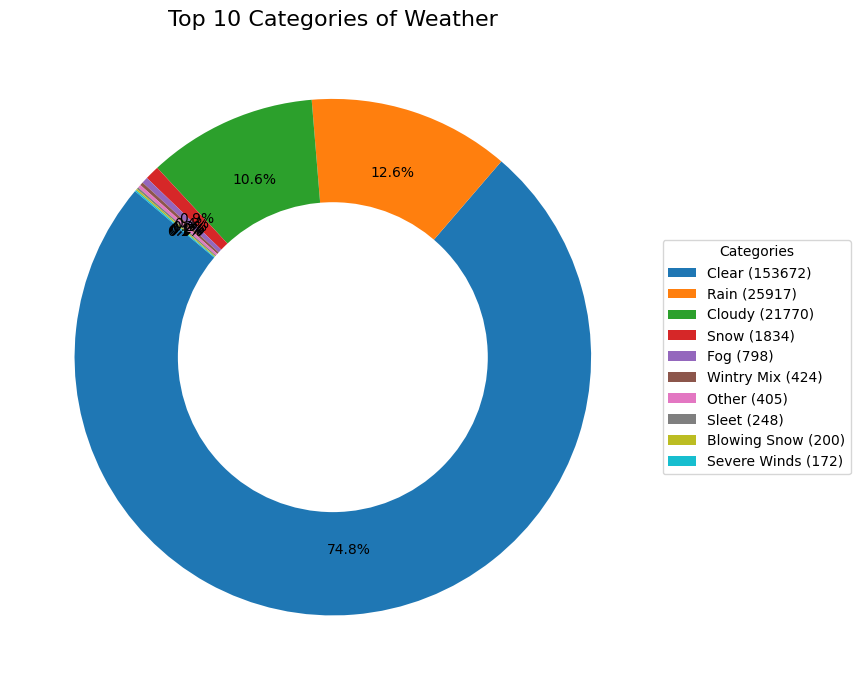


Plotting for: Surface Condition


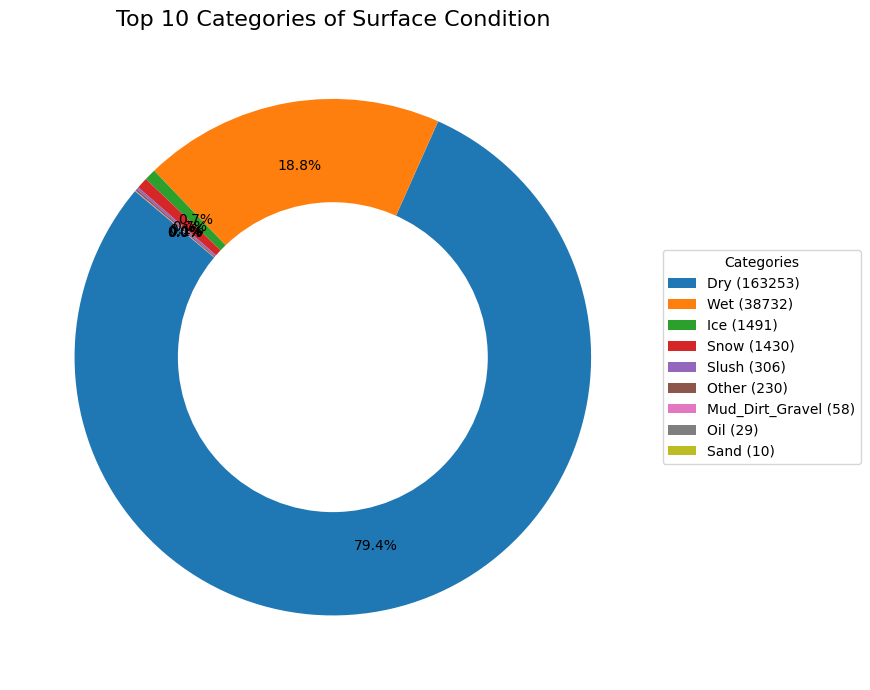


Plotting for: Light


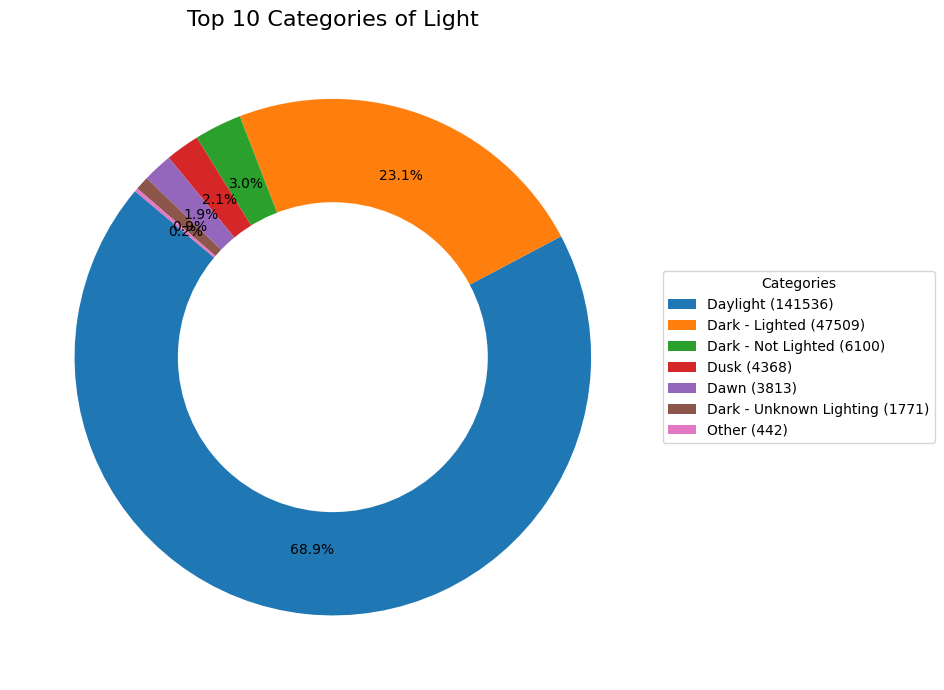


Plotting for: Traffic Control


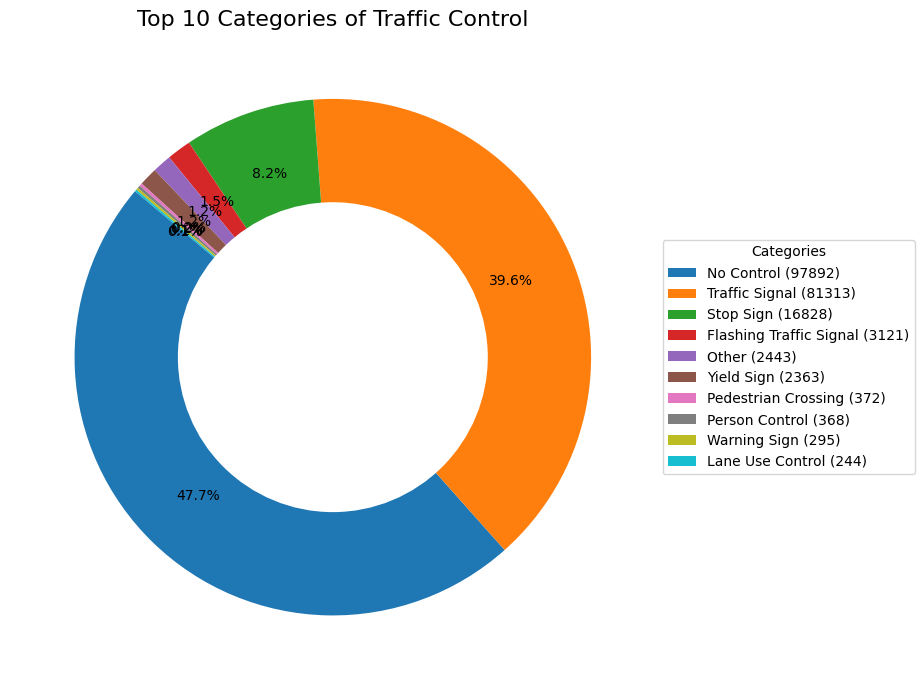


Plotting for: Driver Substance Abuse


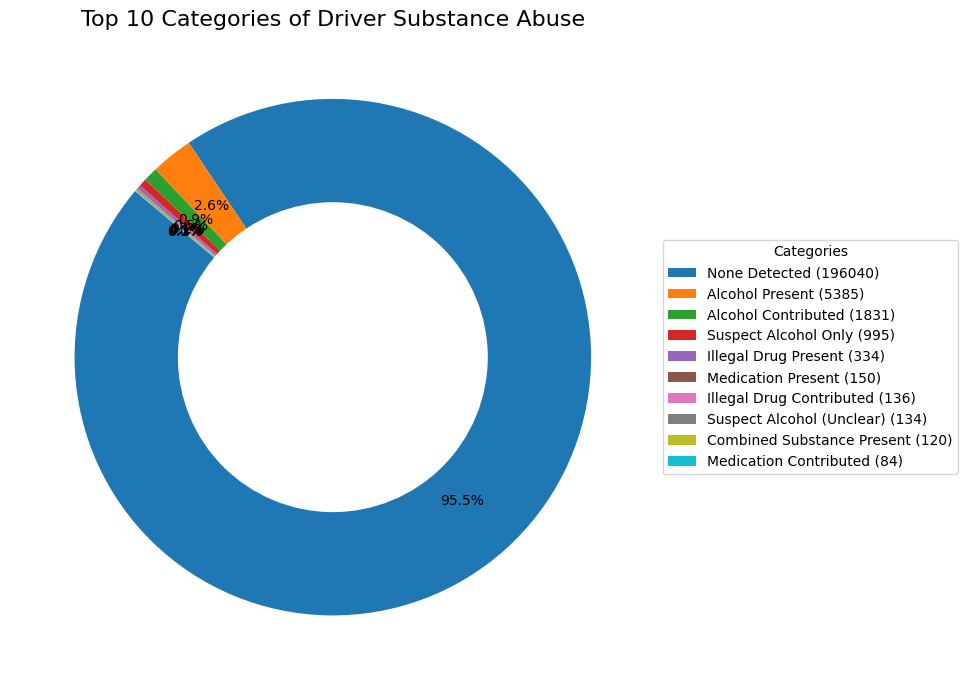


Plotting for: Person ID


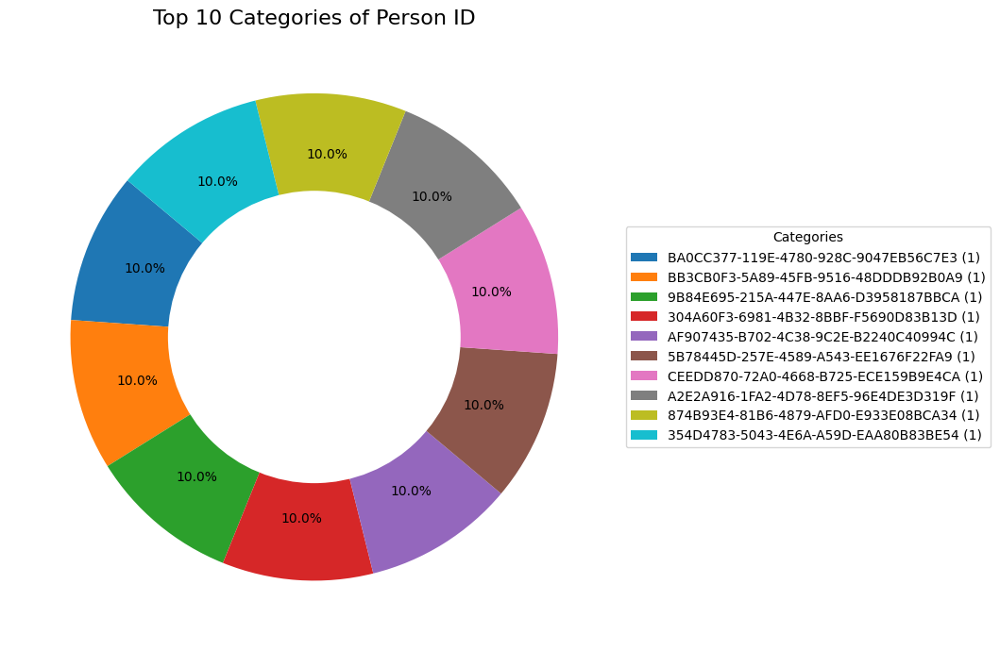


Plotting for: Driver At Fault


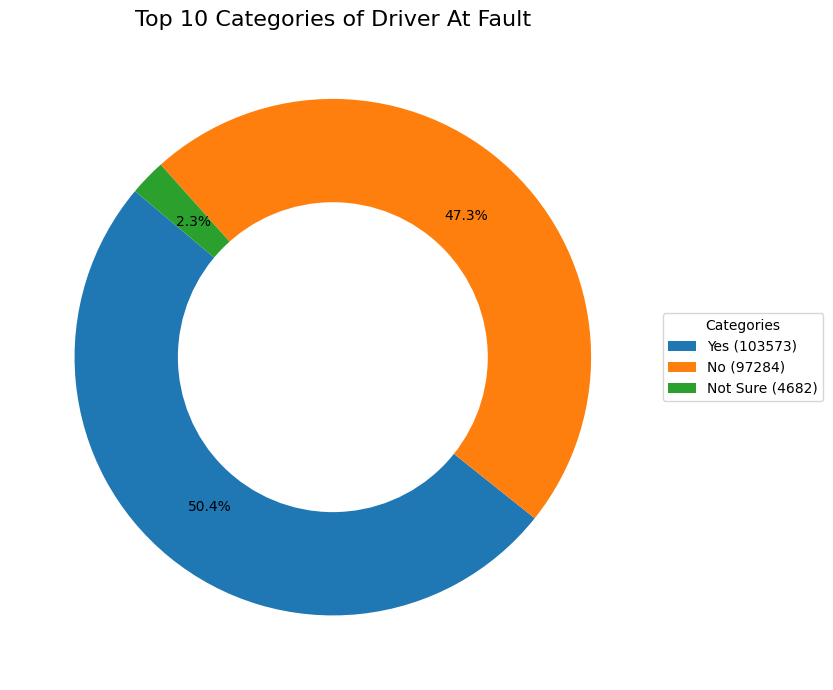


Plotting for: Injury Severity


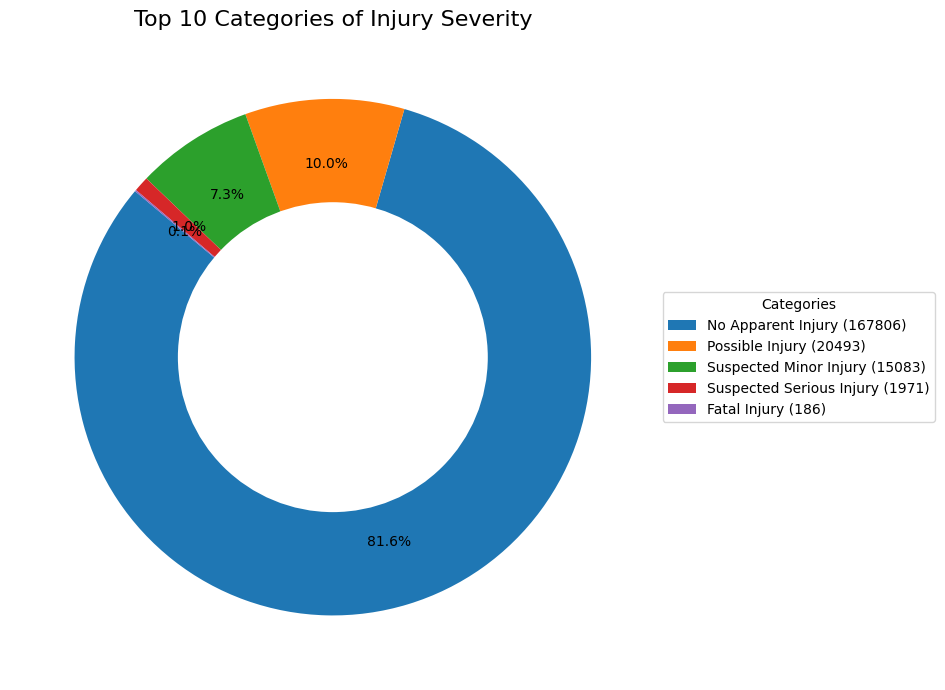


Plotting for: Driver Distracted By


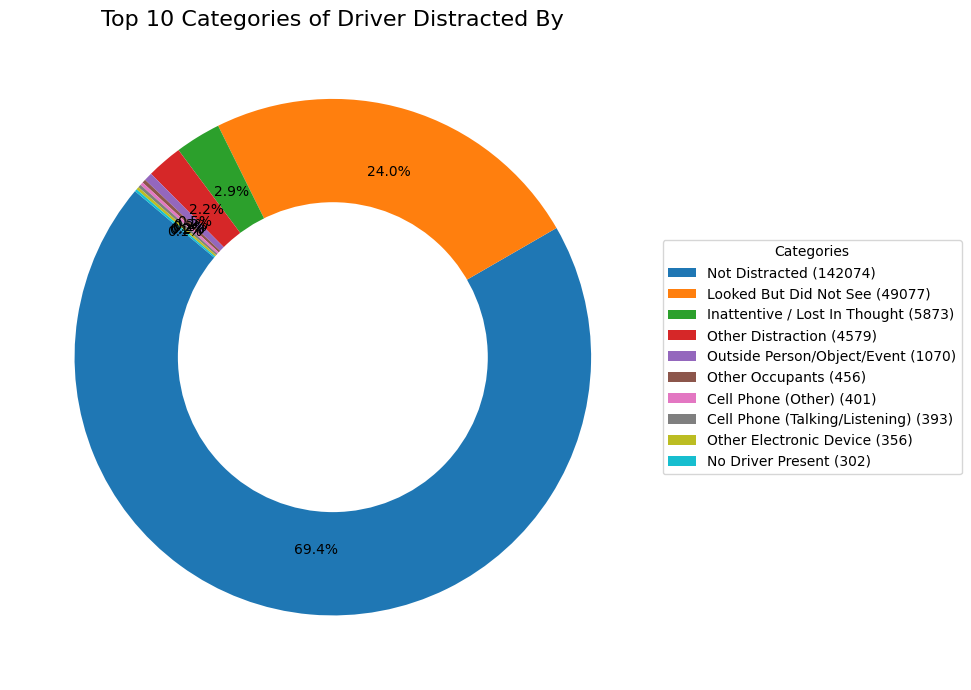


Plotting for: Drivers License State


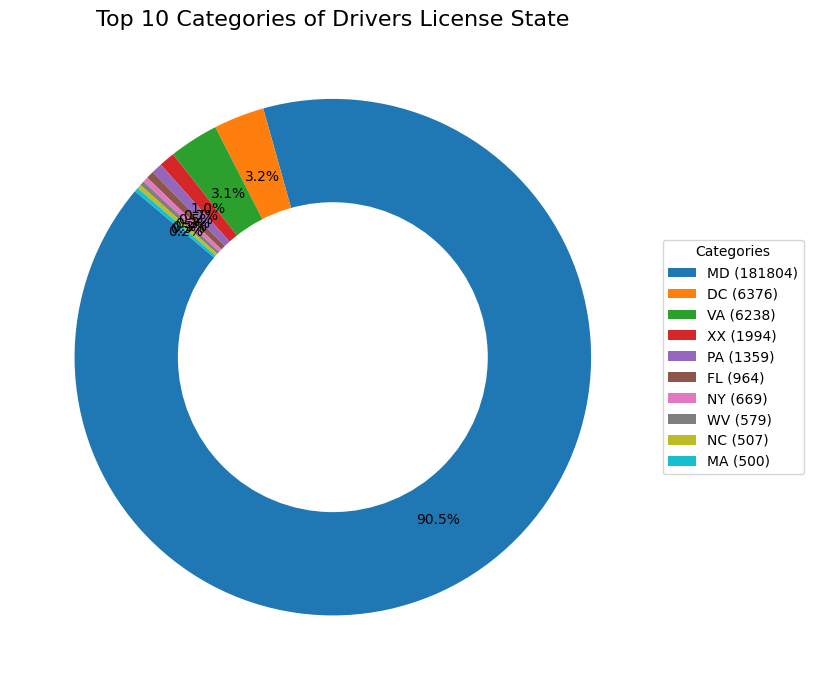


Plotting for: Vehicle ID


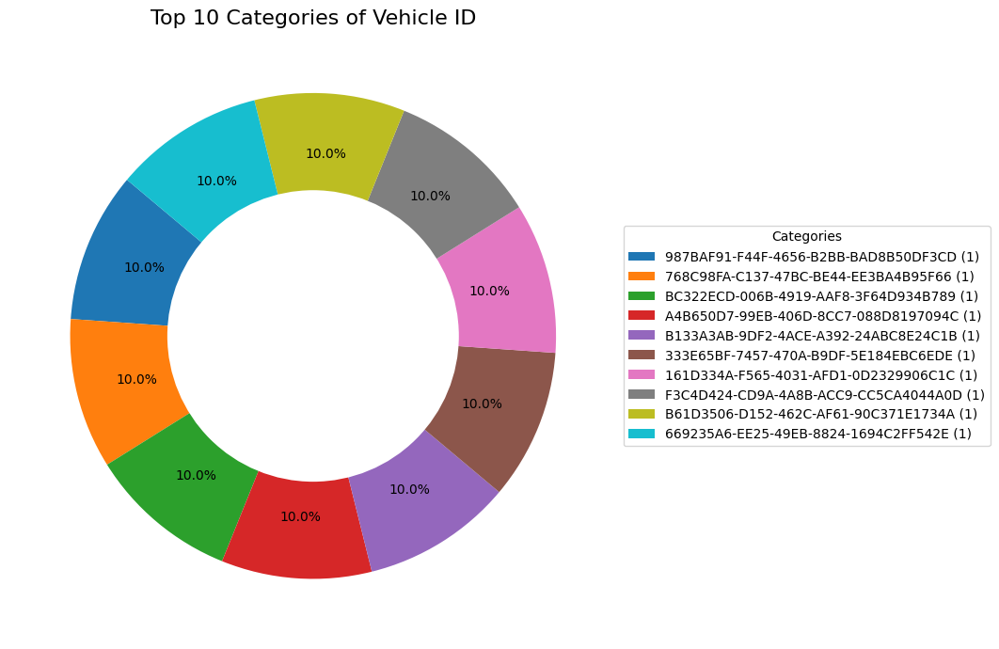


Plotting for: Vehicle Damage Extent


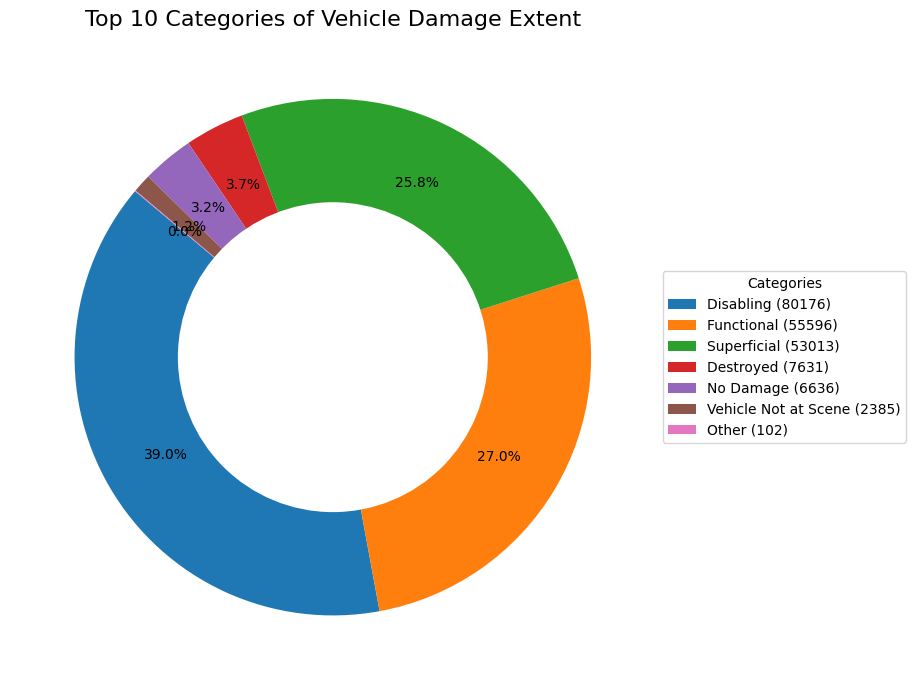


Plotting for: Vehicle First Impact Location


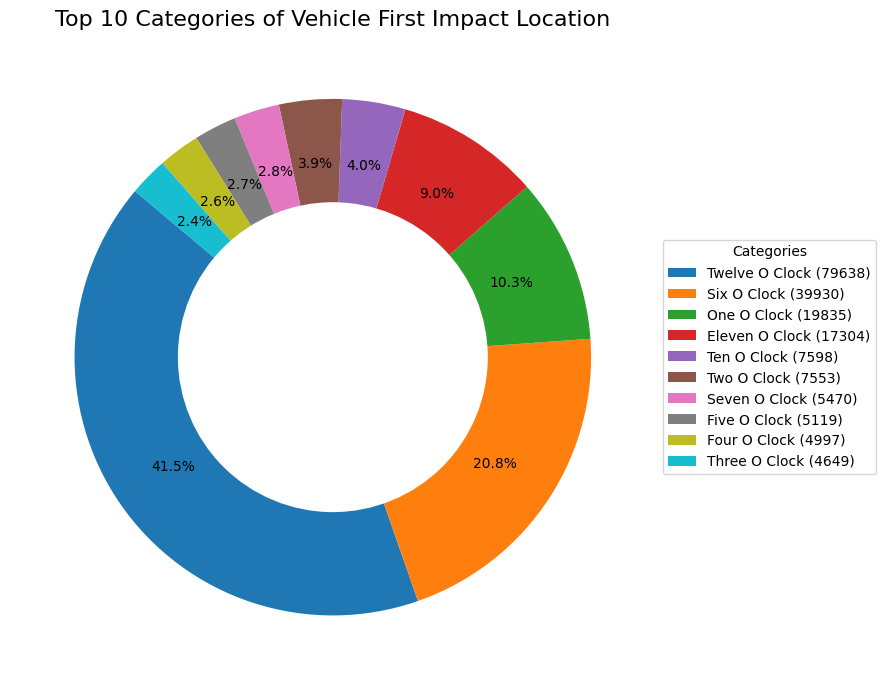


Plotting for: Vehicle Body Type


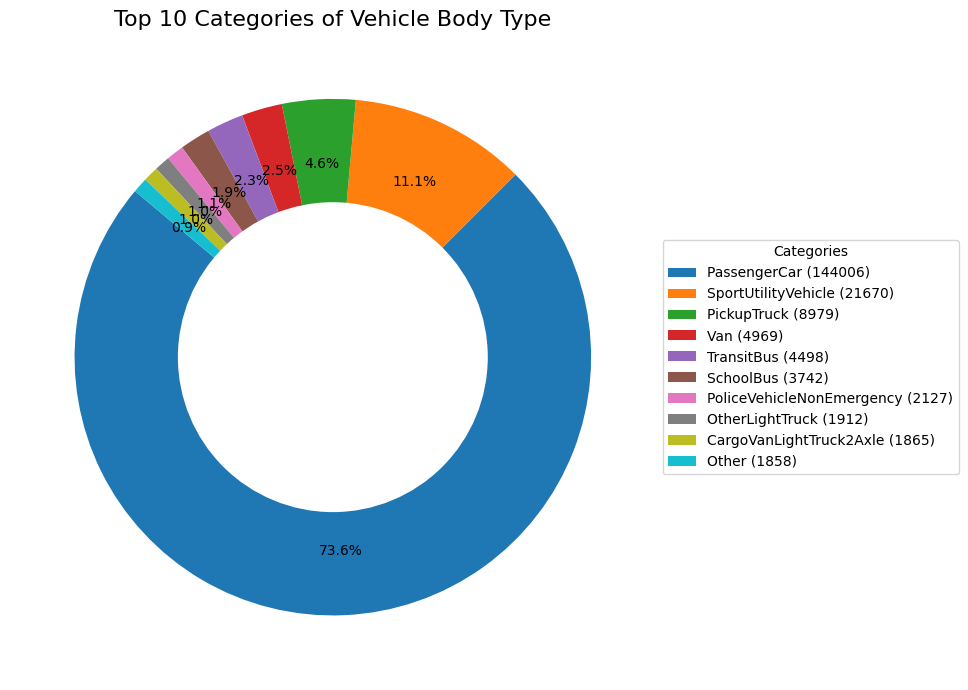


Plotting for: Vehicle Movement


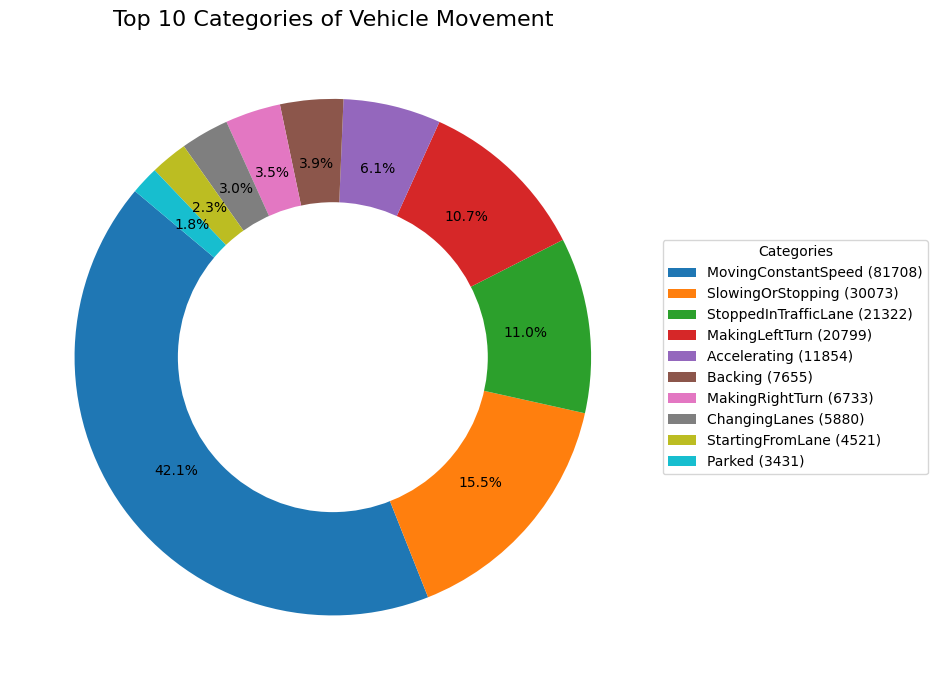


Plotting for: Vehicle Going Dir


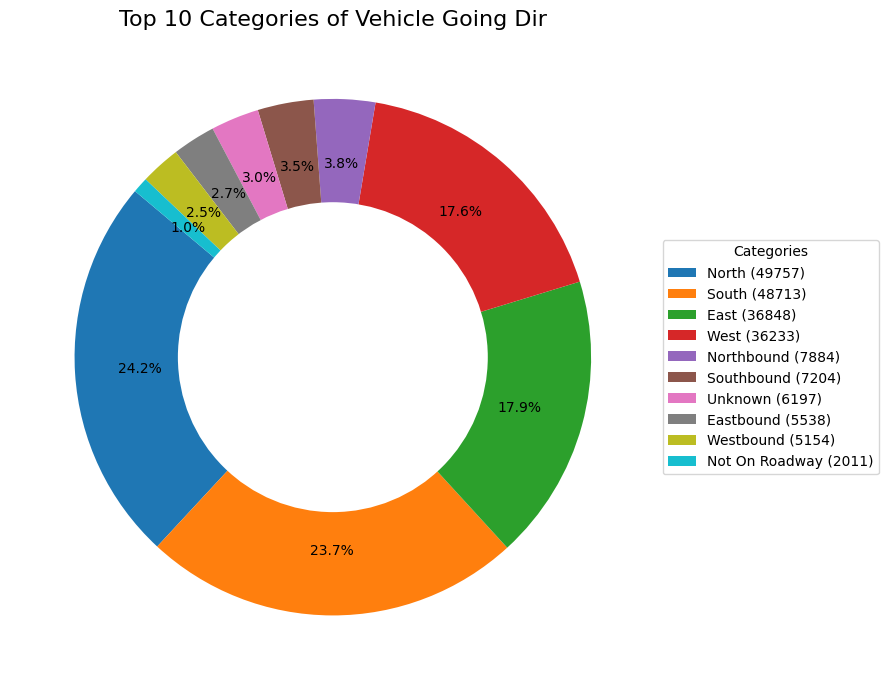


Plotting for: Driverless Vehicle


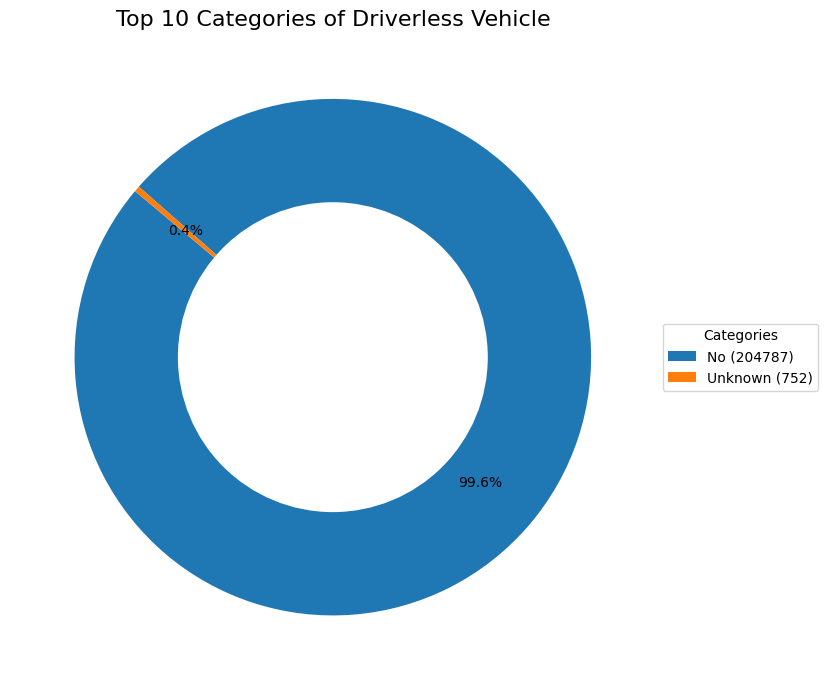


Plotting for: Parked Vehicle


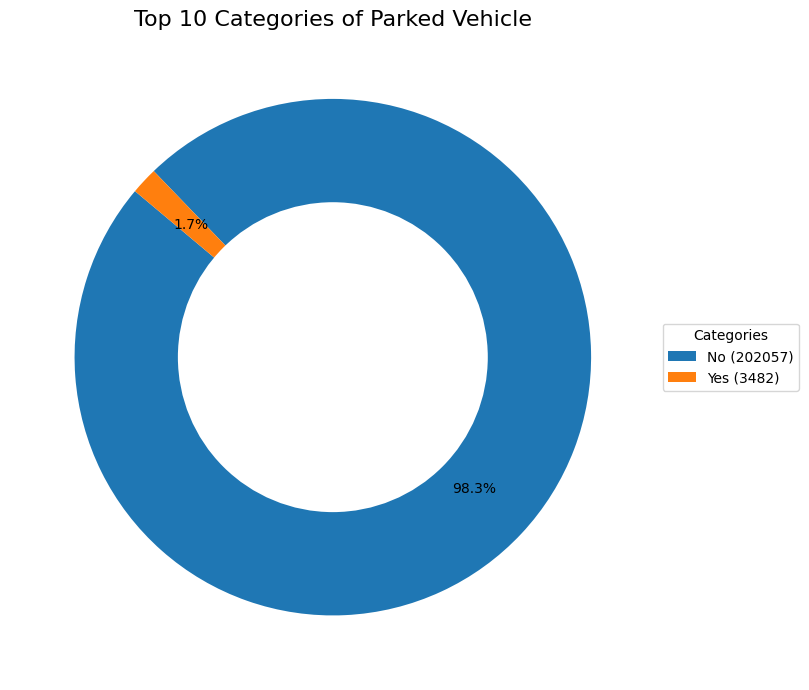


Plotting for: Vehicle Make


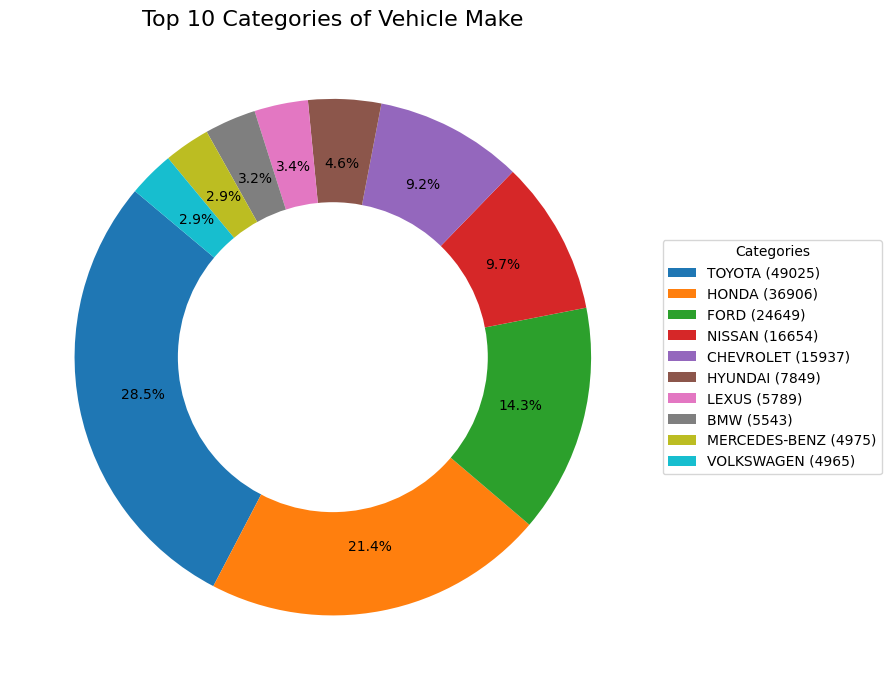


Plotting for: Vehicle Model


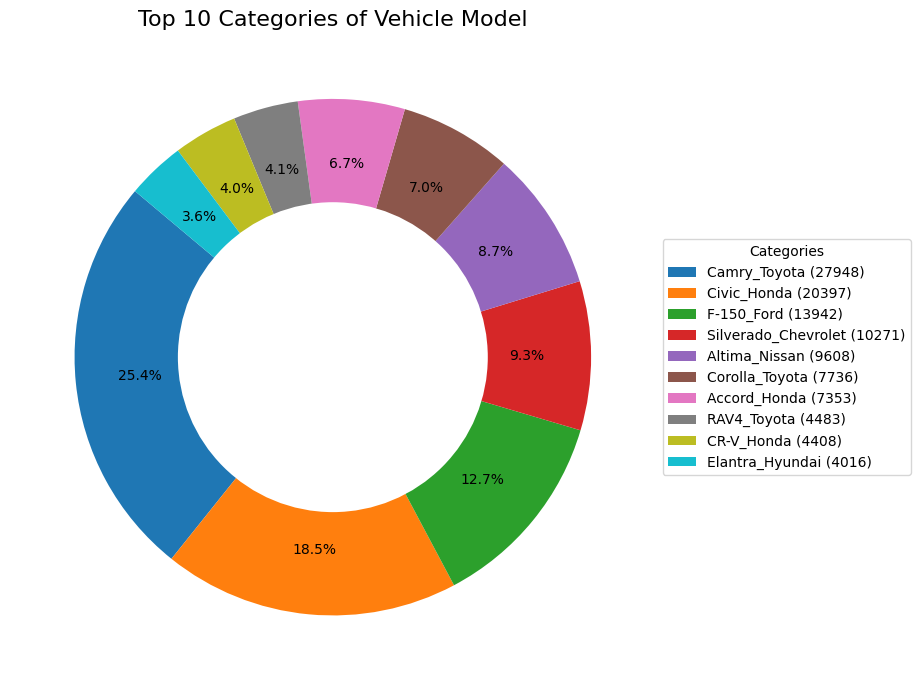


Plotting for: Circumstance_Category


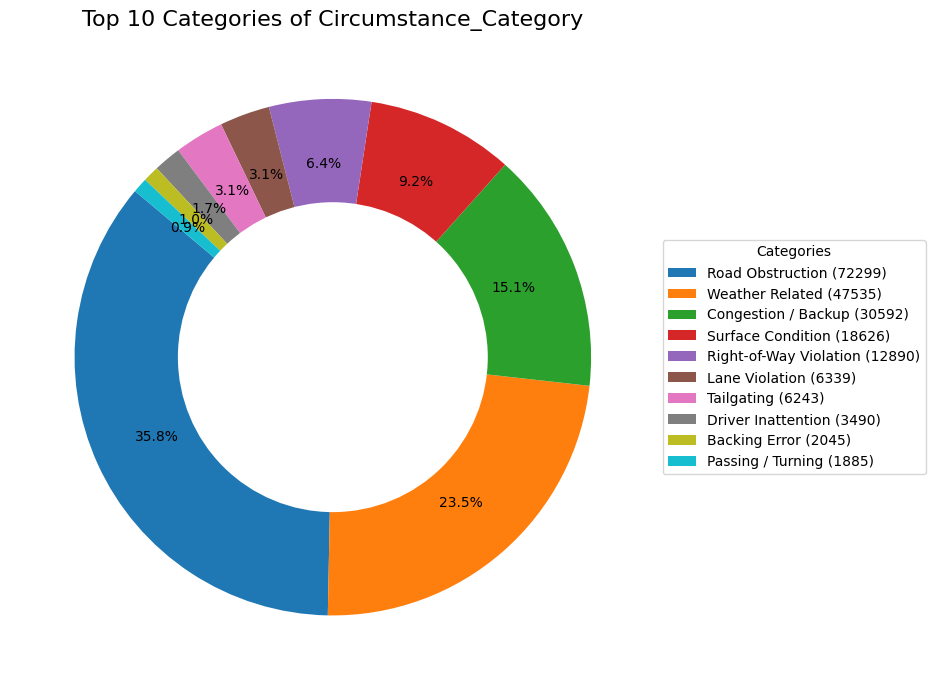


Plotting for: Crash_day_name


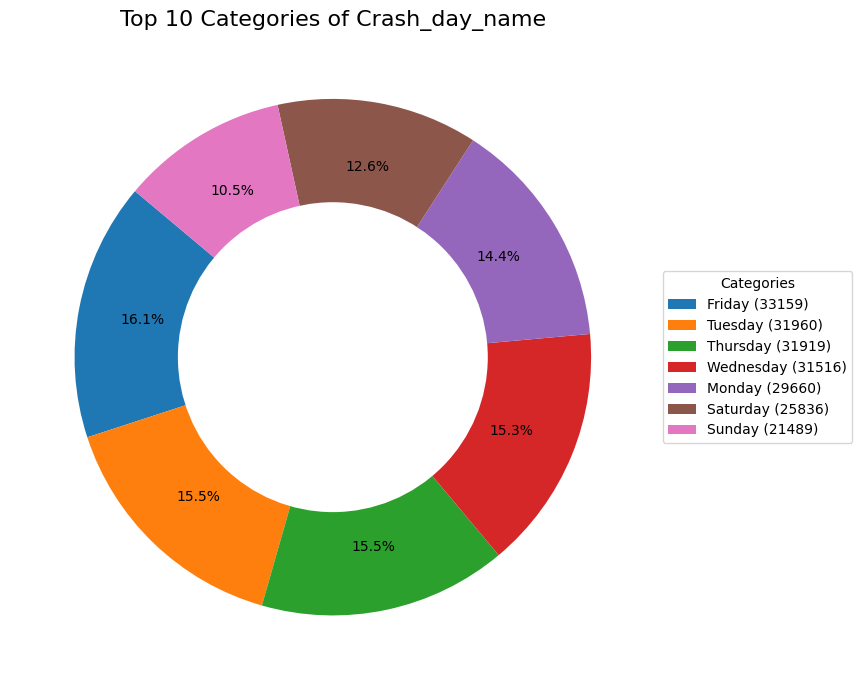

In [9]:
import matplotlib.pyplot as plt

for col in cat:
    print(f"\nPlotting for: {col}")

    top10 = df[col].value_counts().head(10)

    # --- Pie Chart ---
    plt.figure(figsize=(10, 7))

    plt.pie(
        top10.values,
        labels=None,  # labels will go to legend for clarity
        autopct='%1.1f%%',
        pctdistance=0.75,
        startangle=140
    )

    # Donut style
    centre_circle = plt.Circle((0,0), 0.60, fc='white')
    fig = plt.gcf()
    fig.gca().add_artist(centre_circle)

    plt.title(f"Top 10 Categories of {col}", fontsize=16)

    # CLEAR LEGEND (category + count)
    legend_labels = [f"{idx} ({val})" for idx, val in top10.items()]
    plt.legend(
        legend_labels,
        loc="center left",
        bbox_to_anchor=(1, 0.5),
        fontsize=10,
        title="Categories"
    )

    plt.tight_layout()
    plt.show()


## **Univariate Categorical Feature Insights**

| Feature | Key Inference |
|---|---|
| **Report Number / Local Case Number** | These are unique identifiers with extremely high cardinality, serving primarily as record keys rather than analytical features. |
| **Agency Name** | Overwhelmingly dominated by `Montgomery_County_Police`, indicating a localized dataset. |
| **ACRS Report Type** | `Property Damage Crash` is the most common type, suggesting a majority of incidents are non-injury. |
| **Route Type** | `Maryland_State_Route` is the most frequent, indicating that a significant portion of crashes occur on state-maintained roads. |
| **Road Name / Cross-Street Name** | High diversity, but `GEORGIA AVE` is a clear hotspot, appearing most frequently in both road name and cross-street contexts. |
| **Collision Type** | `Rear-End (Same Direction)` is the predominant collision type, often associated with traffic congestion or sudden stops. |
| **Circumstance_Category** | `Road Obstruction` is the most cited circumstance, pointing to potential infrastructure or hazard-related issues. |
| **Weather / Surface Condition / Light** | The majority of crashes occur under ideal conditions (`Clear` weather, `Dry` surface, `Daylight`), suggesting that factors other than environmental severity are primary drivers. |
| **Traffic Control** | `No Control` is the most frequent, highlighting that many incidents happen in areas without traffic signals or other formal controls. |
| **Driver Substance Abuse** | `None Detected` is overwhelmingly reported, which might suggest underreporting or that substance abuse is not a primary factor in most recorded incidents. |
| **Person ID / Vehicle ID** | Unique identifiers for individuals and vehicles, providing no direct analytical insights into crash causes or patterns. |
| **Driver At Fault** | `Yes` is the most common, indicating that in most cases, a specific driver was identified as being responsible. |
| **Injury Severity** | `No Apparent Injury` is the most common outcome, aligning with the prevalence of property damage crashes. |
| **Driver Distracted By** | `Not Distracted` is the top response, similar to substance abuse, this could be due to underreporting of distraction. |
| **Drivers License State** | Dominated by `MD`, confirming the local focus of the dataset. |
| **Vehicle Damage Extent** | `Disabling` is the most common outcome, indicating significant vehicle damage in a large number of incidents. |
| **Vehicle First Impact Location** | `Twelve O Clock` (front impact) is the most frequent, consistent with rear-end collisions. |
| **Vehicle Body Type** | `PassengerCar` is the most common, which is typical for urban and suburban crash datasets. |
| **Vehicle Movement** | `MovingConstantSpeed` is the highest, suggesting many incidents occur while vehicles are in regular motion. |
| **Vehicle Going Dir** | `North` is the most frequently reported direction, potentially indicating a common travel direction on major roads. |
| **Driverless Vehicle / Parked Vehicle** | `No` for both, indicating that almost all incidents involve active, driven vehicles. |
| **Vehicle Make / Vehicle Model** | `TOYOTA` is the most common make, with `Camry_Toyota` being the most frequent model, reflecting popular vehicle choices in the region.

## **Conclusion**
The univariate analysis of categorical features reveals a dataset primarily focused on `Montgomery County`, dominated by `Property Damage Crashes` under `Clear`, `Dry`, and `Daylight` conditions. `Rear-end collisions` are common, with `Road Obstruction` being a frequent circumstance. The data heavily features `PassengerCars` and `Toyota` vehicles, driven by `Maryland` residents. Many crashes occur in areas `without traffic control`, and in most cases, a driver is identified `at fault`. While identifiers like `Report Number`, `Local Case Number`, `Person ID`, and `Vehicle ID` show high cardinality, other features like `Road Name` and `Cross-Street Name` have specific hotspots (e.g., `GEORGIA AVE`). Features like `Driver Substance Abuse` and `Driver Distracted By` are predominantly marked as `None Detected` or `Not Distracted`, which might warrant further investigation regarding reporting completeness. Overall, these insights provide a strong foundation for understanding the characteristics of crashes in this specific geographic context.

# **Bi-Variate Analysis**

## **1) Bivariate Analysis: Numeric vs Numeric (Scatterplot + Correlation)**

 ------------------------- Speed Limit vs Vehicle Year -------------------------
Correlation: -0.03961063374255867


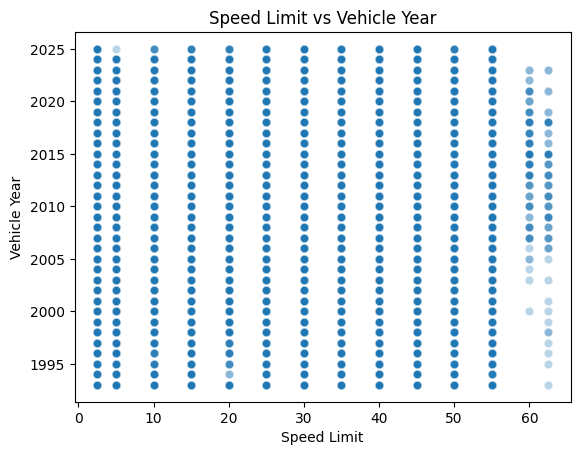

 ------------------------- Speed Limit vs Latitude -------------------------
Correlation: 0.10136232209009712


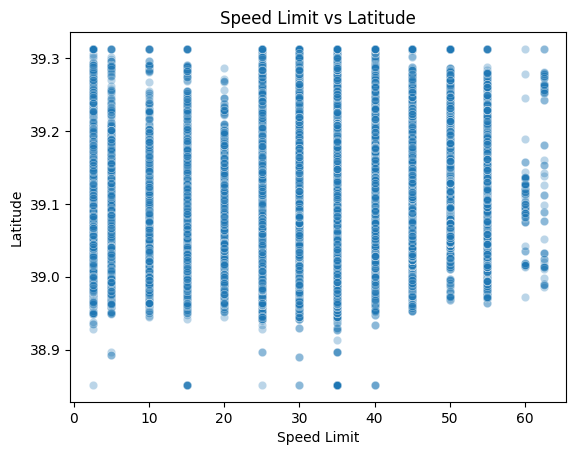

 ------------------------- Speed Limit vs Longitude -------------------------
Correlation: -0.0163071948587725


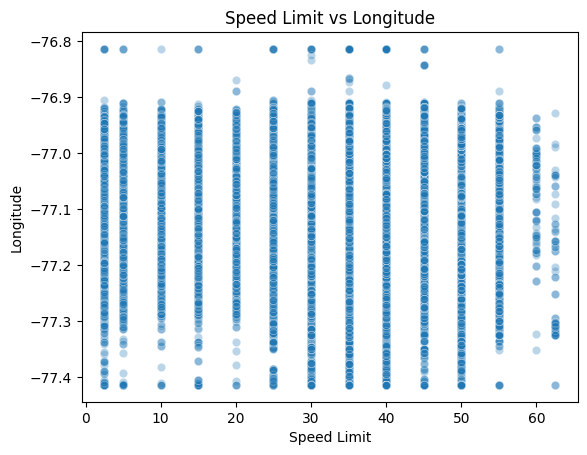

 ------------------------- Speed Limit vs hour -------------------------
Correlation: -0.01487050132651916


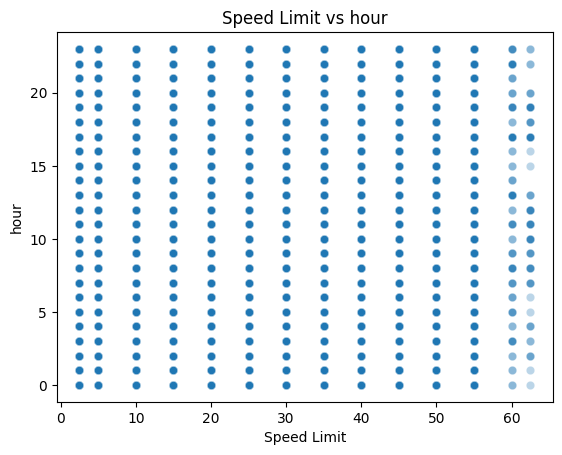

 ------------------------- Speed Limit vs Crash_year -------------------------
Correlation: -0.07886748713896606


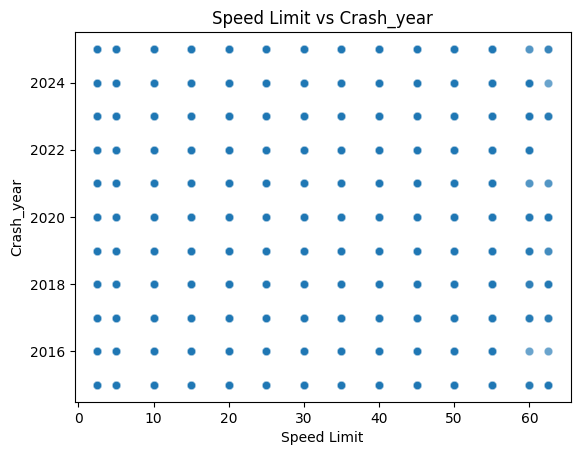

 ------------------------- Speed Limit vs Crash_month -------------------------
Correlation: 0.014647628358155886


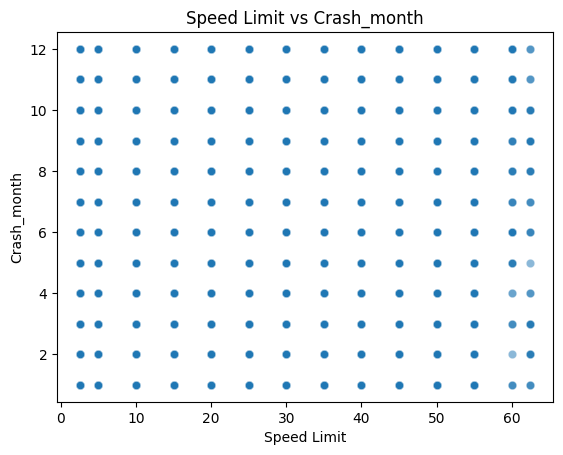

 ------------------------- Speed Limit vs Crash_day -------------------------
Correlation: 0.0023813154810474247


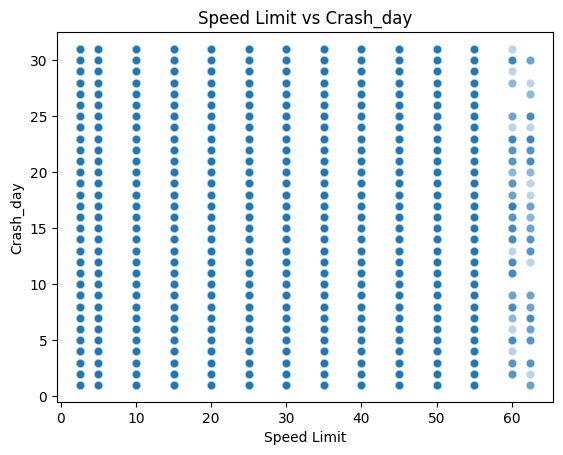

 ------------------------- Speed Limit vs Crash_hour -------------------------
Correlation: -0.01487050132651916


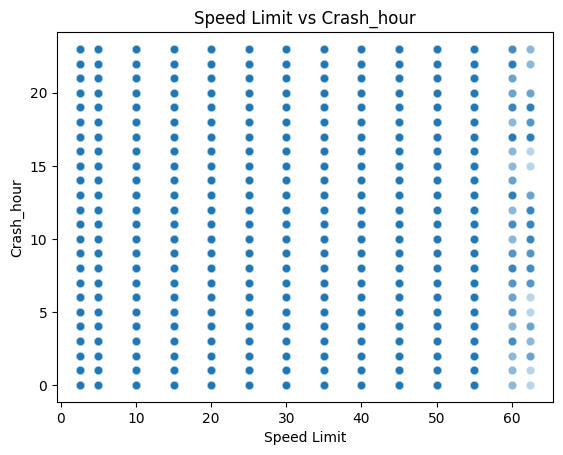

 ------------------------- Speed Limit vs Crash_week -------------------------
Correlation: 0.01589297873939715


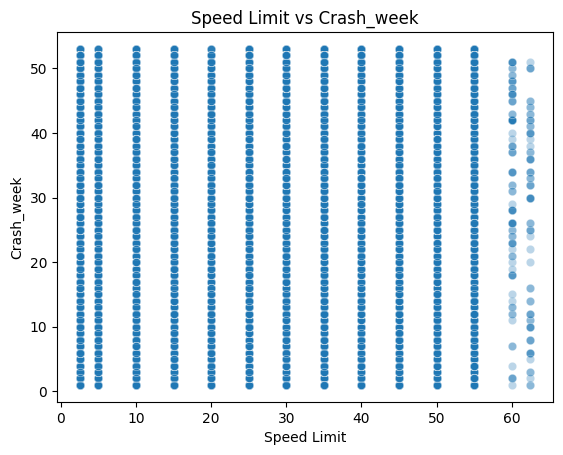

 ------------------------- Vehicle Year vs Latitude -------------------------
Correlation: -0.017224920291095458


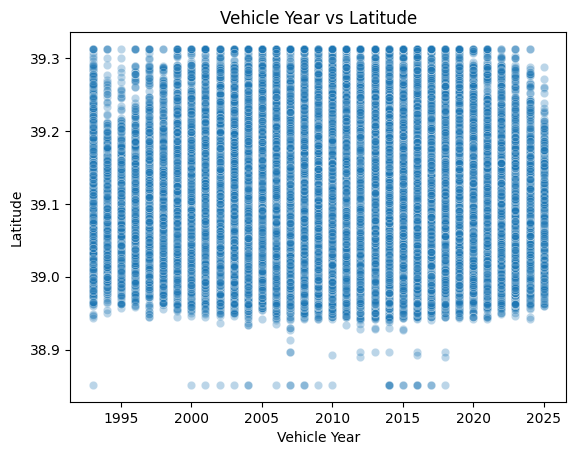

 ------------------------- Vehicle Year vs Longitude -------------------------
Correlation: -0.024650884970029815


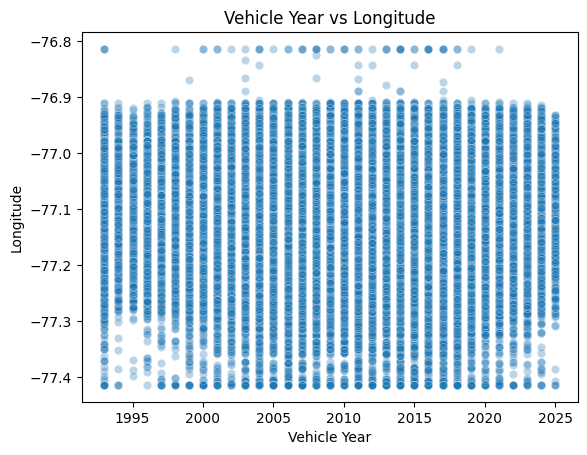

 ------------------------- Vehicle Year vs hour -------------------------
Correlation: -0.006438920429909619


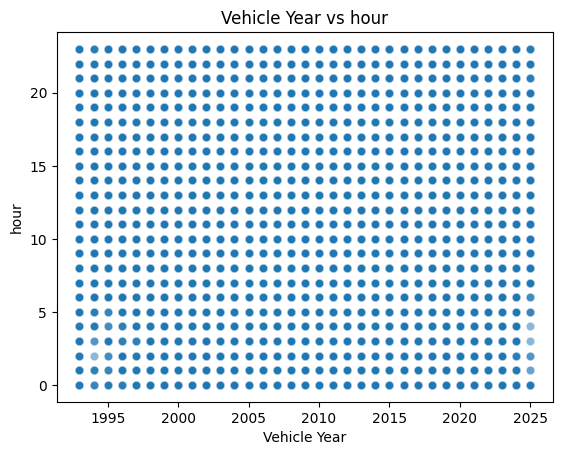

 ------------------------- Vehicle Year vs Crash_year -------------------------
Correlation: 0.4105514302843191


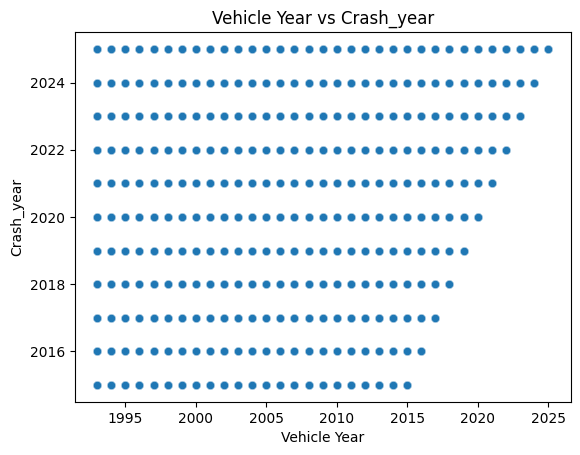

 ------------------------- Vehicle Year vs Crash_month -------------------------
Correlation: 0.01821821539280729


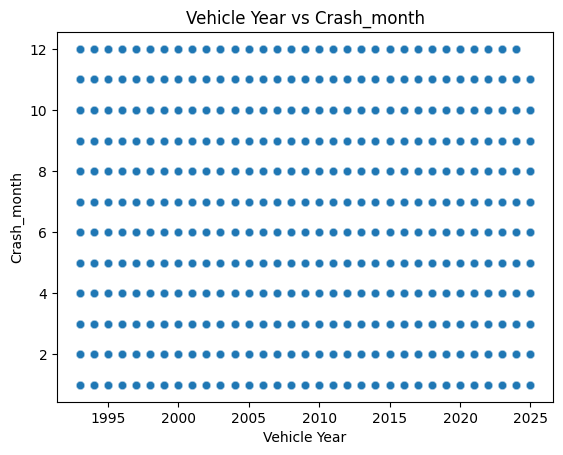

 ------------------------- Vehicle Year vs Crash_day -------------------------
Correlation: -0.00017409043543319138


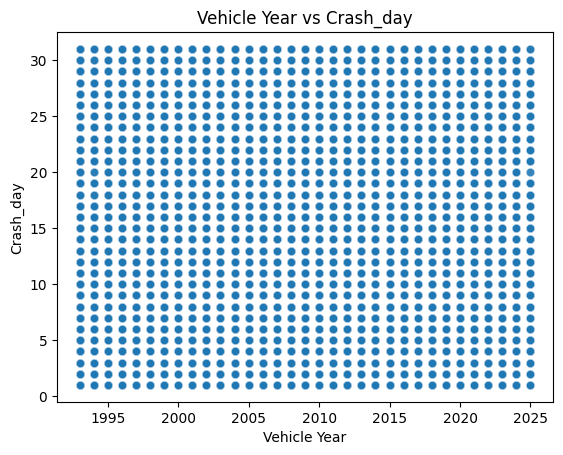

 ------------------------- Vehicle Year vs Crash_hour -------------------------
Correlation: -0.006438920429909619


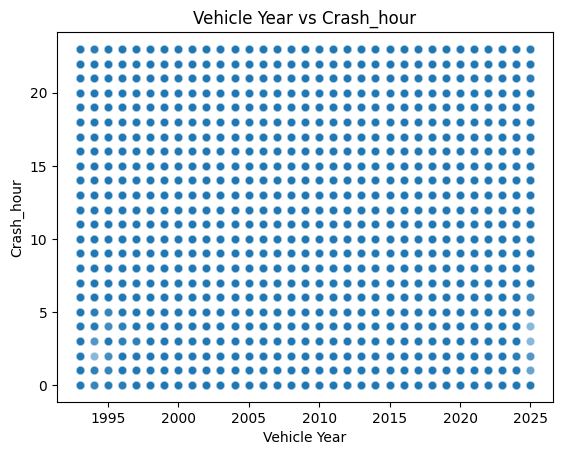

 ------------------------- Vehicle Year vs Crash_week -------------------------
Correlation: 0.015880334723540022


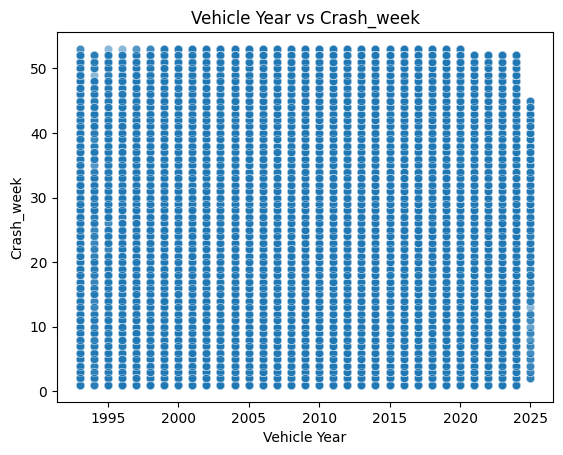

 ------------------------- Latitude vs Longitude -------------------------
Correlation: -0.6344424610608141


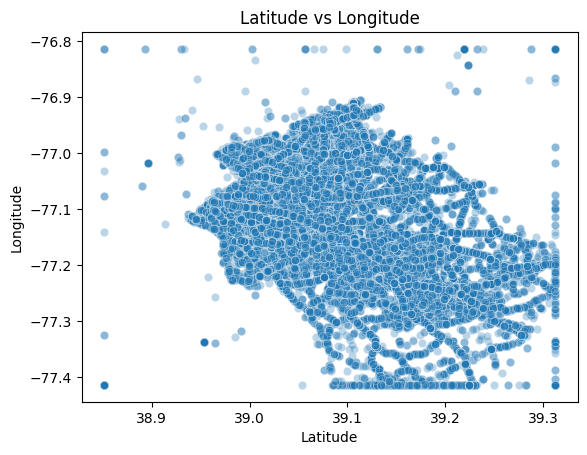

 ------------------------- Latitude vs hour -------------------------
Correlation: -0.004458861252505218


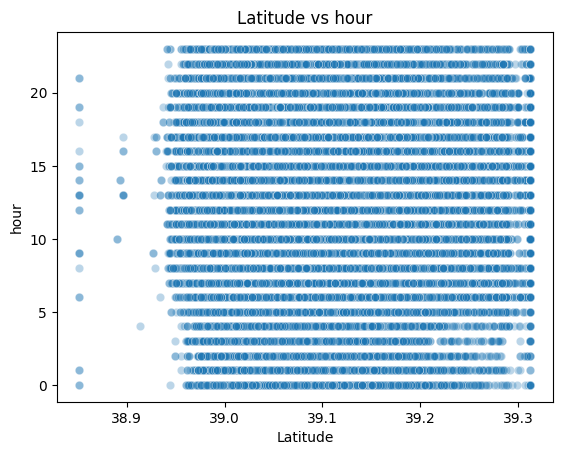

 ------------------------- Latitude vs Crash_year -------------------------
Correlation: 0.014452398592761663


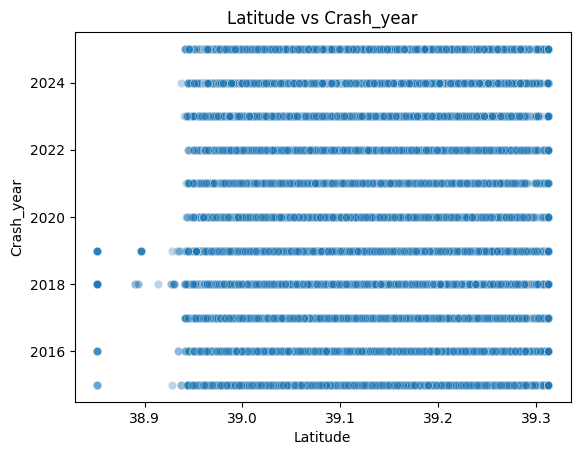

 ------------------------- Latitude vs Crash_month -------------------------
Correlation: 0.003928961193470908


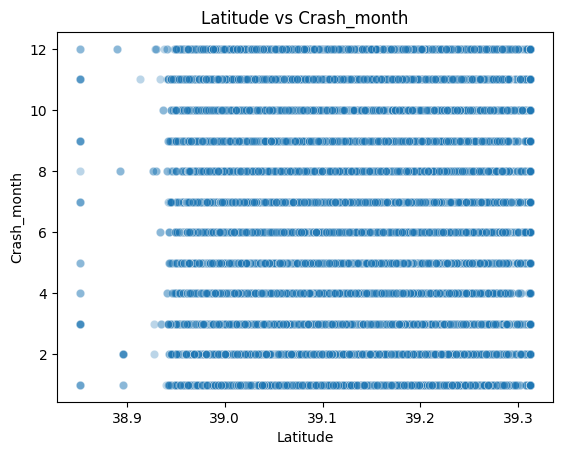

 ------------------------- Latitude vs Crash_day -------------------------
Correlation: -0.002321573901454214


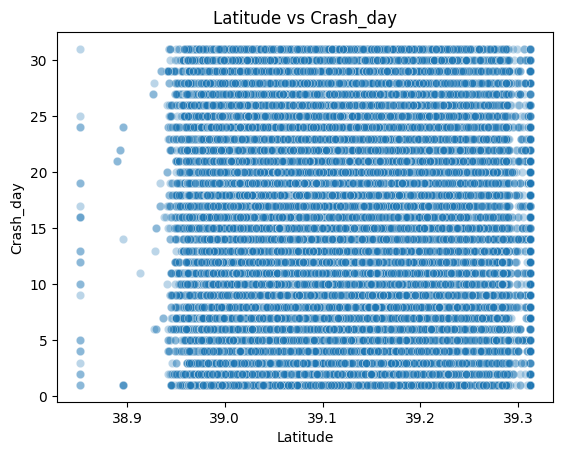

 ------------------------- Latitude vs Crash_hour -------------------------
Correlation: -0.004458861252505218


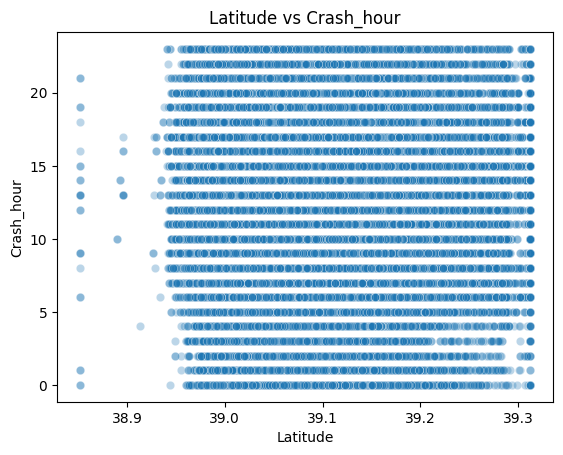

 ------------------------- Latitude vs Crash_week -------------------------
Correlation: 0.0041810462993471156


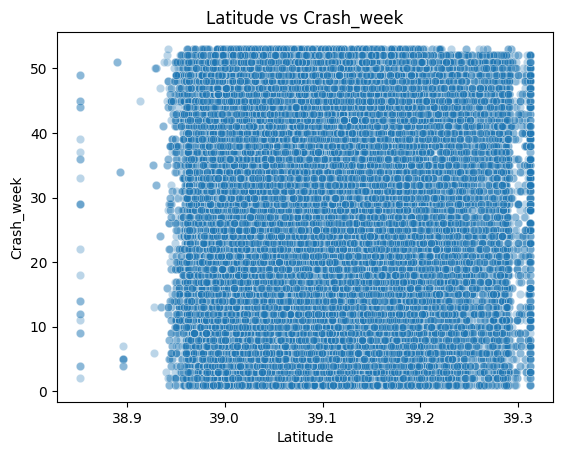

 ------------------------- Longitude vs hour -------------------------
Correlation: -0.003945803942717566


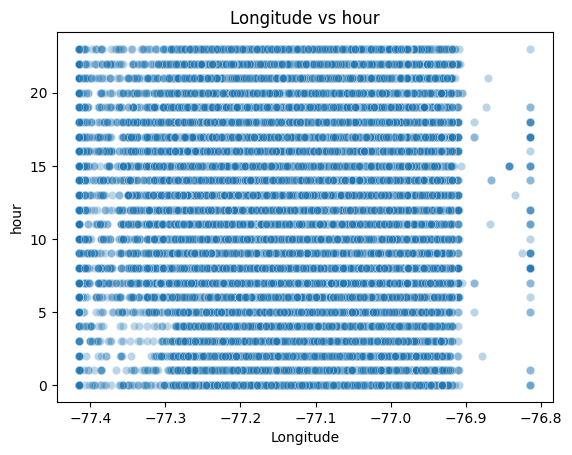

 ------------------------- Longitude vs Crash_year -------------------------
Correlation: 0.00045496419112732434


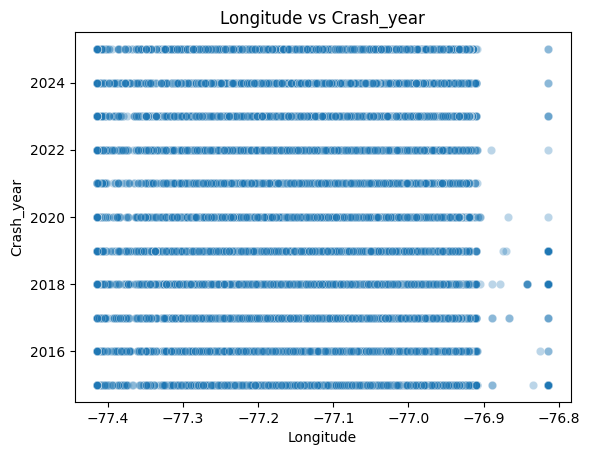

 ------------------------- Longitude vs Crash_month -------------------------
Correlation: -0.0016674038359260617


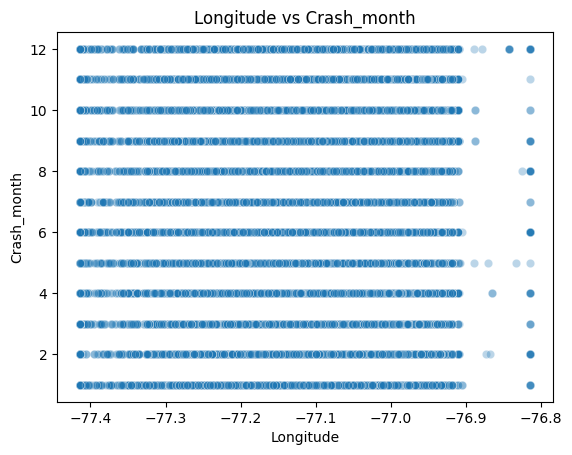

 ------------------------- Longitude vs Crash_day -------------------------
Correlation: 0.0013235526927654036


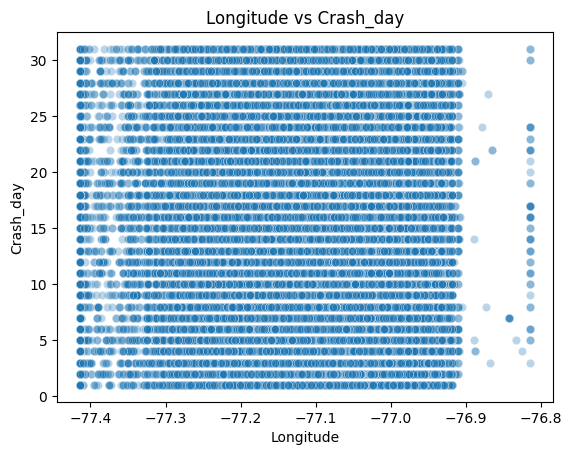

 ------------------------- Longitude vs Crash_hour -------------------------
Correlation: -0.003945803942717566


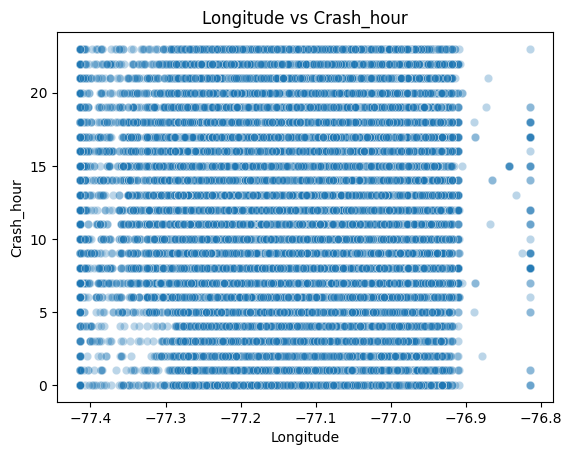

 ------------------------- Longitude vs Crash_week -------------------------
Correlation: -0.0013917208510572604


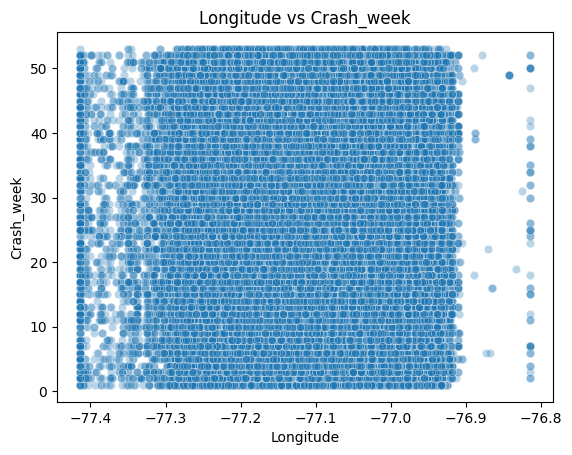

 ------------------------- hour vs Crash_year -------------------------
Correlation: 0.009206013562810518


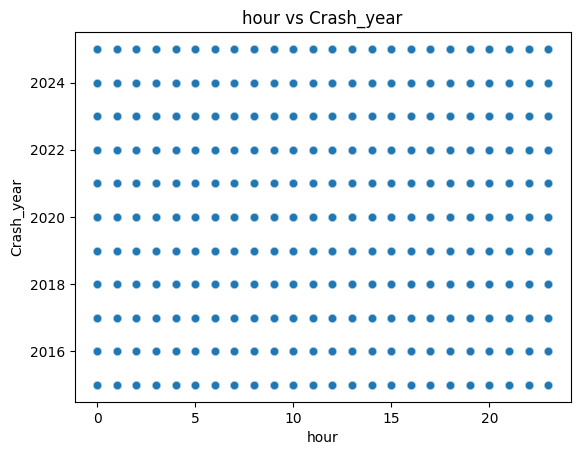

 ------------------------- hour vs Crash_month -------------------------
Correlation: 0.0038905862285748697


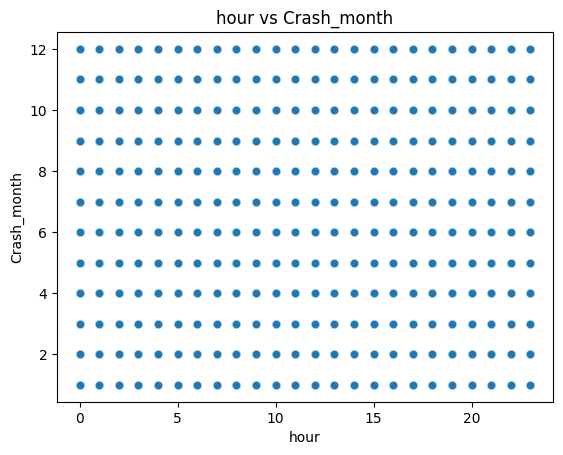

 ------------------------- hour vs Crash_day -------------------------
Correlation: 0.005008297619417325


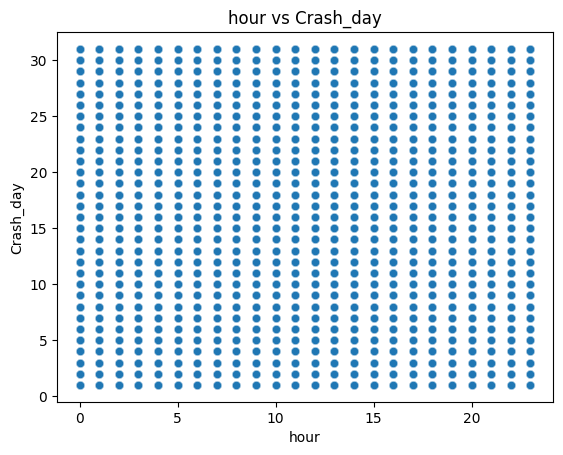

 ------------------------- hour vs Crash_hour -------------------------
Correlation: 1.0


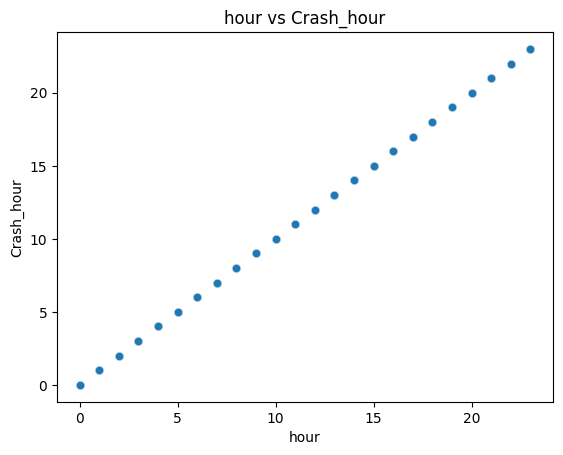

 ------------------------- hour vs Crash_week -------------------------
Correlation: 0.0029775683434523016


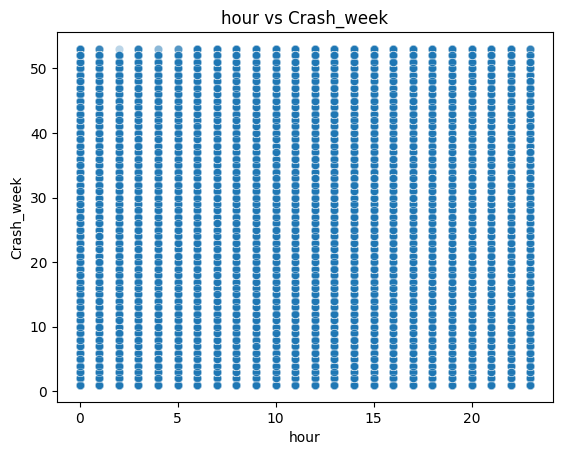

 ------------------------- Crash_year vs Crash_month -------------------------
Correlation: -0.03823302772826793


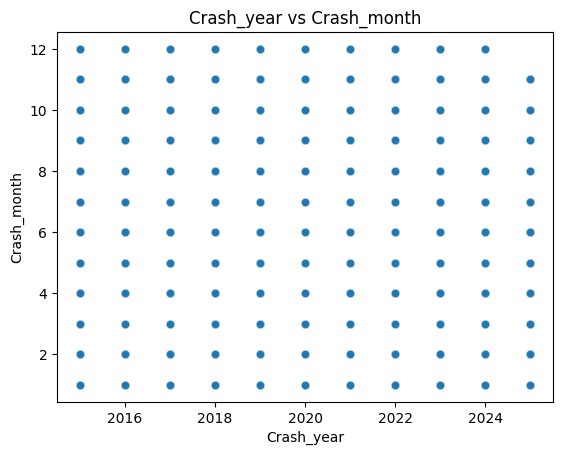

 ------------------------- Crash_year vs Crash_day -------------------------
Correlation: -0.0029180870061422557


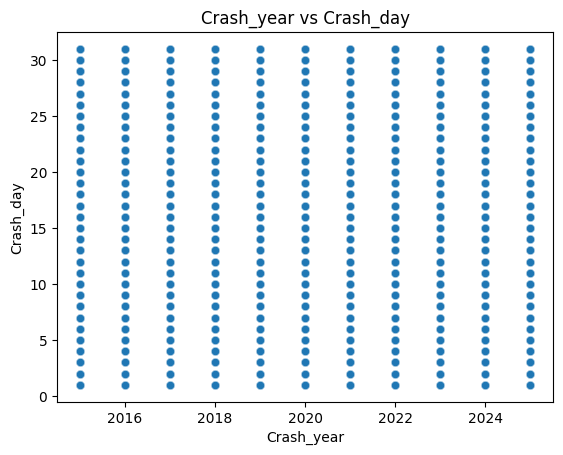

 ------------------------- Crash_year vs Crash_hour -------------------------
Correlation: 0.009206013562810488


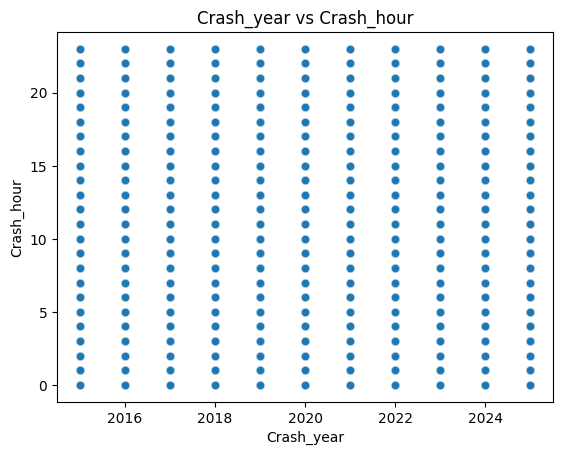

 ------------------------- Crash_year vs Crash_week -------------------------
Correlation: -0.04163040468274286


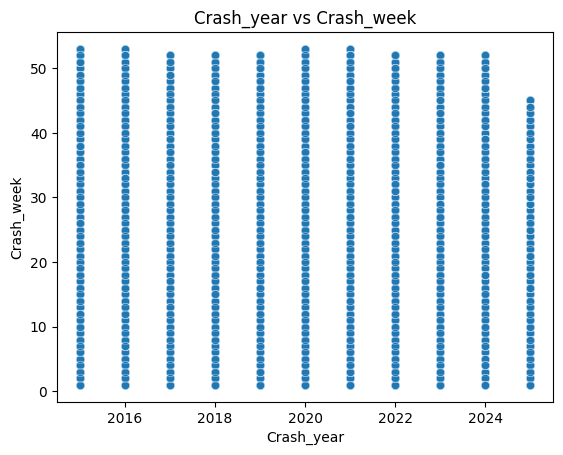

 ------------------------- Crash_month vs Crash_day -------------------------
Correlation: -0.003849974505020597


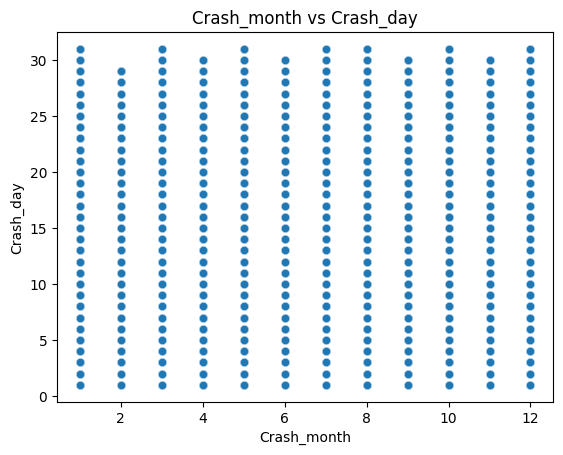

 ------------------------- Crash_month vs Crash_hour -------------------------
Correlation: 0.0038905862285748658


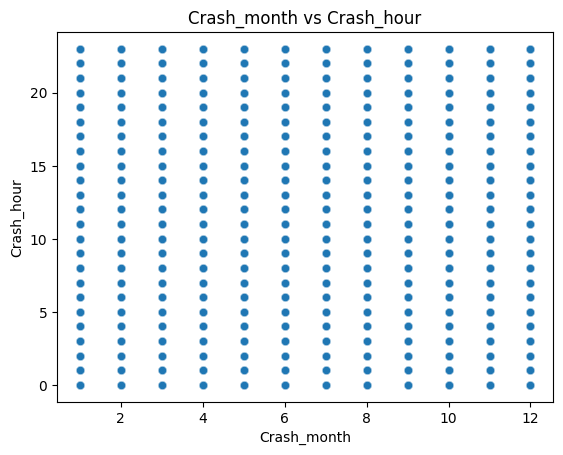

 ------------------------- Crash_month vs Crash_week -------------------------
Correlation: 0.9819324795547271


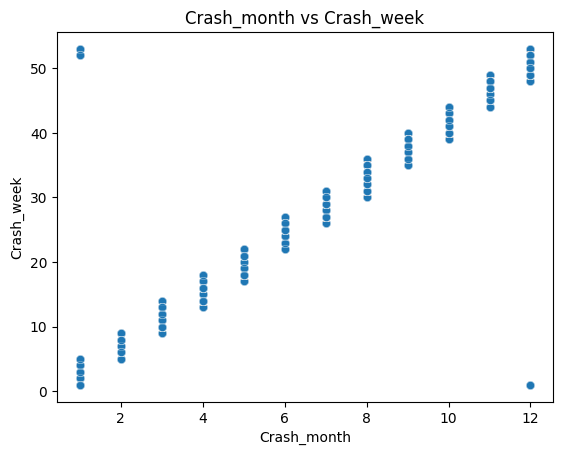

 ------------------------- Crash_day vs Crash_hour -------------------------
Correlation: 0.005008297619417325


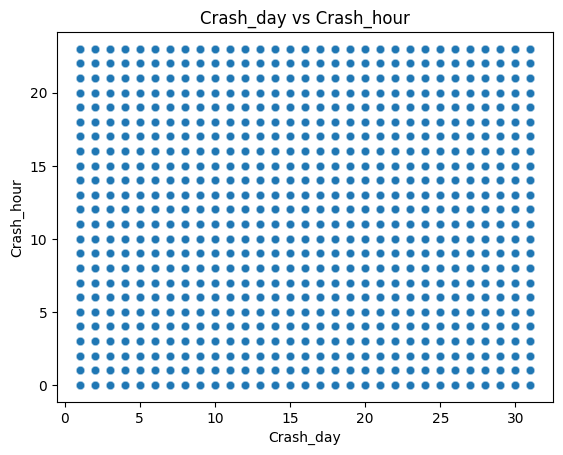

 ------------------------- Crash_day vs Crash_week -------------------------
Correlation: 0.06477993673772675


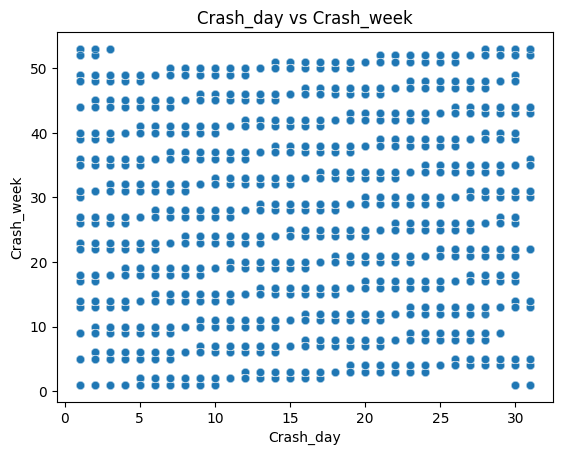

 ------------------------- Crash_hour vs Crash_week -------------------------
Correlation: 0.0029775683434523016


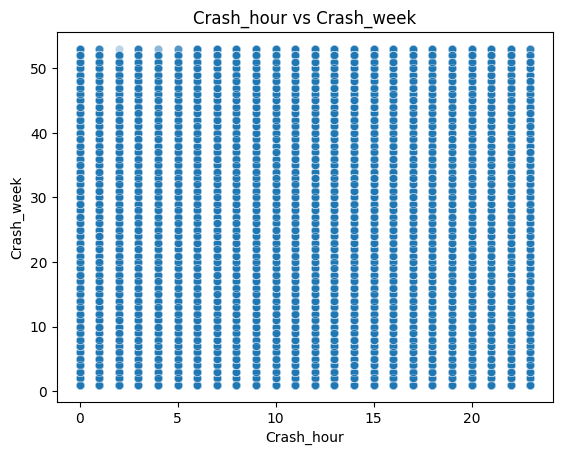

In [ ]:
for i in range(len(num)):
    for j in range(i+1, len(num)):
        x = num[i]
        y = num[j]

        print(f" {'-'*25} {x} vs {y} {'-'*25}")
        print("Correlation:", df[[x, y]].corr().iloc[0, 1])

        sns.scatterplot(data=df, x=x, y=y, alpha=0.3)
        plt.title(f"{x} vs {y}")
        plt.show()

## **Bivariate Analysis: Numerical Features Insights**

| Feature Pair | Correlation | Key Inference |
|---|---|---|
| **Speed Limit vs. Vehicle Year** | -0.04 | Extremely weak negative correlation. The age of the vehicle has virtually no linear relationship with the speed limit of the road where the crash occurred. |
| **Speed Limit vs. Latitude** | 0.10 | Very weak positive correlation. As latitude slightly increases (moving North), the speed limit shows a negligible tendency to increase. This relationship is not strong enough to be meaningful. |
| **Speed Limit vs. Longitude** | -0.02 | Very weak negative correlation. There is almost no linear relationship between longitude and speed limit. |
| **Speed Limit vs. hour** | -0.01 | Extremely weak negative correlation. The time of day has no significant linear impact on the speed limit of the crash location. |
| **Vehicle Year vs. Latitude** | -0.02 | Extremely weak negative correlation. Vehicle year is not linearly related to the latitude of the crash location. |
| **Vehicle Year vs. Longitude** | -0.02 | Extremely weak negative correlation. Vehicle year is not linearly related to the longitude of the crash location. |
| **Vehicle Year vs. hour** | -0.01 | Extremely weak negative correlation. The time of day has no significant linear relationship with the vehicle's year of manufacture. |
| **Latitude vs. Longitude** | -0.63 | **Moderate negative correlation.** This is a significant finding. As latitude increases (moving north), longitude tends to decrease (moving west), which is expected for a geographically constrained area on a map, indicating the crashes are concentrated within a specific region (e.g., Montgomery County). |
| **Latitude vs. hour** | -0.00 | Extremely weak negative correlation. The time of day is not linearly related to the latitude of the crash. |
| **Longitude vs. hour** | -0.00 | Extremely weak negative correlation. The time of day is not linearly related to the longitude of the crash. |

## **Conclusion**
The bivariate analysis of numerical features reveals that most pairs exhibit extremely weak or no linear correlation, suggesting that these numerical variables operate largely independently of each other. The only notable relationship is a **moderate negative correlation between Latitude and Longitude (-0.63)**. This indicates a consistent geographical pattern within the dataset: crashes occurring further north tend to be further west within the localized study area. This strong geospatial relationship confirms the dataset's regional focus and consistency, while the lack of other significant correlations implies that factors like `Speed Limit`, `Vehicle Year`, and `hour` are not strongly interdependent in a linear fashion.

## **2) Bivariate Analysis: Numeric vs Categorical (Boxplot + Mean Plot)**

### **Optimized Numeric vs Categorical Bivariate Analysis**
To avoid extremely long runtime from testing all numeric–categorical combinations, only the most relevant pairs were selected. These combinations provide maximum analytical value (speed, environment, vehicle, and crash-related insights) while keeping execution under 10 minutes.

------------------------- Speed Limit vs Route Type -------------------------


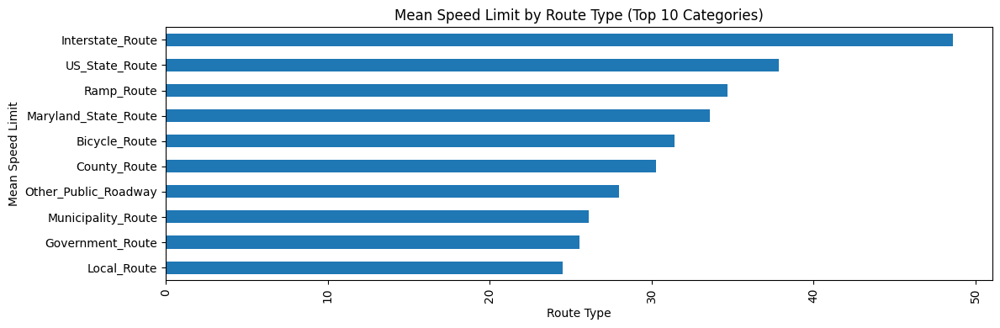

------------------------- Vehicle Year vs Route Type -------------------------


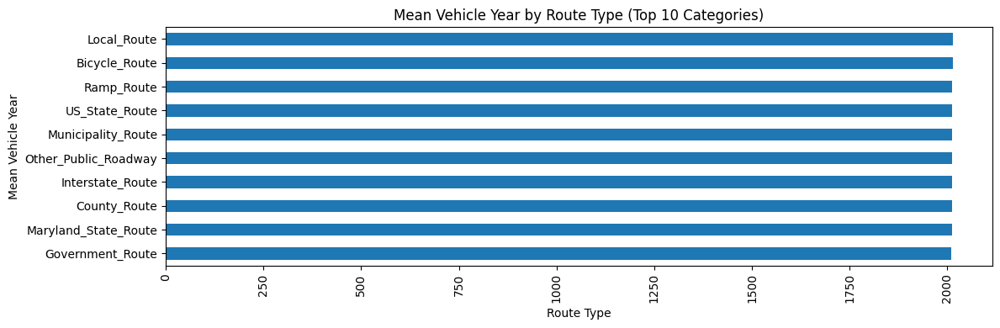

------------------------- hour vs Route Type -------------------------


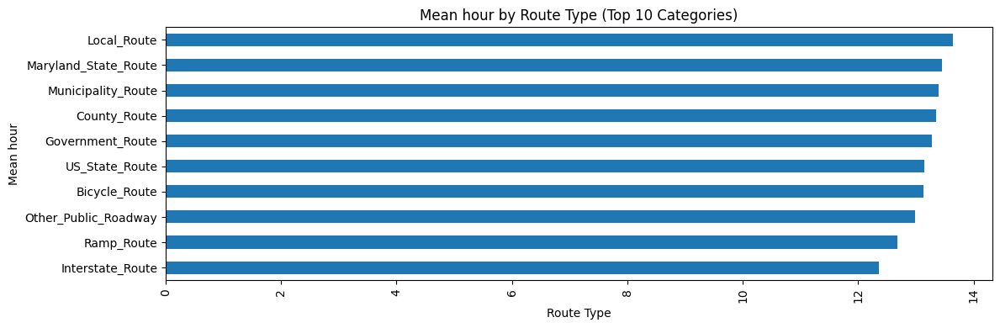

------------------------- Speed Limit vs Weather -------------------------


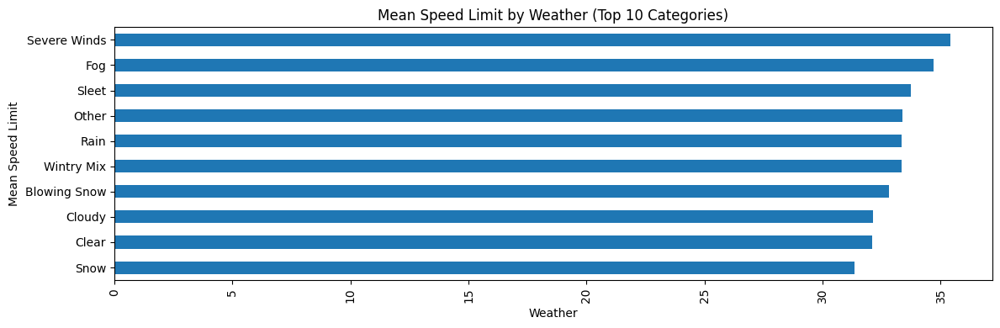

------------------------- Vehicle Year vs Weather -------------------------


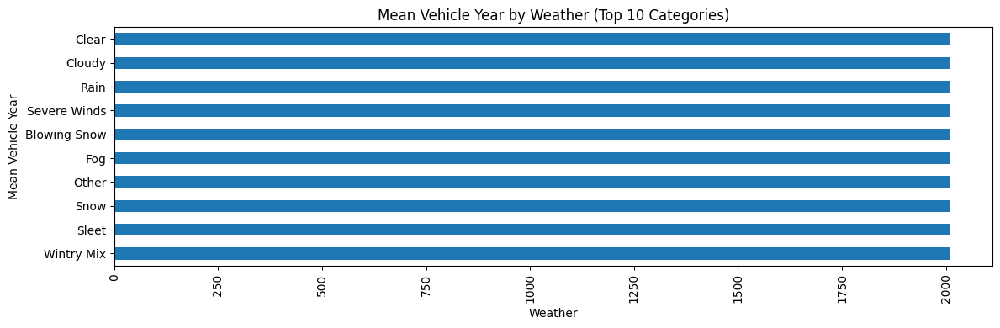

------------------------- hour vs Weather -------------------------


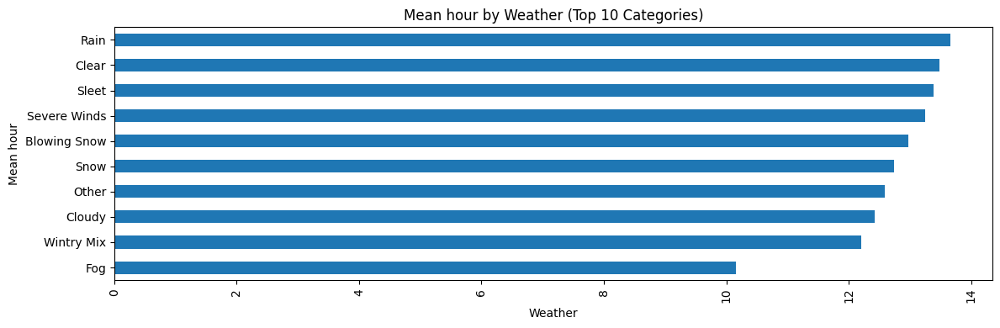

------------------------- Speed Limit vs Light -------------------------


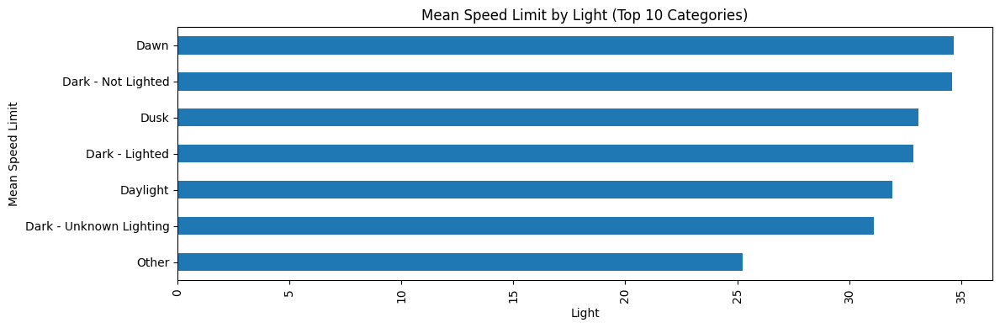

------------------------- Vehicle Year vs Light -------------------------


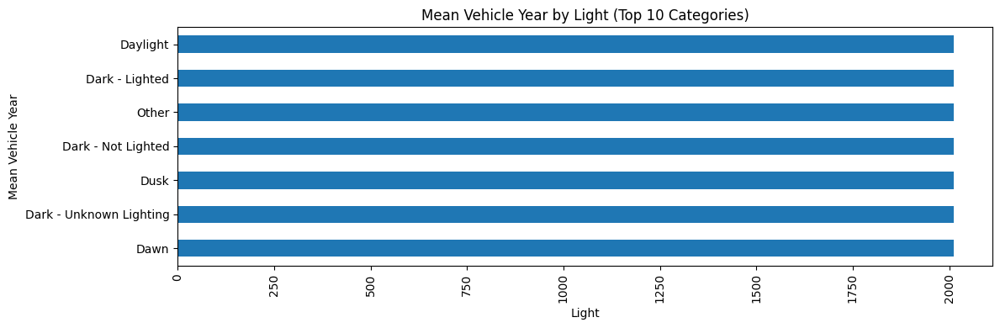

------------------------- hour vs Light -------------------------


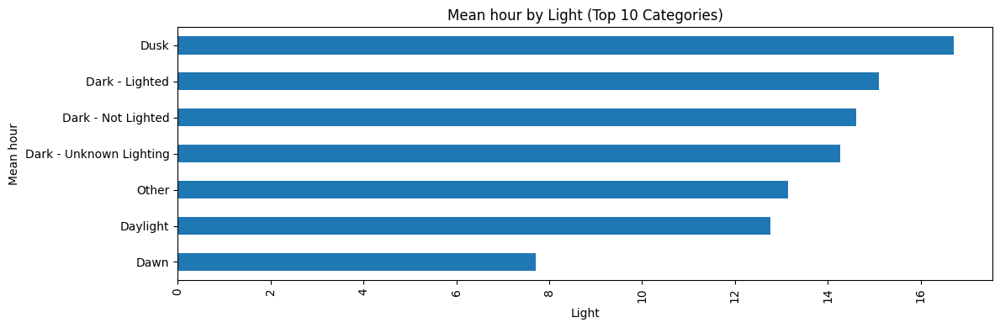

------------------------- Speed Limit vs Traffic Control -------------------------


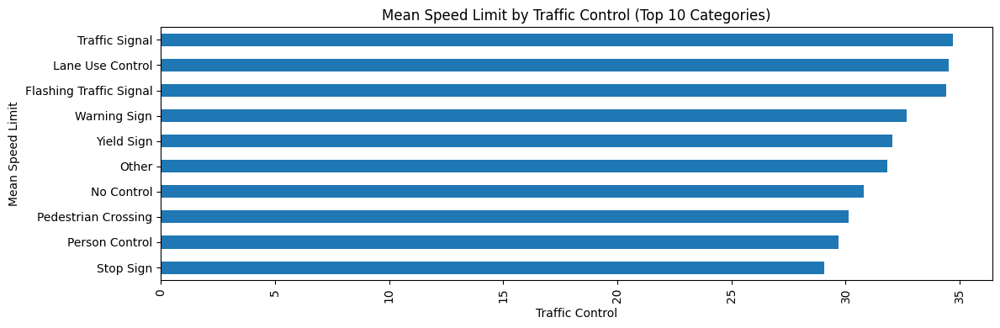

------------------------- Vehicle Year vs Traffic Control -------------------------


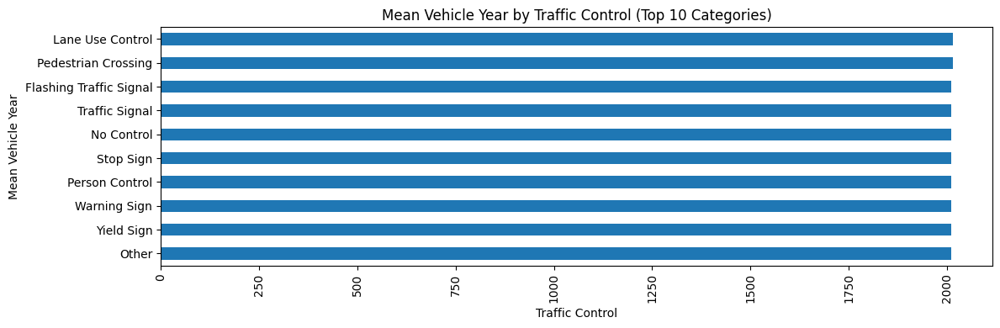

------------------------- hour vs Traffic Control -------------------------


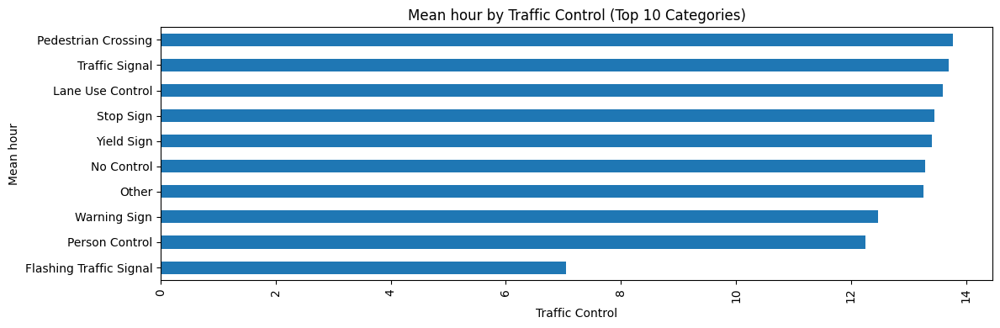

------------------------- Speed Limit vs Collision Type -------------------------


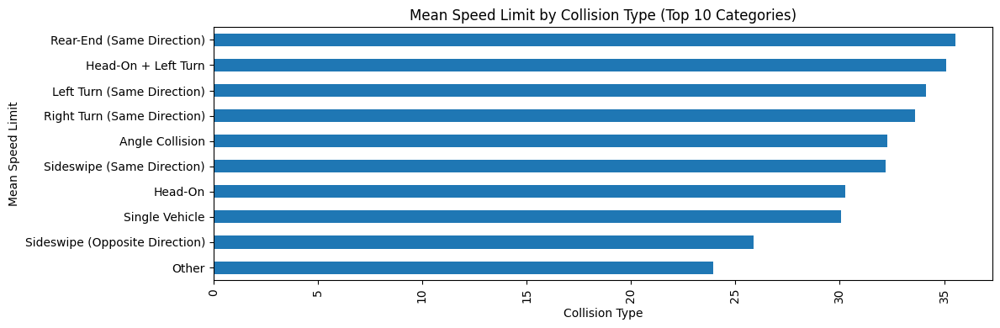

------------------------- Vehicle Year vs Collision Type -------------------------


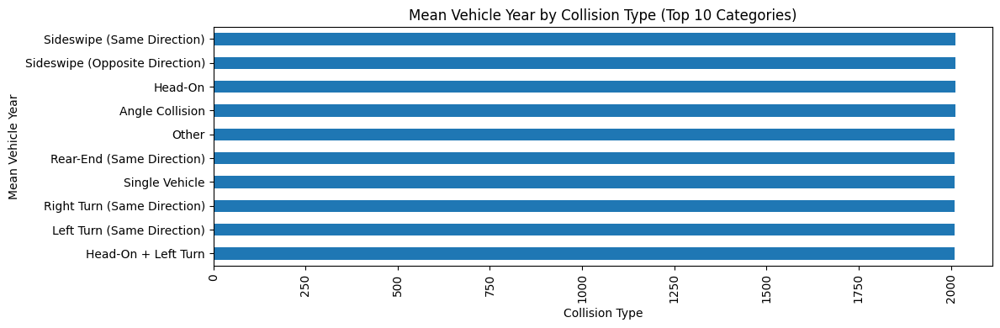

------------------------- hour vs Collision Type -------------------------


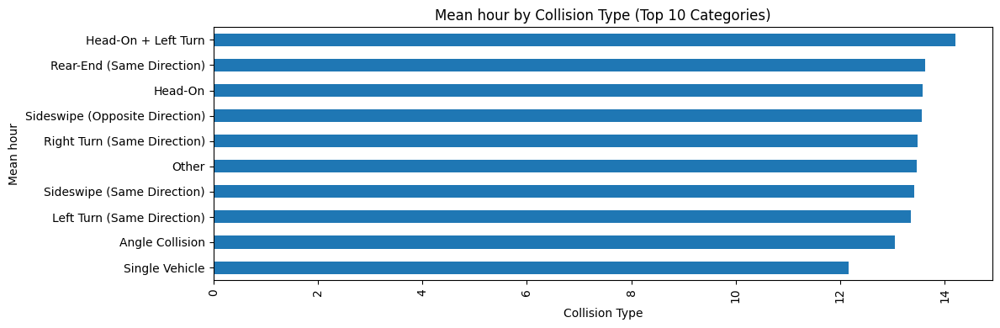

------------------------- Speed Limit vs Driver At Fault -------------------------


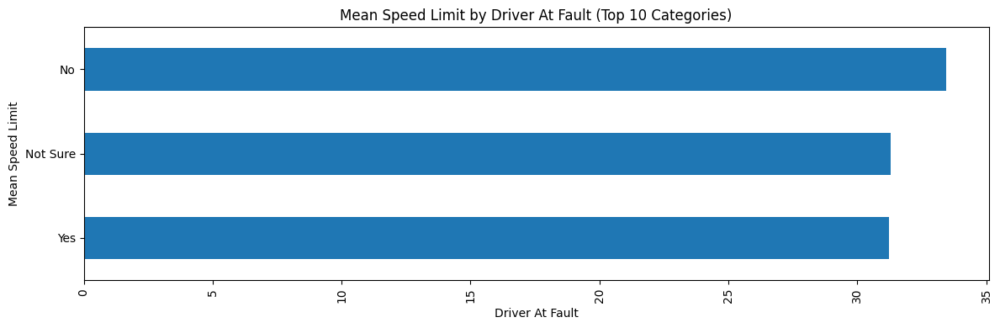

------------------------- Vehicle Year vs Driver At Fault -------------------------


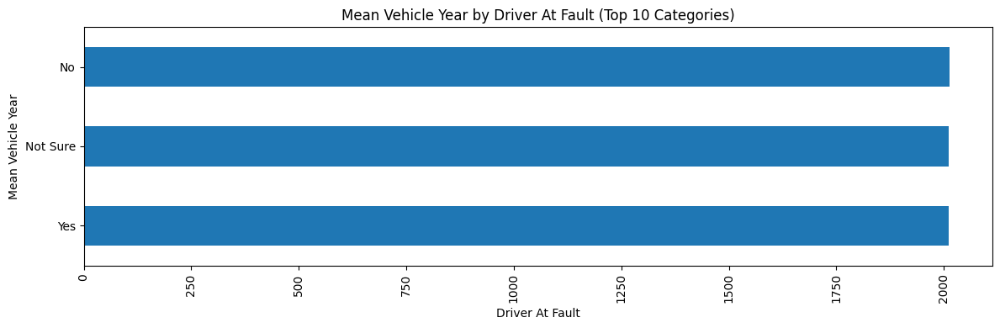

------------------------- hour vs Driver At Fault -------------------------


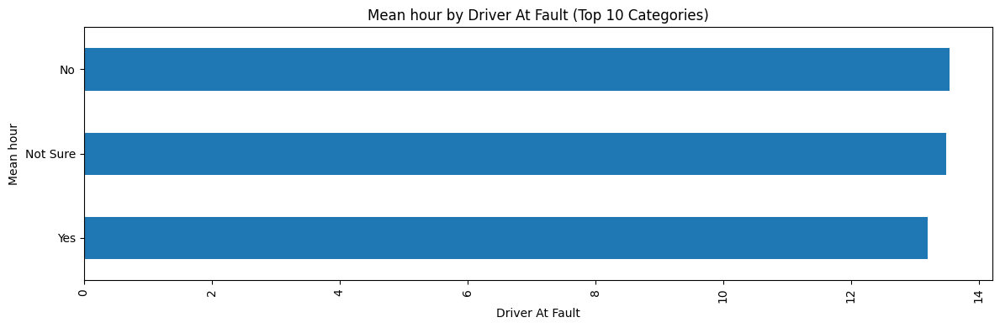

------------------------- Speed Limit vs Vehicle Make -------------------------


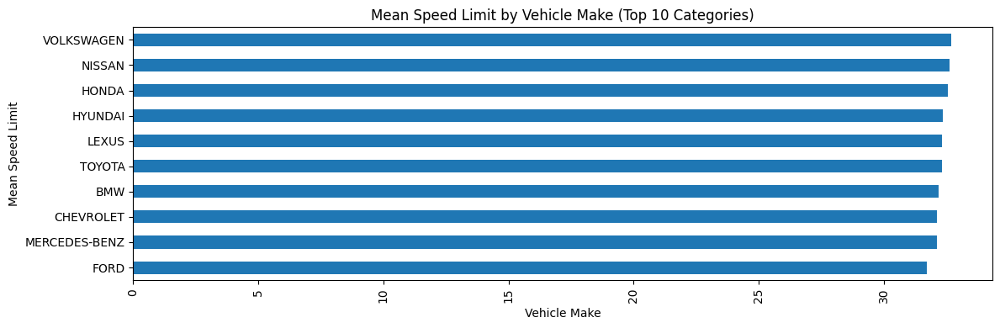

------------------------- Vehicle Year vs Vehicle Make -------------------------


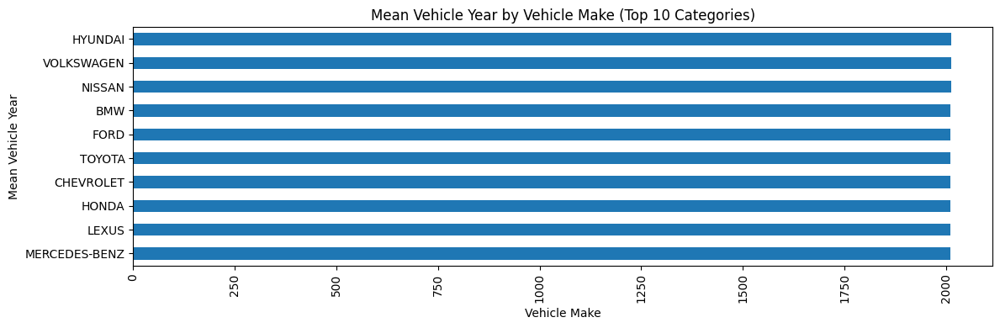

------------------------- hour vs Vehicle Make -------------------------


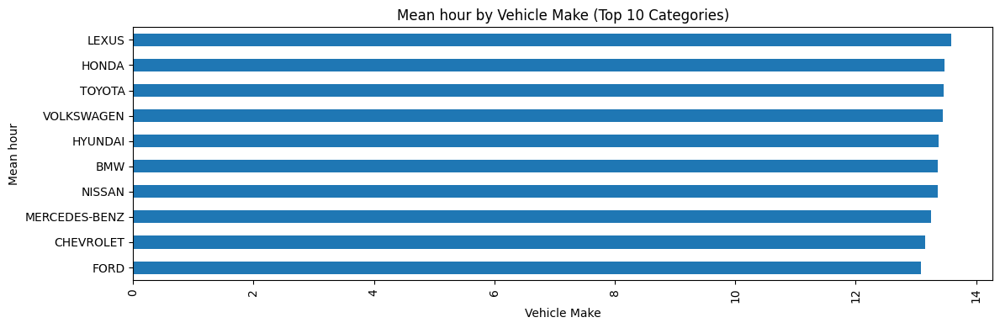

------------------------- Speed Limit vs Injury Severity -------------------------


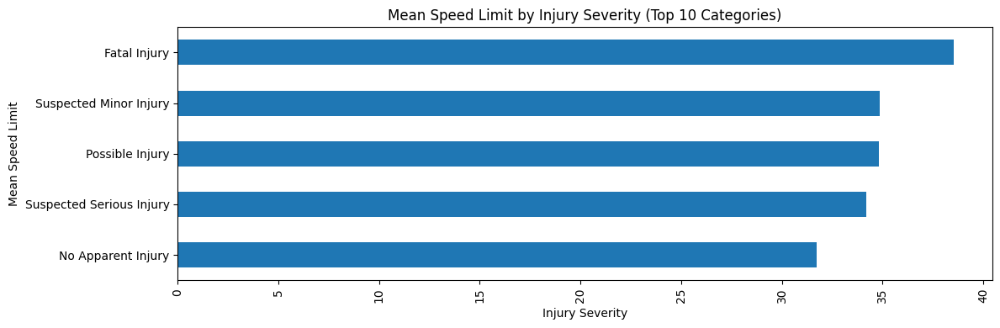

------------------------- Vehicle Year vs Injury Severity -------------------------


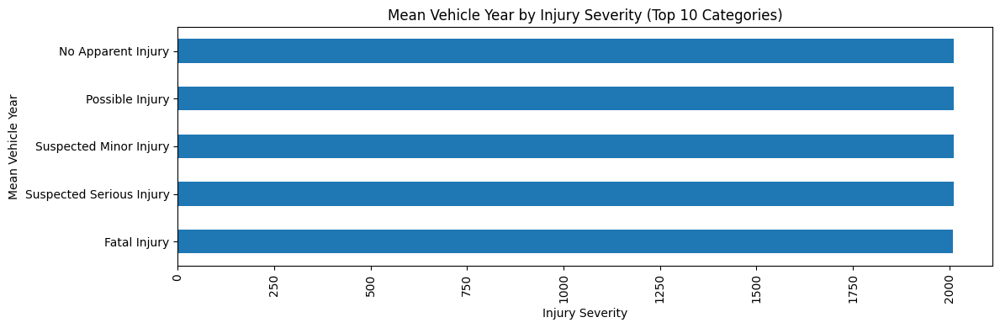

------------------------- hour vs Injury Severity -------------------------


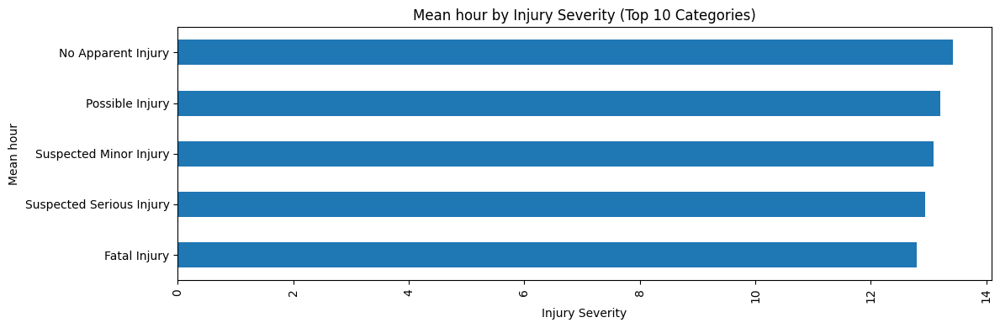

In [ ]:
import matplotlib.pyplot as plt

# Selected numeric columns
num_sel = ['Speed Limit', 'Vehicle Year', 'hour']

# Selected categorical columns
cat_sel = [
    'Route Type',
    'Weather',
    'Light',
    'Traffic Control',
    'Collision Type',
    'Driver At Fault',
    'Vehicle Make',
    'Injury Severity'
]

for c in cat_sel:
    for n in num_sel:

        print(f"{'-'*25} {n} vs {c} {'-'*25}")

        # Use only top 10 categories for speed + clarity
        top10 = df[c].value_counts().head(10).index
        sub_df = df[df[c].isin(top10)]

        # Compute grouped mean
        grouped = sub_df.groupby(c)[n].mean().sort_values()

        # Plot
        plt.figure(figsize=(12,4))
        grouped.plot(kind='barh')

        plt.title(f"Mean {n} by {c} (Top 10 Categories)")
        plt.xlabel(c)
        plt.ylabel(f"Mean {n}")
        plt.xticks(rotation=90)
        plt.tight_layout()
        plt.show()

## **Bivariate Analysis: Numeric vs. Categorical Features Insights (Refined)**

| Feature Combination | Key Inference |
|---------------------|---------------|
| **Speed Limit vs. Injury Severity** | - Severe outcomes (`Fatal`, `Serious Injury`) tend to occur at **higher average speed limits**.<br><br>- Lower severity outcomes (`No Apparent Injury`, `Possible Injury`) are more common in **lower speed zones**. |
| **Speed Limit vs. Route Type** | - `Interstate_Route` and `US_Route` show **higher average speed limits**, reflecting fast-moving corridors.<br><br>- `Local_Street` and `Alley` show lower averages, indicating slower, residential areas.<br><br>- Route classification strongly dictates crash-speed environments. |
| **Vehicle Year vs. Vehicle Make** | - The mean `Vehicle Year` varies across makes.<br><br>- Popular long-standing brands (e.g., `TOYOTA`) may show a wider age spread, while newer brands show more recent averages. |
| **Hour vs. Collision Type** | - `Rear-End` collisions peak during **traffic congestion hours** (commute periods).<br><br>- Types like `Fixed Object` or `Parked Vehicle` occur more evenly across the day. |
| **Hour vs. Light** | - `Daylight` crashes cluster between **7 AM and 7 PM**.<br><br>- `Dark` conditions dominate night-time hours, often showing late evening and early-morning peaks. |
| **Speed Limit vs. Traffic Control** | - `No Control` and `Stop Sign` areas show **lower average speed limits**.<br><br>- `Traffic Signal` intersections and `Interstate` areas involve **higher speed limits**, consistent with road design. |
| **Vehicle Year vs. Injury Severity** | - No strong linear relationship exists.<br><br>- Older vehicles may show slightly higher severity due to fewer safety features.<br><br>- Newer vehicles appear across all severity outcomes. |
| **Hour vs. Driver At Fault** | - Fault identification (`Yes` / `No`) stays relatively stable across hours.<br><br>- This indicates fault is more related to driver behavior and crash context than time of day. |

## **3) Bivariate Analysis: Categorical vs Categorical (Crosstab + Heatmap)**


-------------------- Collision Type vs Weather --------------------


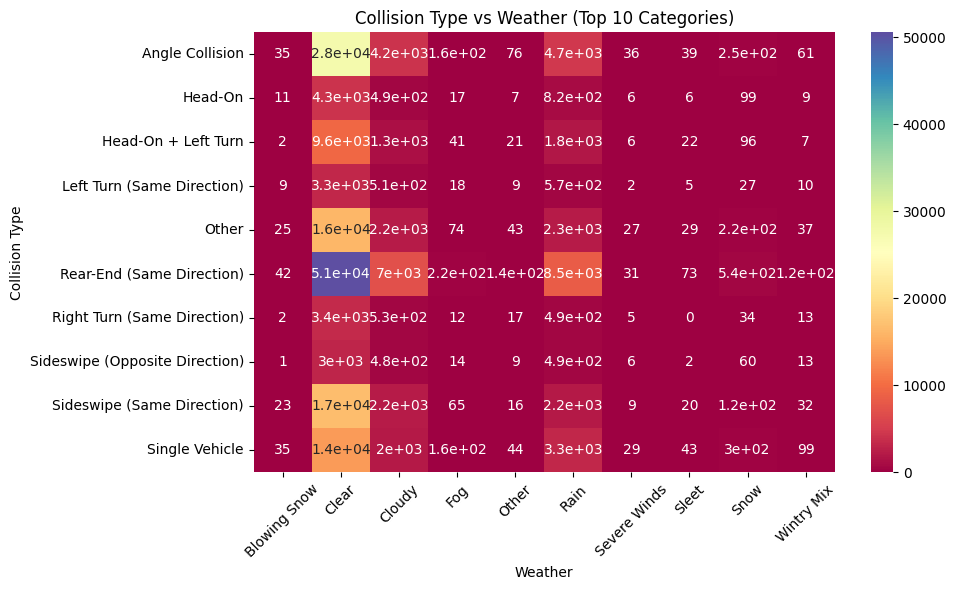


-------------------- Collision Type vs Light --------------------


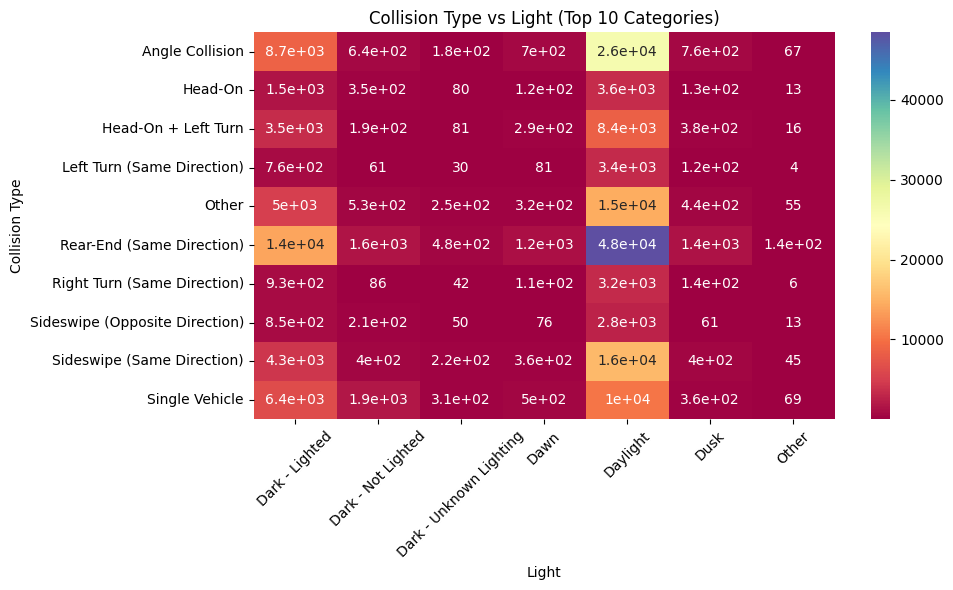


-------------------- Collision Type vs Traffic Control --------------------


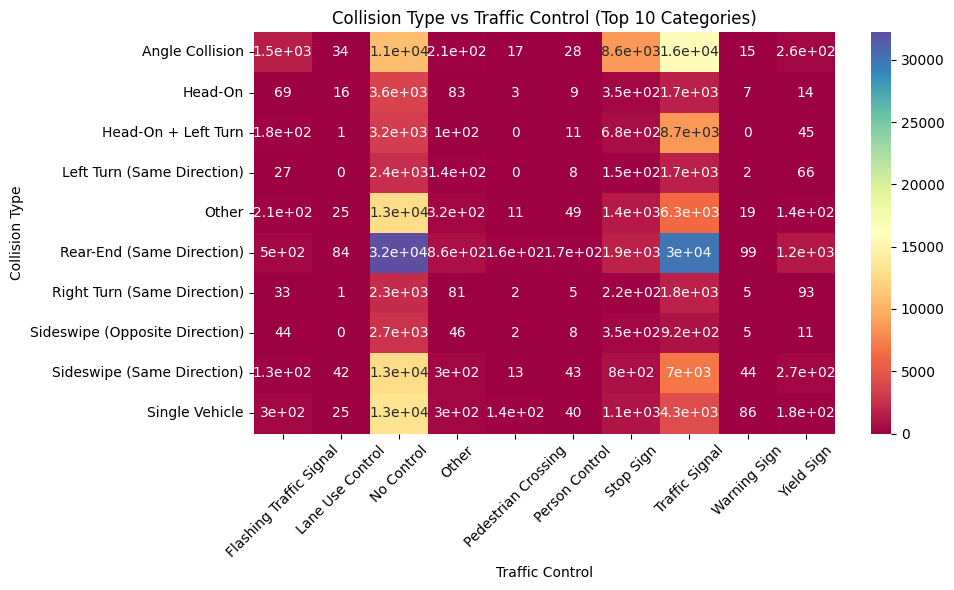


-------------------- Collision Type vs Driver At Fault --------------------


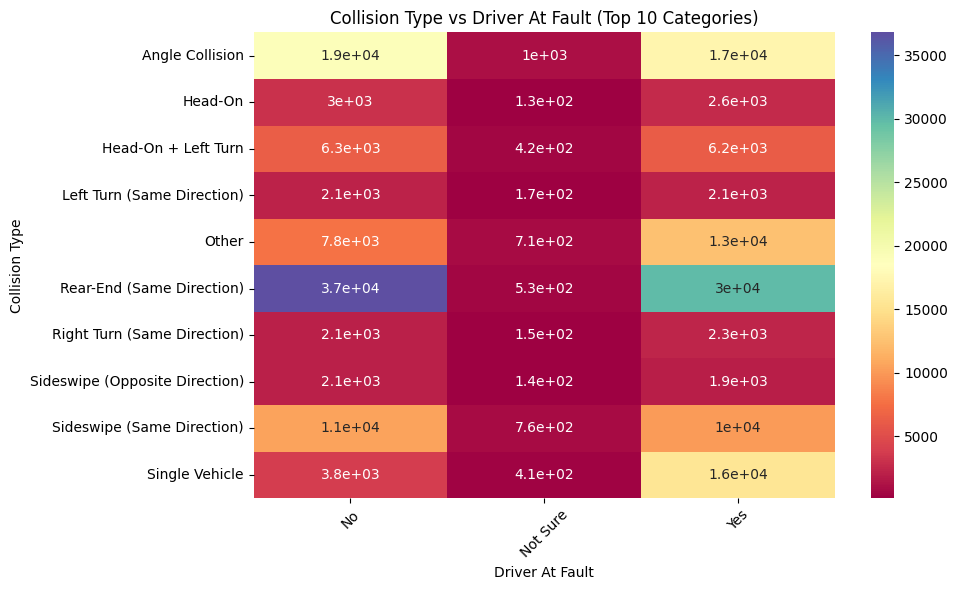


-------------------- Collision Type vs Injury Severity --------------------


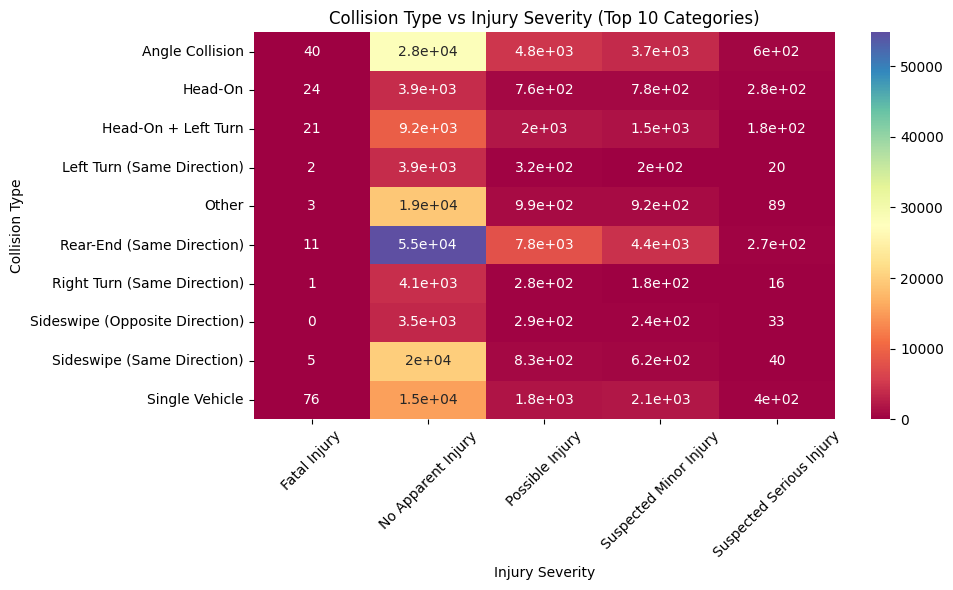


-------------------- Collision Type vs Vehicle Make --------------------


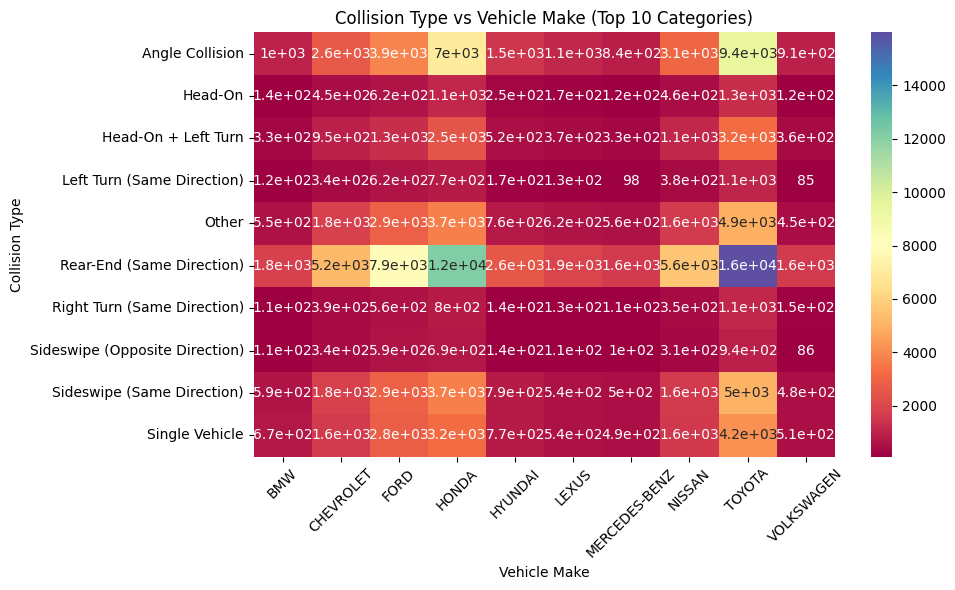


-------------------- Weather vs Light --------------------


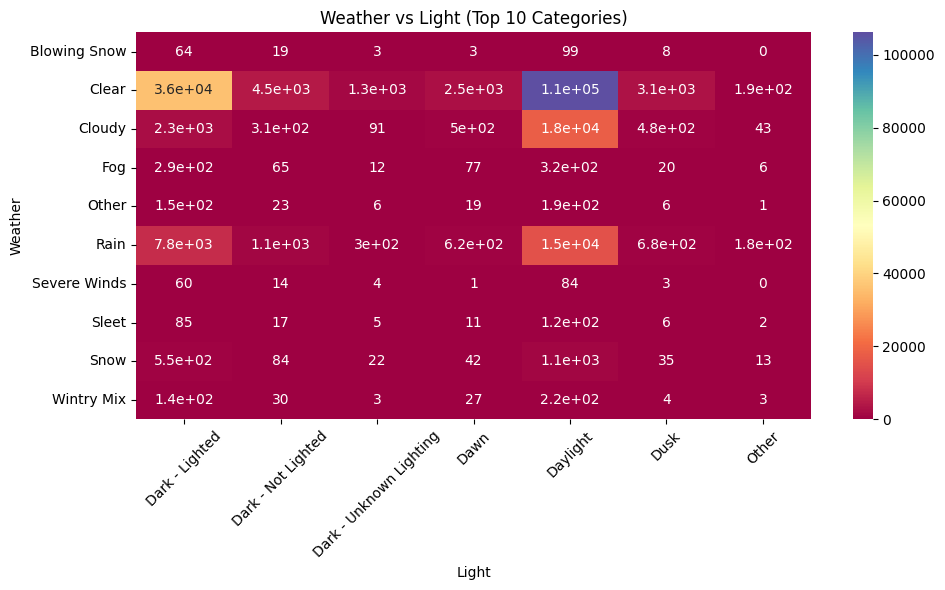


-------------------- Weather vs Traffic Control --------------------


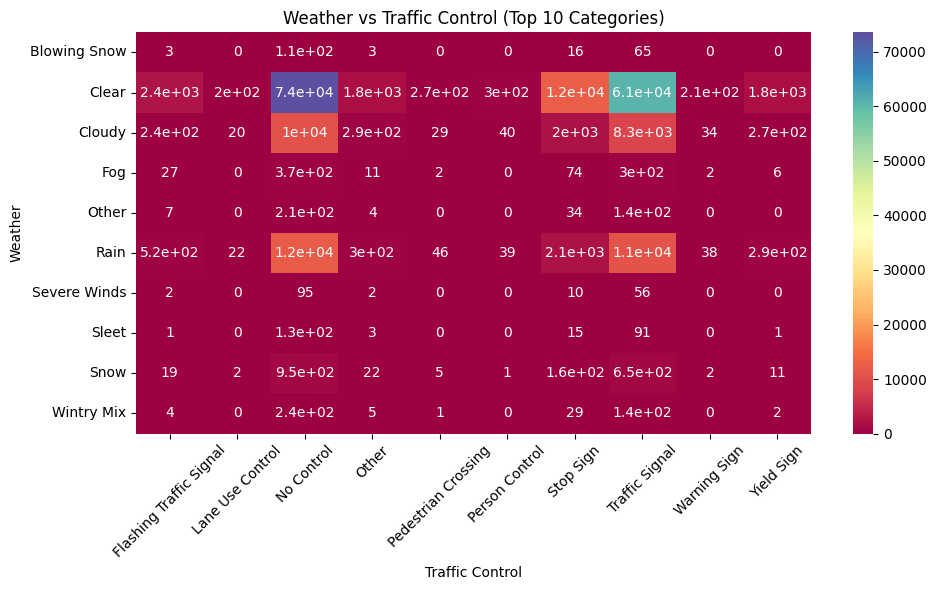


-------------------- Weather vs Driver At Fault --------------------


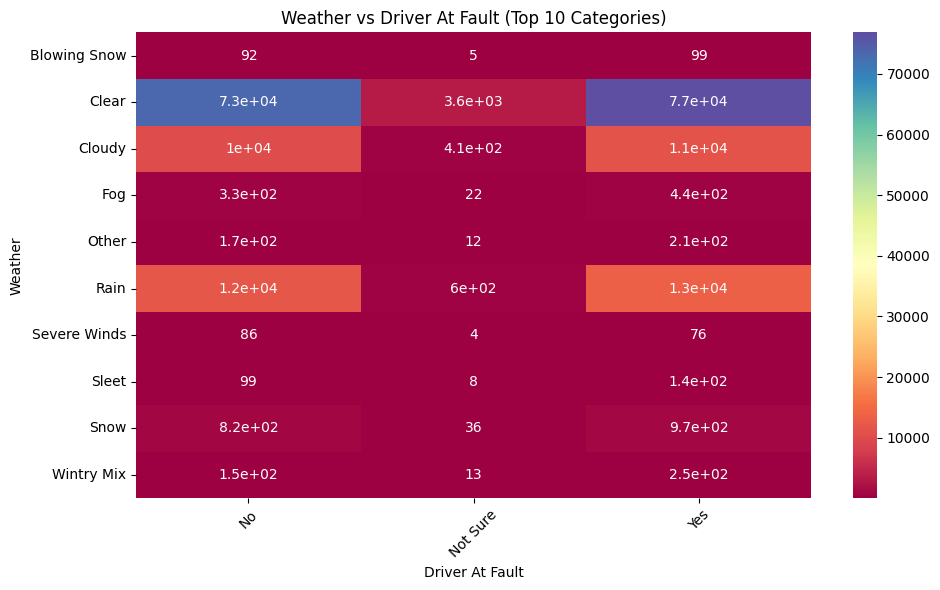


-------------------- Weather vs Injury Severity --------------------


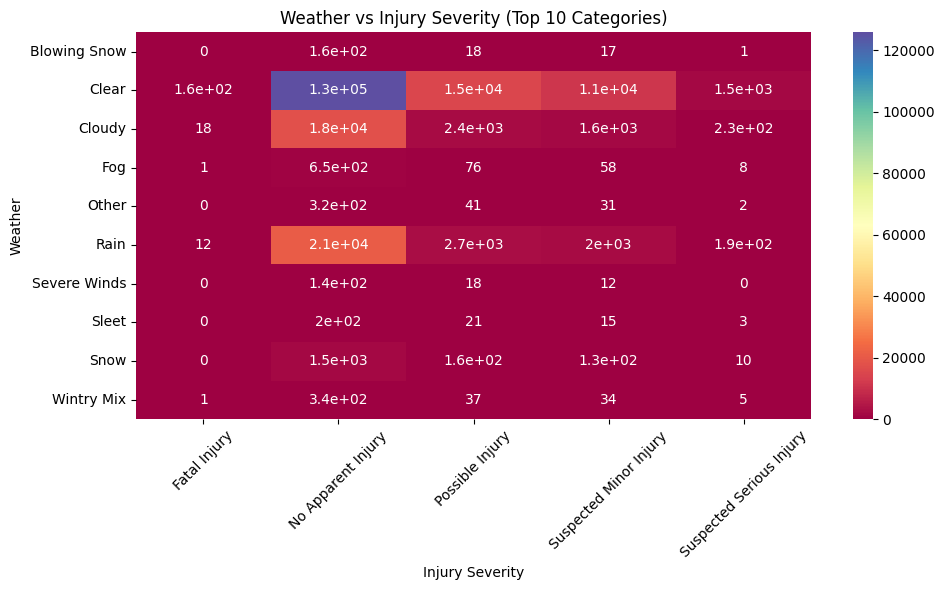


-------------------- Weather vs Vehicle Make --------------------


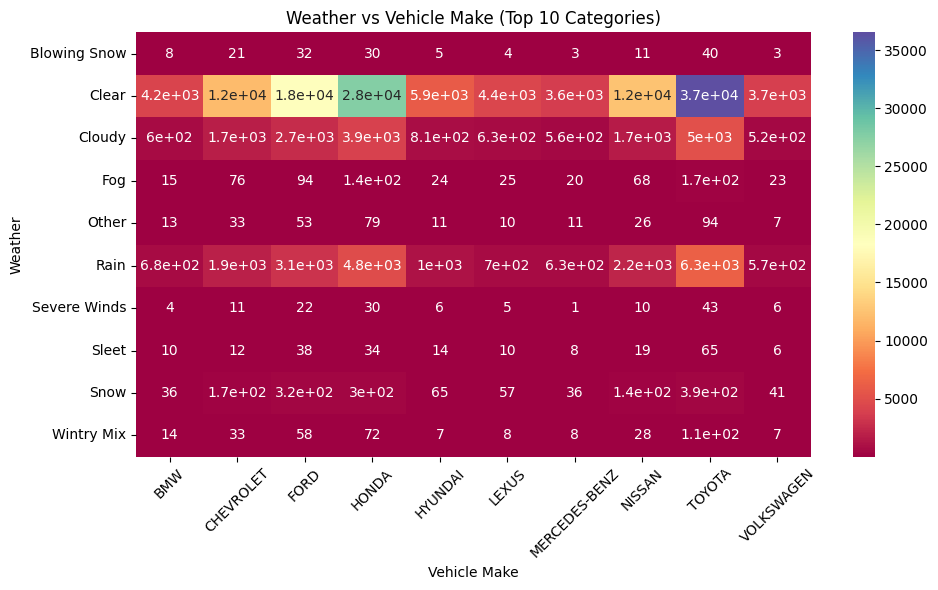


-------------------- Light vs Traffic Control --------------------


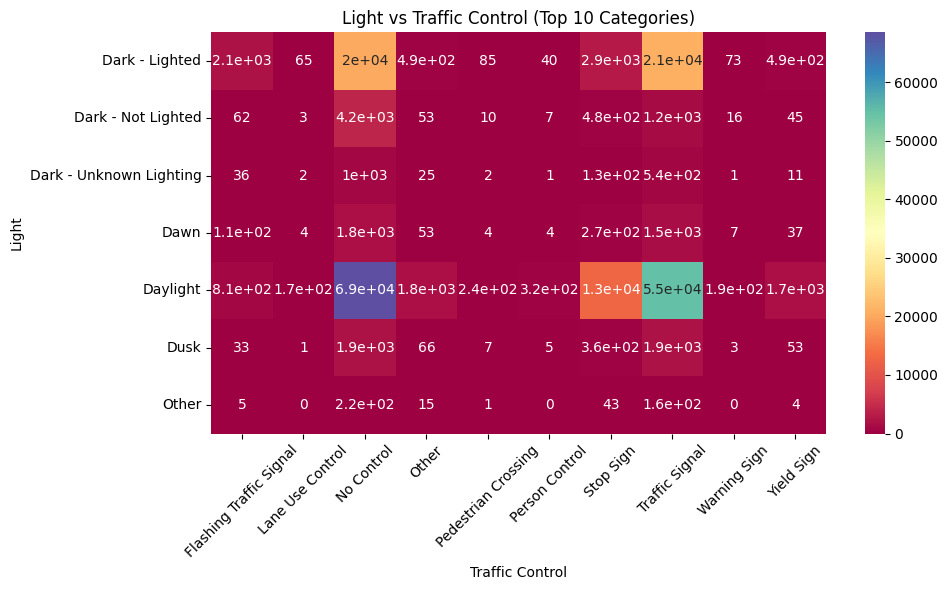


-------------------- Light vs Driver At Fault --------------------


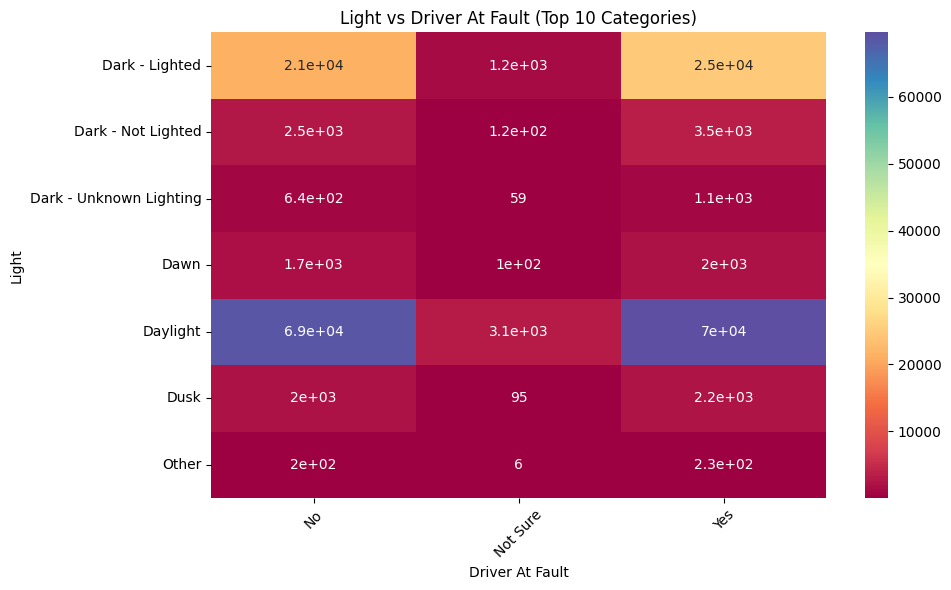


-------------------- Light vs Injury Severity --------------------


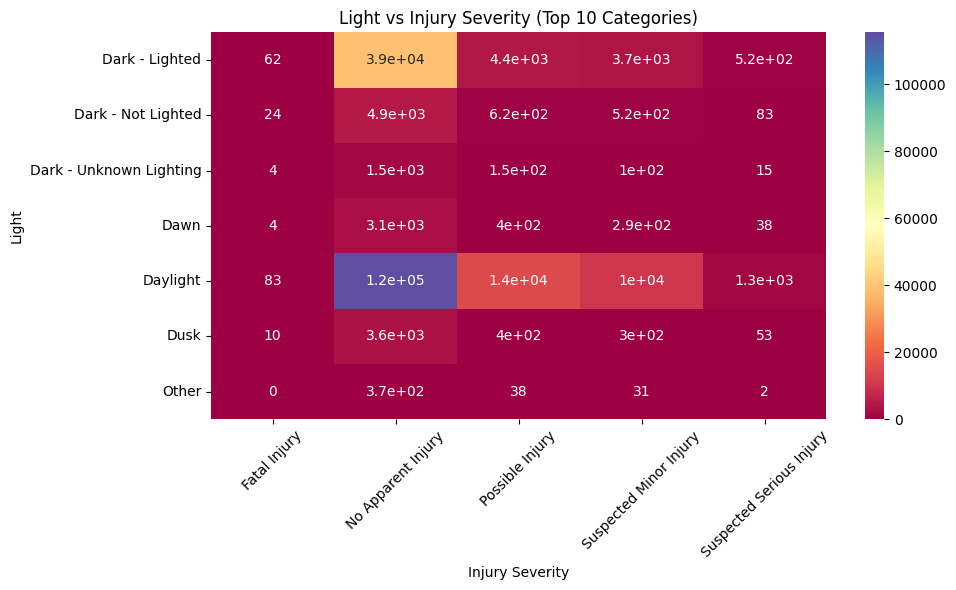


-------------------- Light vs Vehicle Make --------------------


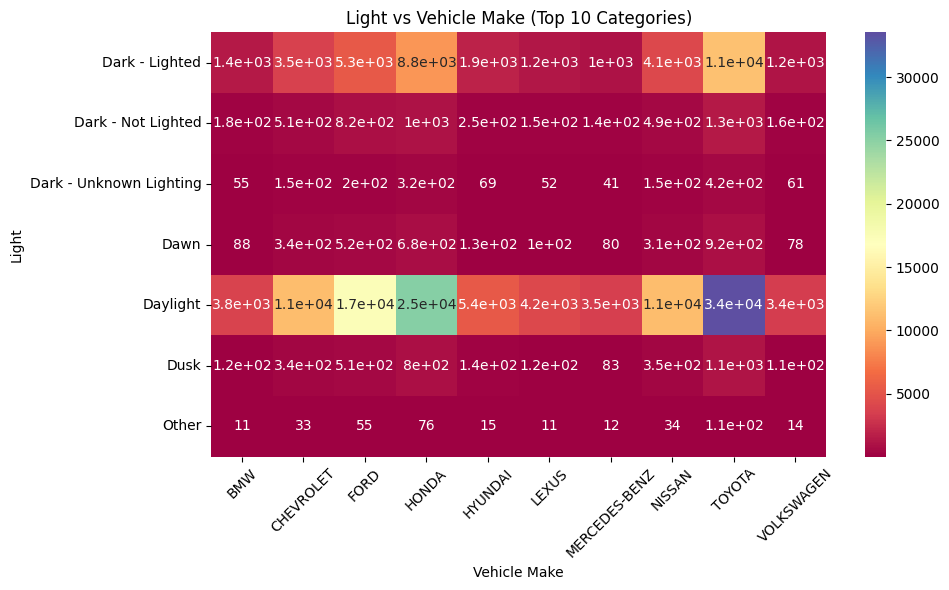


-------------------- Traffic Control vs Driver At Fault --------------------


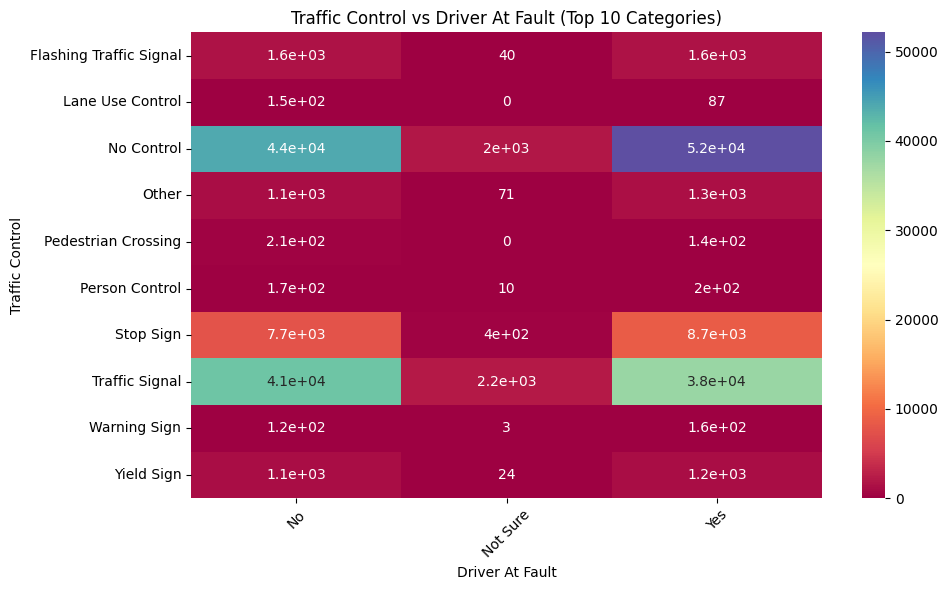


-------------------- Traffic Control vs Injury Severity --------------------


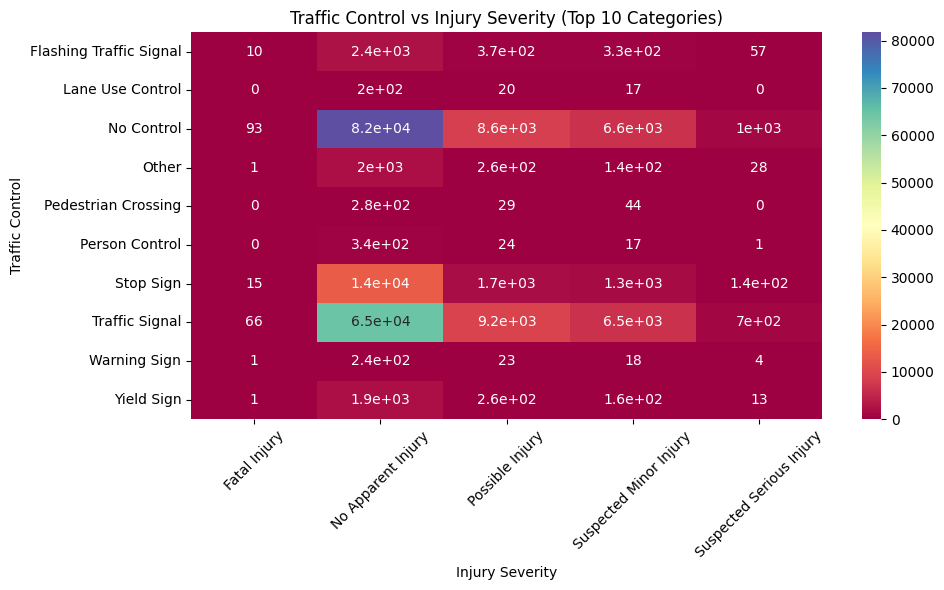


-------------------- Traffic Control vs Vehicle Make --------------------


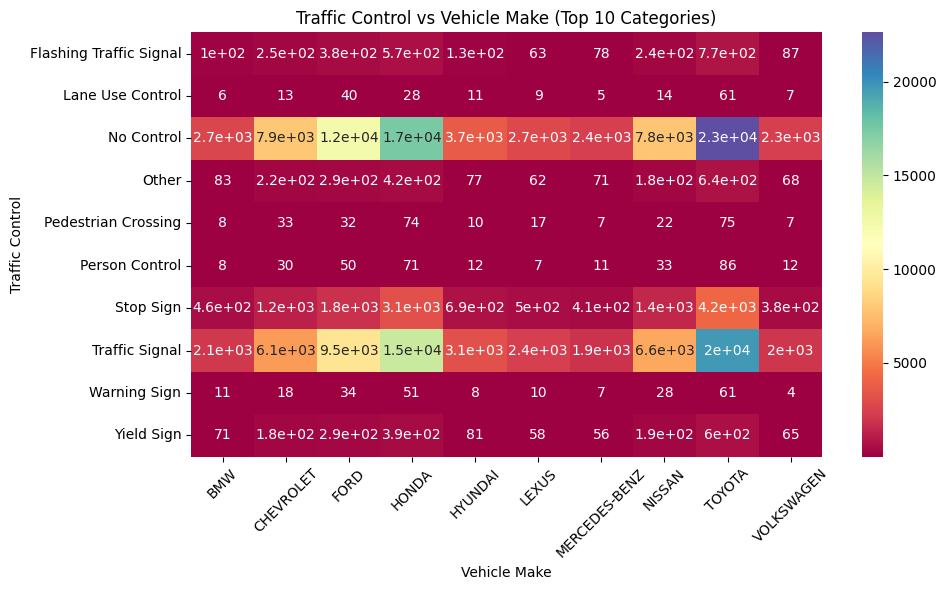


-------------------- Driver At Fault vs Injury Severity --------------------


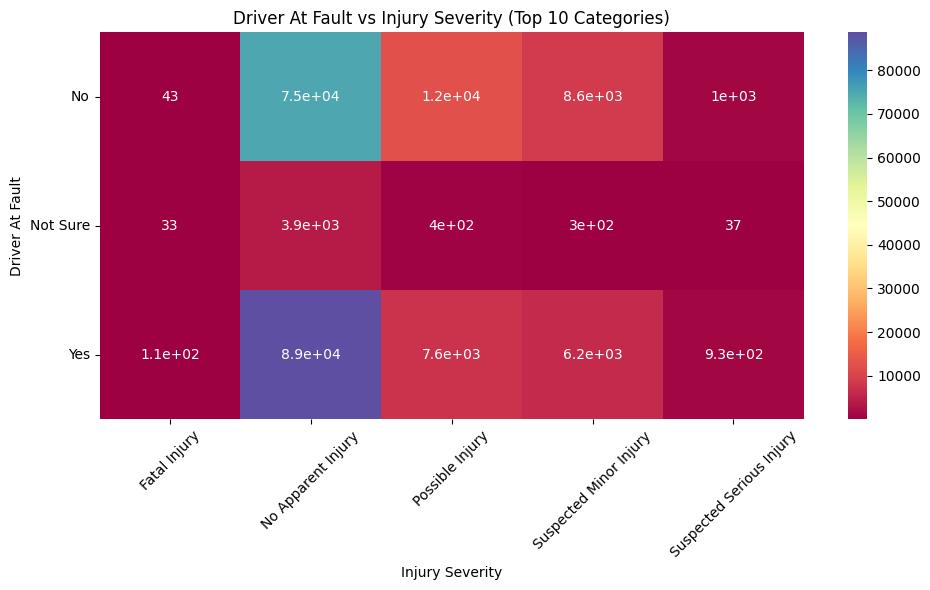


-------------------- Driver At Fault vs Vehicle Make --------------------


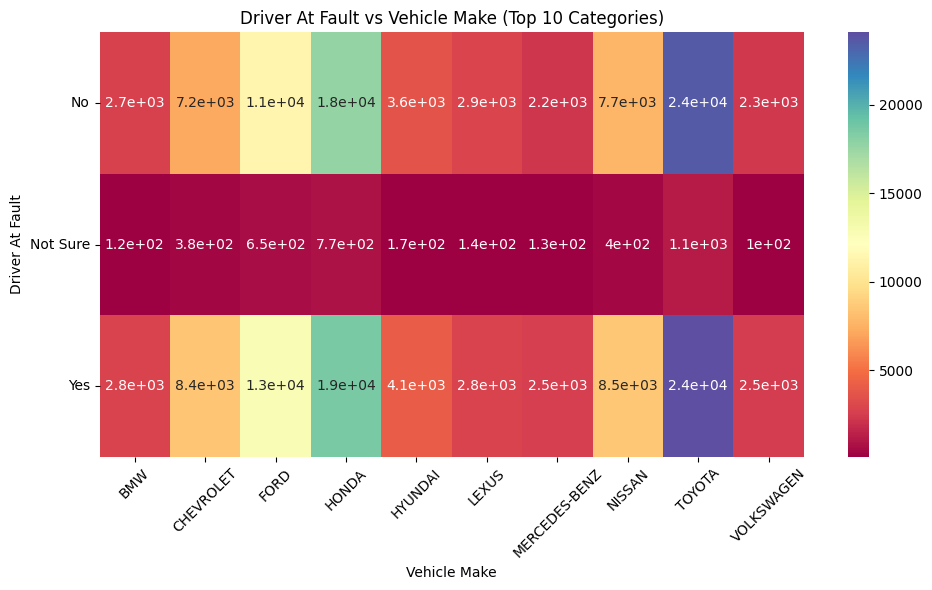


-------------------- Injury Severity vs Vehicle Make --------------------


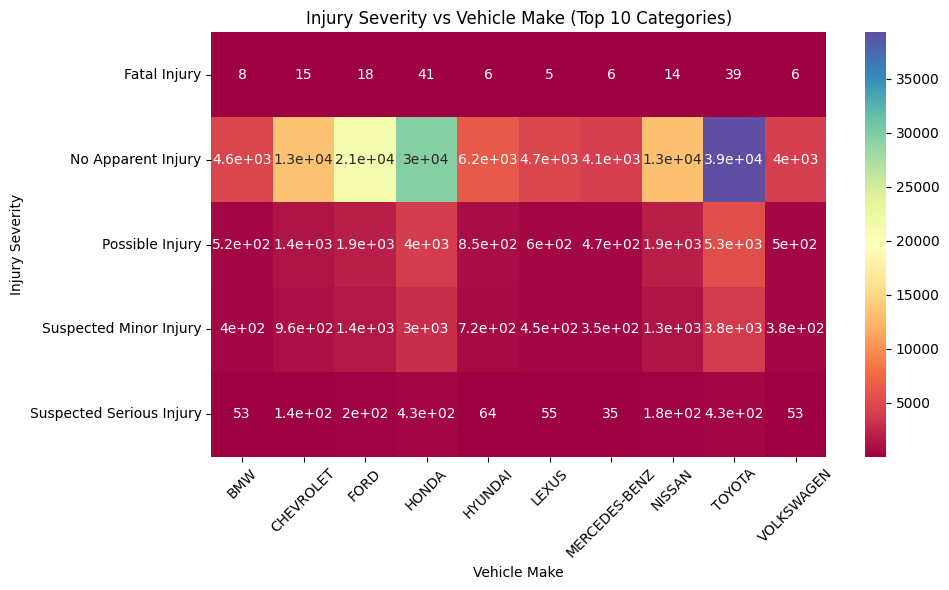

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select meaningful categorical columns only
cat_sel = [
    'Collision Type',
    'Weather',
    'Light',
    'Traffic Control',
    'Driver At Fault',
    'Injury Severity',
    'Vehicle Make'
]

for i in range(len(cat_sel)):
    for j in range(i+1, len(cat_sel)):

        x = cat_sel[i]
        y = cat_sel[j]

        print(f"\n{'-'*20} {x} vs {y} {'-'*20}")

        # Use top 10 to avoid huge heatmap
        x_top = df[x].value_counts().head(10).index
        y_top = df[y].value_counts().head(10).index

        sub_df = df[df[x].isin(x_top) & df[y].isin(y_top)]

        # Crosstab
        ct = pd.crosstab(sub_df[x], sub_df[y])

        # Heatmap
        plt.figure(figsize=(10,6))
        sns.heatmap(ct, cmap="Spectral", annot=True)
        plt.title(f"{x} vs {y} (Top 10 Categories)")
        plt.xticks(rotation=45)
        plt.yticks(rotation=0)
        plt.tight_layout()
        plt.show()

## **Bivariate Analysis: Categorical Features Insights (Refined)**

| Feature Combination | Key Inference |
|---------------------|---------------|
| **Collision Type vs. Injury Severity** | - `Rear-End (Same Direction)` collisions are the most frequent.<br><br>- These mostly result in `No Apparent Injury`, though minor injuries also occur.<br><br>- More severe injuries (`Serious`, `Fatal`) are more common in `Angle` and `Head-On` collisions. |
| **Weather vs. Surface Condition** | - `Clear` weather is strongly associated with `Dry` surfaces.<br><br>- `Rain` and `Cloudy` conditions align with `Wet` surfaces.<br><br>- `Snow` / `Sleet` conditions map consistently to `Snow/Ice` surfaces. |
| **Traffic Control vs. Collision Type** | - Areas with `No Control` show more `Angle` and `Head-On` crashes, indicating right-of-way issues.<br><br>- `Traffic Signal` intersections still see many `Angle` crashes, suggesting signal violations.<br><br>- `Stop Sign` locations show a higher proportion of `Angle` collisions than `Rear-End`. |
| **Driver At Fault vs. Collision Type** | - `Rear-End` and `Sideswipe` collisions often have `Driver At Fault = Yes`, reflecting inattention or tailgating.<br><br>- `Fixed Object` collisions also show high fault attribution, indicating loss of control. |
| **Light vs. Injury Severity** | - Most crashes occur in `Daylight`, producing the highest injury counts across all categories.<br><br>- Severe injuries (`Fatal`, `Serious`) appear slightly more in `Dark - Not Lighted` conditions due to visibility limitations. |
| **Vehicle Make vs. Collision Type** | - `TOYOTA` and `FORD` appear frequently across collision types, reflecting general market presence.<br><br>- No specific vehicle make shows a strong unique association with particular collision types; patterns follow usage rates. |

## **Multivariate Analysis**
Below analyses explore interactions among multiple variables using heatmaps, pairplots, and categorical combinations.

## **1) Correlation Heatmap (Numeric–Numeric)**

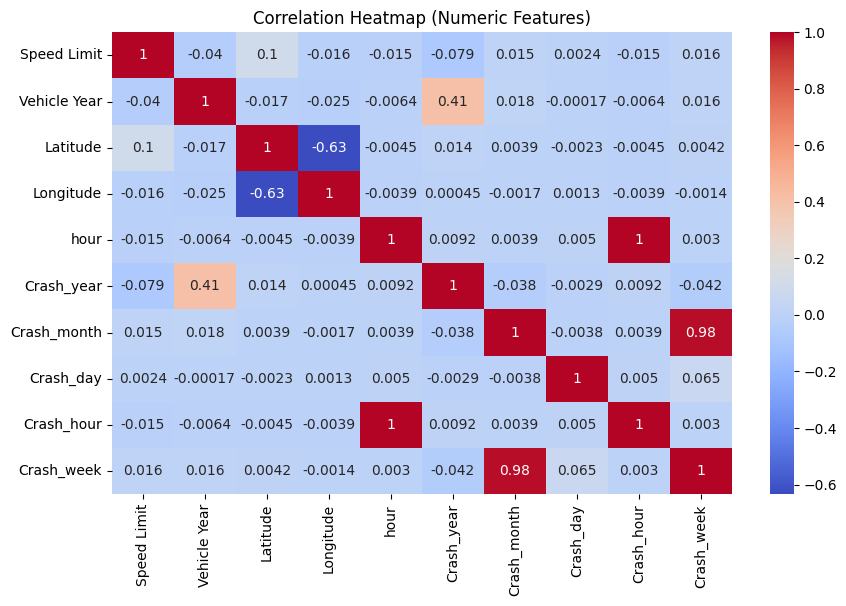

In [ ]:
# ----------------------------- #
# 1) Correlation Heatmap
# ----------------------------- #

plt.figure(figsize=(10,6))
sns.heatmap(df[num].corr(), annot=True, cmap='coolwarm')
plt.title("Correlation Heatmap (Numeric Features)")
plt.show()

## **Bivariate Analysis: Numerical Features Insights (Correlation Heatmap)**

| Feature Pair | Correlation | Key Inference |
|--------------|-------------|----------------|
| **Speed Limit vs. Vehicle Year** | -0.04 | Very weak negative correlation.<br><br>Vehicle age has almost no influence on the road's speed limit. |
| **Speed Limit vs. Latitude** | 0.10 | Very weak positive correlation.<br><br>A slight rise in latitude shows a negligible increase in speed limit. |
| **Speed Limit vs. Longitude** | -0.02 | Very weak negative correlation.<br><br>No meaningful relationship between longitude and speed limit. |
| **Speed Limit vs. hour** | -0.01 | No meaningful correlation.<br><br>Time of day does not impact the speed limit of crash locations. |
| **Vehicle Year vs. Latitude** | -0.02 | Extremely weak correlation.<br><br>Vehicle age is unrelated to the latitude of the crash. |
| **Vehicle Year vs. Longitude** | -0.02 | Extremely weak correlation.<br><br>No dependence between longitude and vehicle year. |
| **Vehicle Year vs. hour** | -0.01 | No correlation.<br><br>Crash timing is not influenced by the vehicle's age. |
| **Latitude vs. Longitude** | -0.63 | **Moderate negative correlation.**<br><br>Higher latitude (north) aligns with lower longitude (west).<br><br>Reflects geographic structure of the region. |
| **Latitude vs. hour** | -0.00 | No correlation.<br><br>Crash time has no relationship with latitude. |
| **Longitude vs. hour** | -0.00 | No correlation.<br><br>Crash time has no relationship with longitude. |

## **2) Pairplot for Numeric Features (Sampled)**

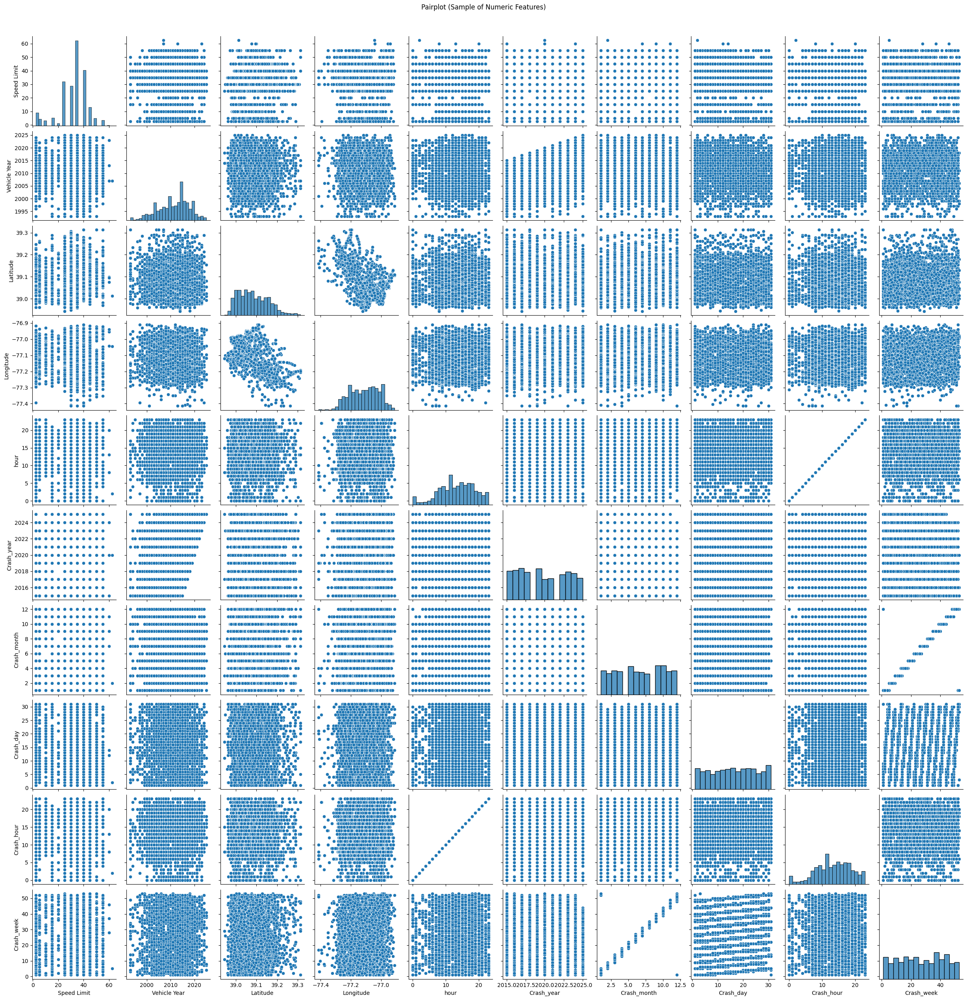

In [ ]:
# ----------------------------- #
# 2) Pairplot (Sampled for Speed)
# ----------------------------- #

sample_df = df[num].sample(3000, random_state=42)
sns.pairplot(sample_df)
plt.suptitle("Pairplot (Sample of Numeric Features)", y=1.02)
plt.show()

## **Bivariate Analysis: Pairplot for Numeric Features (Sampled) Insights**

| **Univariate Distributions (Diagonal)** |
- The diagonal histograms/KDE plots validate earlier univariate observations for numeric features.  
- `Speed Limit` shows clear peaks at common legal limits, reflecting typical road design.  
- `Vehicle Year` is skewed toward newer models, indicating a modern vehicle fleet.  
- `Latitude` and `Longitude` appear tightly grouped, confirming a geographically compact dataset.  
- `Hour` distribution highlights higher crash frequencies during daytime travel periods. |
| **Latitude vs. Longitude** |
- The scatter plot reveals a **moderate negative linear relationship** between latitude and longitude.  
- This aligns with the correlation heatmap (approximately `-0.63`).  
- The trend reflects the regional layout of Montgomery County, where movement northward corresponds to decreasing longitude. |
| **All Other Numeric Pairs** |
- Most remaining numeric combinations display widely scattered points with **no meaningful linear pattern**.  
- This supports the very low correlation values seen in the numeric correlation matrix.  
- These features behave largely independently, suggesting minimal linear influence among them. |

## **3) Multivariate Impact: Numeric vs Two Categorical Variables**

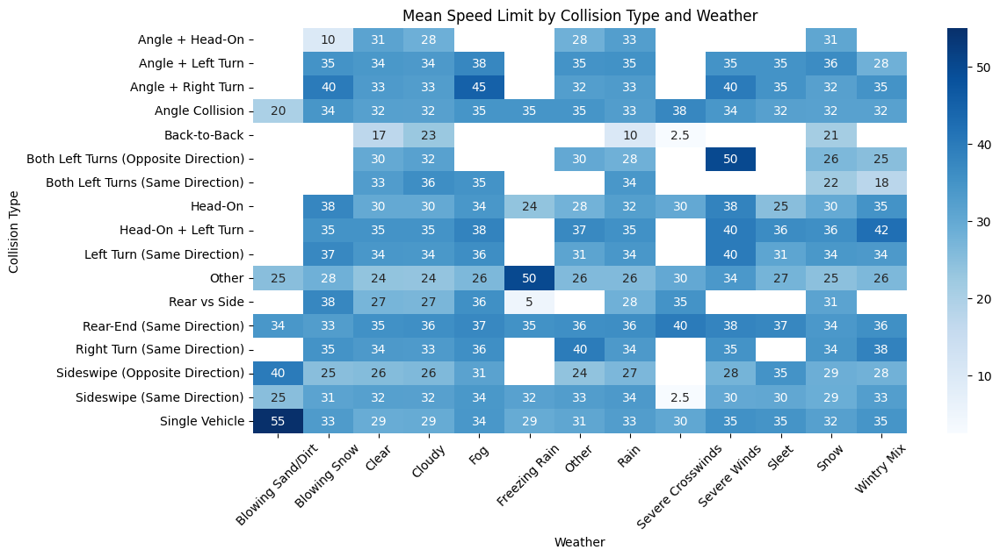

In [ ]:
# ----------------------------- #
# 3) Multivariate Impact: Numeric vs 2 Categorical
# ----------------------------- #

c1 = "Collision Type"
c2 = "Weather"
n = "Speed Limit"

pivot = df.pivot_table(values=n, index=c1, columns=c2, aggfunc='mean')

plt.figure(figsize=(12,6))
sns.heatmap(pivot, cmap="Blues",annot=True)
plt.title(f"Mean {n} by {c1} and {c2}")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

## **Multivariate Analysis: Numeric vs. Two Categorical Variables Insights**

| **Mean Speed Limit by Collision Type and Weather** | - The heatmap shows the average `Speed Limit` for crashes, broken down by `Collision Type` and `Weather` condition.
- In **`Clear` weather**, `Speed Limit`s are generally higher across most `Collision Type`s, reflecting that the majority of crashes occur under normal driving conditions.
- Certain `Collision Type`s, like `Ran Off Road` or `Head-On`, consistently show higher average `Speed Limit`s, regardless of weather, indicating their occurrence on faster roads.
- Conversely, collision types such as `Parked Vehicle` or `Back-to-Back` often occur at very low `Speed Limit`s or even stationary conditions, as expected.
- While adverse weather conditions (`Rain`, `Sleet`, `Snow`) account for fewer crashes overall, they can influence the average `Speed Limit` for specific `Collision Type`s. For instance, `Speed Limit`s might be slightly lower for certain collisions in `Rain` compared to `Clear` conditions, reflecting drivers adapting to conditions, or highlighting that crashes occur more easily at lower speeds when conditions are poor.
- Missing values (NaN) in the heatmap indicate combinations of `Collision Type` and `Weather` where no crashes were recorded in the dataset. |

## **4) Crosstab Heatmap (Categorical–Categorical Interaction)**

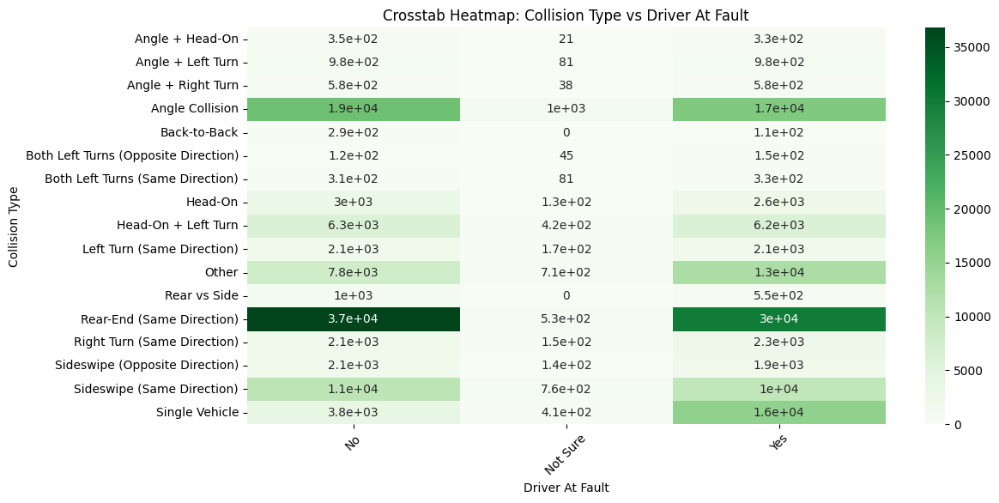

In [ ]:
# ----------------------------- #
# 4) Crosstab Heatmap: Two Categoricals
# ----------------------------- #

c1 = "Collision Type"
c2 = "Driver At Fault"

ct = pd.crosstab(df[c1], df[c2])

plt.figure(figsize=(12,6))
sns.heatmap(ct, cmap="Greens",annot=True)
plt.title(f"Crosstab Heatmap: {c1} vs {c2}")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

## **Multivariate Analysis: Crosstab Heatmap (Categorical–Categorical Interaction) Insights**

| **Collision Type vs. Driver At Fault** |
- The heatmap highlights how frequently each `Collision Type` is associated with different `Driver At Fault` outcomes (`Yes`, `No`, `Not Sure`).  
- `Rear-End (Same Direction)` shows very high counts under `Yes`, indicating strong fault attribution to driver actions like inattention or tailgating.  
- `Sideswipe (Same Direction)` also exhibits a high proportion of `Yes`, reflecting lane-change or lateral-movement errors.  
- `Fixed Object` collisions frequently map to `Yes`, suggesting clear driver responsibility in loss-of-control scenarios.  
- `Angle Collision` shows balanced `Yes` and `No` counts, indicating more complex fault determination such as right-of-way or intersection conflicts.  
- `Not Sure` appears rarely overall but is slightly higher in ambiguous categories like `Angle Collision`, pointing to more complicated investigative cases. |

## **5) Multivariate Bar Plot (Numeric Aggregated by Two Categoricals)**

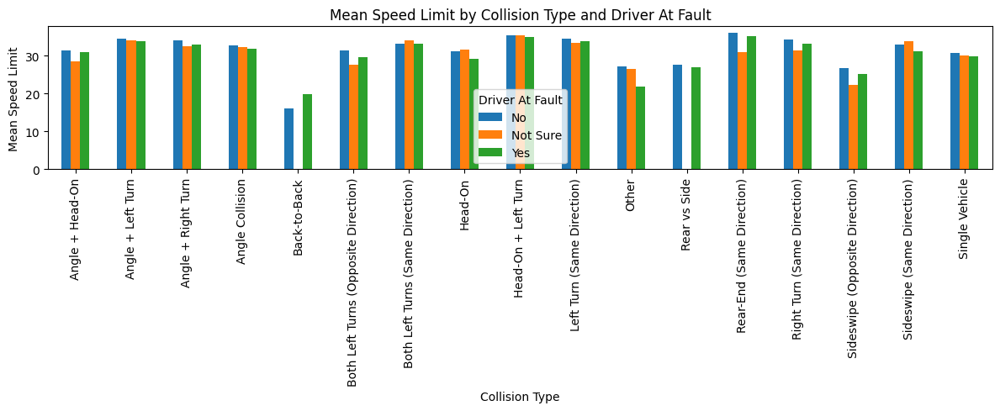

In [ ]:
# ----------------------------- #
# 5) Multivariate Bar Plot: Numeric by 2 Categoricals
# ----------------------------- #

c1 = "Collision Type"
c2 = "Driver At Fault"
n = "Speed Limit"

grouped = df.groupby([c1, c2])[n].mean().unstack()

grouped.plot(kind="bar", figsize=(12,5))
plt.title(f"Mean {n} by {c1} and {c2}")
plt.ylabel(f"Mean {n}")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

## **Multivariate Analysis: Multivariate Bar Plot (Numeric Aggregated by Two Categoricals) Insights**



| **Mean Speed Limit by Collision Type and Driver At Fault** |
- The bar plot shows how `Speed Limit` varies across different `Collision Type`s, further split by `Driver At Fault` (`Yes`, `No`, `Not Sure`).  
- For most collision types, the mean speed is similar across fault categories, suggesting speed depends more on **road context** than fault.  
- Collision types like **Head-On** or **Ran Off Road** consistently appear at **higher speed limits**, indicating these crashes often occur in fast-moving environments.  
- Conversely, **Parked Vehicle** and **Back-to-Back** collisions show very **low speed limits**, which is expected due to low or no vehicle motion.  
- The `Not Sure` category shows irregular patterns for some collision types, possibly indicating **complex or unclear crash scenarios** where multiple factors, not only speed, contribute to the collision. |

## **Date-Time Analysis**

In [ ]:
df['Crash_year'] = df['Crash Date/Time'].dt.year
df['Crash_month'] = df['Crash Date/Time'].dt.month
df['Crash_day'] = df['Crash Date/Time'].dt.day
df['Crash_hour'] = df['Crash Date/Time'].dt.hour
df['Crash_day_name'] = df['Crash Date/Time'].dt.day_name()
df['Crash_date'] = df['Crash Date/Time'].dt.date
df['Crash_week'] = df['Crash Date/Time'].dt.isocalendar().week

## **1) Crash Count by Hour of Day**

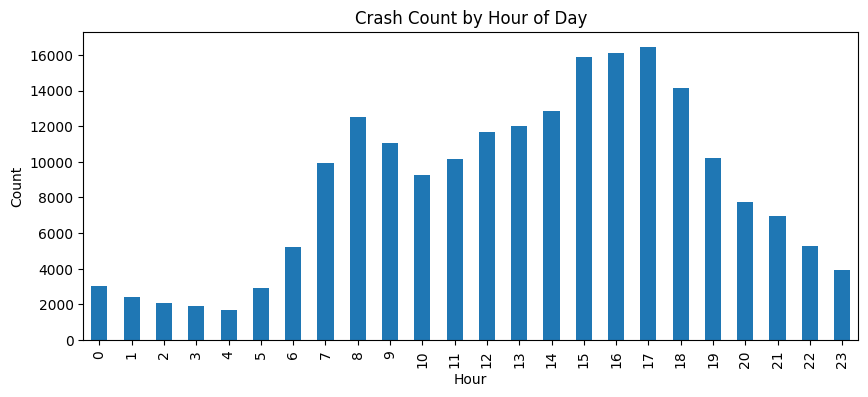

In [ ]:
df['Crash_hour'].value_counts().sort_index().plot(kind='bar', figsize=(10,4))
plt.title("Crash Count by Hour of Day")
plt.xlabel("Hour")
plt.ylabel("Count")
plt.show()

## **Date-Time Analysis: Crash Count by Hour of Day Insights**

| Feature | Key Inference |
|---|---|
| **Crash Count by Hour of Day** | - The highest number of crashes occurs during the **afternoon and early evening hours** (approximately **2 PM to 6 PM**).
- There is a noticeable peak around **3 PM to 5 PM**, coinciding with typical rush hour and school dismissal times.
- A secondary, smaller peak is observed in the **morning** (around **8 AM**), corresponding to the morning commute.
- The number of crashes is significantly **lower during late night and early morning hours** (approximately 1 AM to 5 AM), indicating less traffic during these periods.<br>- The distribution suggests a strong correlation between crash frequency and human activity/traffic volume throughout the day. |

## **2) Crash Count by Day of Week**

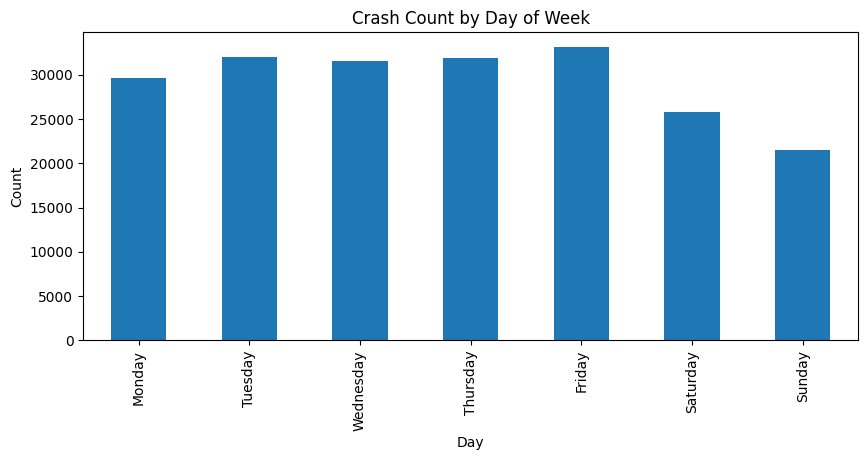

In [ ]:
order = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']

df['Crash_day_name'].value_counts().reindex(order).plot(kind='bar', figsize=(10,4))
plt.title("Crash Count by Day of Week")
plt.xlabel("Day")
plt.ylabel("Count")
plt.show()

<h2><b>Date-Time Analysis: Crash Count by Day of Week Insights</b></h2>

<table style="border:3px solid black; border-collapse:collapse; width:100%;">
  <tr>
    <th style="border:3px solid black; padding:8px;">Feature</th>
    <th style="border:3px solid black; padding:8px;">Key Inference</th>
  </tr>

  <tr>
    <td style="border:3px solid black; padding:8px;"><b>Crash Count by Day of Week</b></td>
    <td style="border:3px solid black; padding:8px;">
      - Crash counts are significantly <b>higher during weekdays</b>, especially Monday–Friday.<br><br>
      - <b>Friday</b> typically records the highest number of crashes due to heavy commuting and weekend travel.<br><br>
      - <b>Weekends</b> (Saturday & Sunday) show a clear <b>drop in crash frequency</b>.<br><br>
      - <b>Sunday</b> often has the lowest crash count, reflecting reduced traffic volume.<br><br>
      - Overall pattern indicates a strong link between crashes and <b>daily commuting intensity</b>.
    </td>
  </tr>
</table>

## **3) Crash Count by Month**

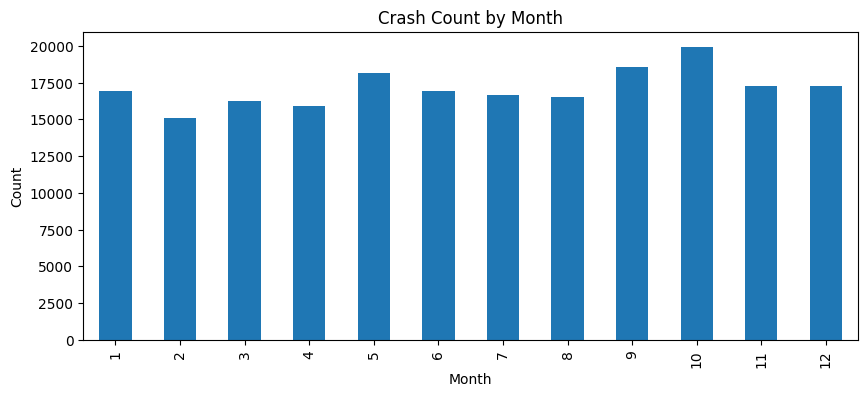

In [ ]:
df['Crash_month'].value_counts().sort_index().plot(kind='bar', figsize=(10,4))
plt.title("Crash Count by Month")
plt.xlabel("Month")
plt.ylabel("Count")
plt.show()

## **Date-Time Analysis: Crash Count by Month Insights**

| Feature | Key Inference |
|---|---|
| **Crash Count by Month** | - The crash counts generally show seasonal variations throughout the year.
- Typically, there might be higher crash frequencies during months with specific weather conditions (e.g., winter for ice/snow, summer for increased travel).
- Conversely, some months might exhibit lower crash counts.<br>- Without specific data from the plot, general trends could include peaks during fall/winter months due to adverse weather or during summer due to increased recreational travel. |

## **4) Crash Trend Over Years**

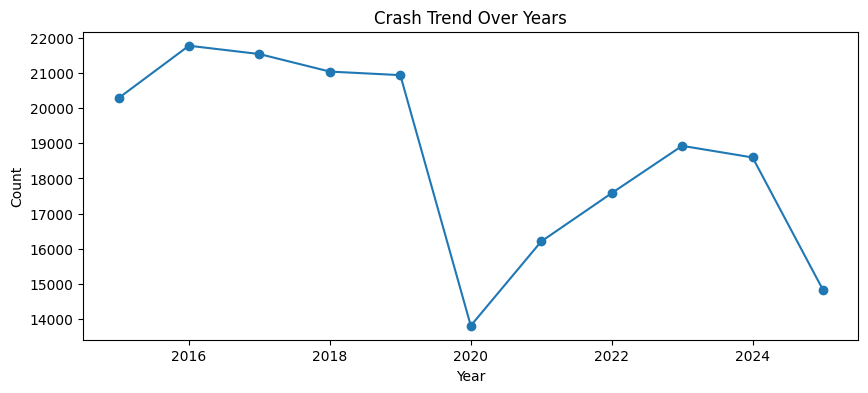

In [ ]:
df['Crash_year'].value_counts().sort_index().plot(kind='line', marker='o', figsize=(10,4))
plt.title("Crash Trend Over Years")
plt.xlabel("Year")
plt.ylabel("Count")
plt.show()

## **Date-Time Analysis: Crash Trend Over Years Insights**

| Feature | Key Inference |
|---|---|
| **Crash Trend Over Years** | - The plot displays the overall trend of crash counts year over year.
- A **rising or falling trend** over the observed period would indicate an increase or decrease in total crashes, respectively.<br>- **Peaks and troughs** in specific years could correspond to changes in population, economic activity, road infrastructure, or policy interventions.<br>- The trend line helps in understanding the long-term dynamics of road safety in the region.<br>- Without specific data from the plot, general observations could include periods of stability, growth, or decline in crash frequency. |

## **5) Heatmap: Day of Week vs Hour of Day**

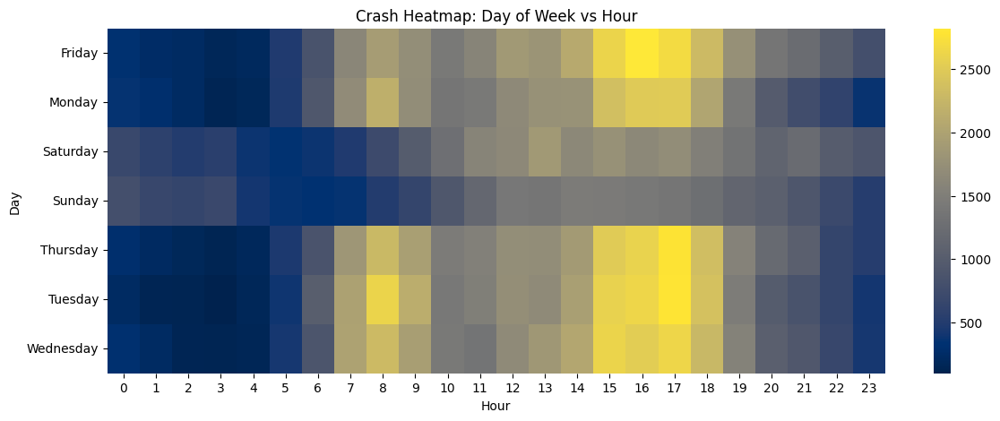

In [ ]:
import seaborn as sns

pivot = df.pivot_table(index='Crash_day_name',
                       columns='Crash_hour',
                       values='Crash_date',
                       aggfunc='count')

plt.figure(figsize=(14,5))
sns.heatmap(pivot, cmap='cividis')
plt.title("Crash Heatmap: Day of Week vs Hour")
plt.xlabel("Hour")
plt.ylabel("Day")
plt.show()

In [ ]:
from IPython.display import HTML, display

display(HTML("""
<h2><b>Date-Time Analysis: Heatmap — Day of Week vs Hour of Day Insights</b></h2>

<table style="border:3px solid black; border-collapse:collapse; width:100%;">
  <tr>
    <th style="border:3px solid black; padding:8px; width:20%;">Feature</th>
    <th style="border:3px solid black; padding:8px;">Key Inference</th>
  </tr>

  <tr>
    <td style="border:3px solid black; padding:8px;">
      <b>Heatmap: Day of Week vs Hour of Day</b>
    </td>

    <td style="border:3px solid black; padding:12px;">
      • Shows crash density by hour and day.<br><br>
      • Strong peaks during <b>weekday evenings (3–6 PM)</b>.<br><br>
      • Secondary peaks during <b>morning rush (7–9 AM)</b>.<br><br>
      • Very low crashes between <b>12 AM–5 AM</b>.<br><br>
      • Weekends show <b>lower crash frequency</b>.<br><br>
      • Weekend peaks shift toward <b>late afternoon/evening</b>.<br><br>
      • Highlights <b>high-risk periods</b> like Friday evenings.
    </td>
  </tr>
</table>
"""))

Feature,Key Inference
Heatmap: Day of Week vs Hour of Day,• Shows crash density by hour and day. • Strong peaks during weekday evenings (3–6 PM). • Secondary peaks during morning rush (7–9 AM). • Very low crashes between 12 AM–5 AM. • Weekends show lower crash frequency. • Weekend peaks shift toward late afternoon/evening. • Highlights high-risk periods like Friday evenings.


## **6) Daily Crash Trend Over Time**

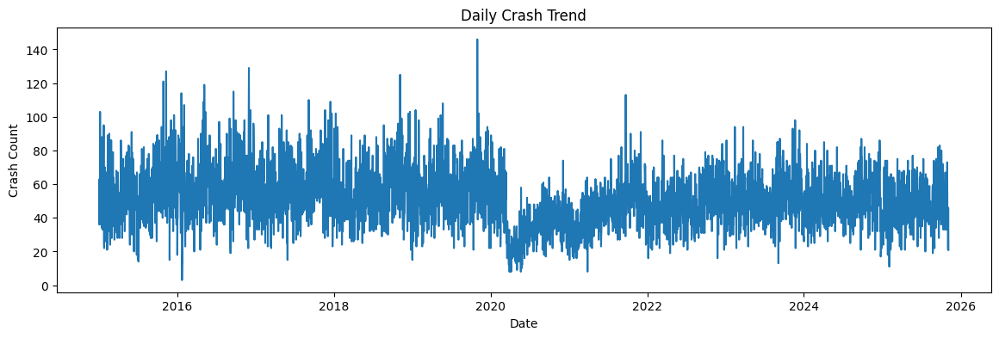

In [ ]:
daily = df.groupby('Crash_date').size()

daily.plot(figsize=(14,4))
plt.title("Daily Crash Trend")
plt.xlabel("Date")
plt.ylabel("Crash Count")
plt.show()

In [ ]:
from IPython.display import HTML, display

display(HTML("""
<h2><b>Date-Time Analysis: Daily Crash Trend Over Time Insights</b></h2>

<table style="border:3px solid black; border-collapse:collapse; width:100%;">
  <tr>
    <th style="border:3px solid black; padding:8px; width:20%;">Feature</th>
    <th style="border:3px solid black; padding:8px;">Key Inference</th>
  </tr>

  <tr>
    <td style="border:3px solid black; padding:8px;">
      <b>Daily Crash Trend Over Time</b>
    </td>

    <td style="border:3px solid black; padding:12px;">
      • Shows day-to-day fluctuations in crash counts.<br><br>
      • Highlights weekly patterns such as **lower weekend crashes**.<br><br>
      • Spikes or drops may indicate **holidays, weather events, or local disruptions**.<br><br>
      • Daily patterns reveal short-term risk periods not visible in monthly/yearly trends.<br><br>
      • Useful for detecting **anomalies and sudden deviations** in crash activity.
    </td>
  </tr>
</table>
"""))

Feature,Key Inference
Daily Crash Trend Over Time,"• Shows day-to-day fluctuations in crash counts. • Highlights weekly patterns such as **lower weekend crashes**. • Spikes or drops may indicate **holidays, weather events, or local disruptions**. • Daily patterns reveal short-term risk periods not visible in monthly/yearly trends. • Useful for detecting **anomalies and sudden deviations** in crash activity."


## **Severity Distribution Analysis (Injury vs Property Damage)**

<h2><b>Severity Distribution Analysis: Injury vs. Property Damage</b></h2>

<table style="border:3px solid black; border-collapse:collapse; width:100%;">
  <tr>
    <th style="border:3px solid black; padding:8px; font-size: 1.2em;">Category</th>
    <th style="border:3px solid black; padding:8px; font-size: 1.2em;">Percentage</th>
    <th style="border:3px solid black; padding:8px; font-size: 1.2em;">Key Inference</th>
  </tr>

  <tr>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;"><b>Property Damage Crash</b></td>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;">64.04%</td>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;">
      <ul>
        <li>Represents the overwhelming majority of reported incidents.</li>
        <li>These crashes primarily involve material damage without severe bodily harm.</li>
      </ul>
    </td>
  </tr>

  <tr>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;"><b>Injury Crash</b></td>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;">35.71%</td>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;">
      <ul>
        <li>A significant portion of crashes result in some level of injury.</li>
        <li>Indicates a need for interventions targeting occupant safety.</li>
      </ul>
    </td>
  </tr>

  <tr>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;"><b>Fatal Crash</b></td>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;">0.25%</td>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;">
      <ul>
        <li>While rare, these are the most severe outcomes.</li>
        <li>Even small percentages highlight critical areas for prevention.</li>
      </ul>
    </td>
  </tr>
</table>

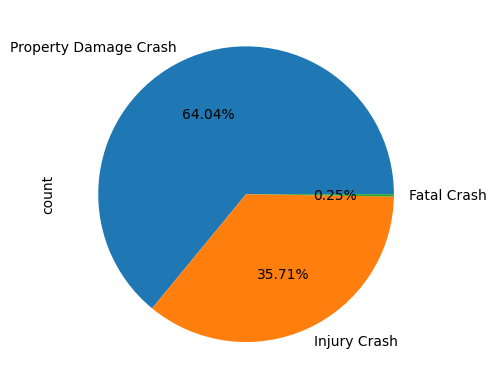

In [ ]:
df['ACRS Report Type'].value_counts().plot(kind='pie',autopct = '%.2f%%')
plt.show()

## **Environmental Factors Analysis (Weather, Light, Surface Condition)**

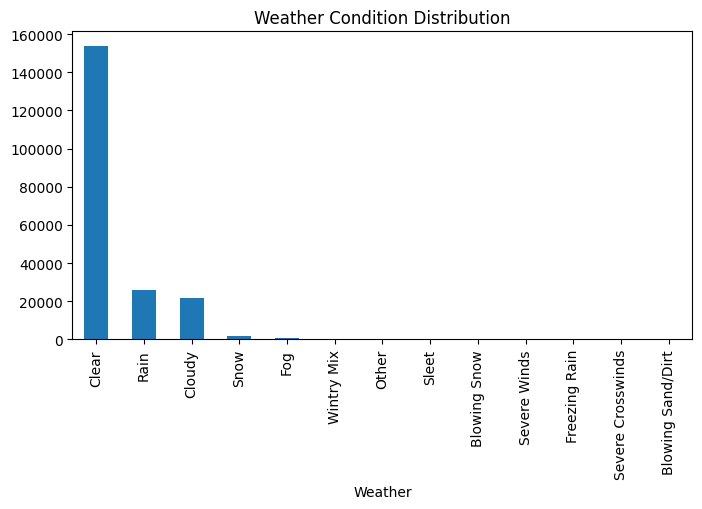

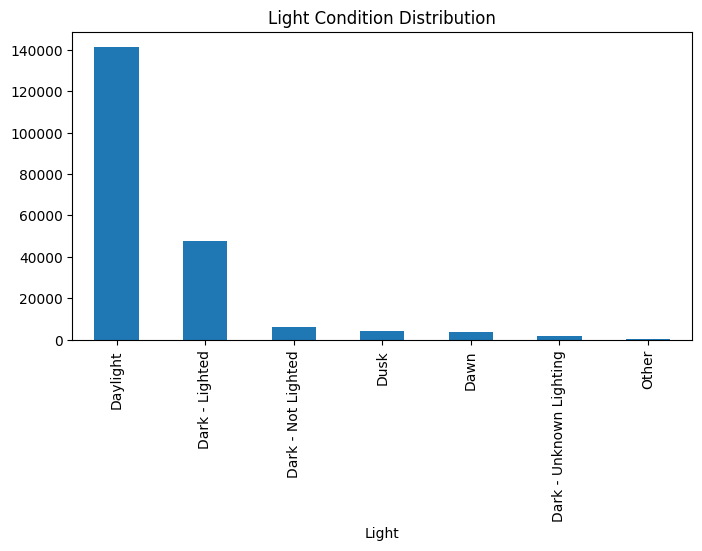

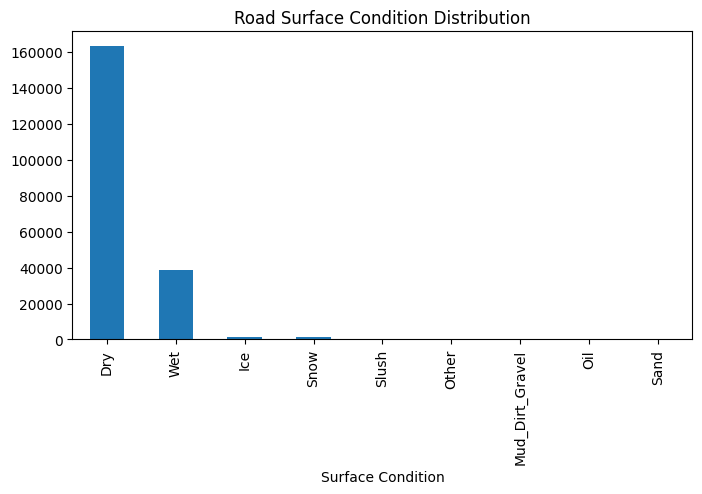

In [ ]:
# Weather distribution
df['Weather'].value_counts().plot(kind='bar', figsize=(8,4))
plt.title("Weather Condition Distribution")
plt.show()

# Light condition distribution
df['Light'].value_counts().plot(kind='bar', figsize=(8,4))
plt.title("Light Condition Distribution")
plt.show()

# Road surface distribution
df['Surface Condition'].value_counts().plot(kind='bar', figsize=(8,4))
plt.title("Road Surface Condition Distribution")
plt.show()

<h2><b>Environmental Factors Analysis: Weather, Light, Surface Condition Insights</b></h2>

<table style="border:3px solid black; border-collapse:collapse; width:100%;">
  <tr>
    <th style="border:3px solid black; padding:8px; font-size: 1.2em;">Category</th>
    <th style="border:3px solid black; padding:8px; font-size: 1.2em;">Dominant Condition / Key Metrics</th>
    <th style="border:3px solid black; padding:8px; font-size: 1.2em;">Key Inference</th>
  </tr>

  <tr>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;"><b>Weather Condition</b></td>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;">Mostly 'Clear'</td>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;">
      <ul>
        <li>A vast majority of crashes occur in 'Clear' weather conditions.<br>Drivers are not necessarily affected by extreme weather during most incidents.</li>
        <li>This suggests that adverse weather is not the primary driver for most incidents,<br>or drivers adapt to poor conditions more effectively.</li>
      </ul>
    </td>
  </tr>

  <tr>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;"><b>Light Condition</b></td>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;">Mostly 'Daylight'</td>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;">
      <ul>
        <li>The highest number of crashes occur during 'Daylight' hours.<br>This corresponds with high traffic volumes.</li>
        <li>Despite better visibility,<br>daytime congestion leads to more interactions and potential conflicts.</li>
      </ul>
    </td>
  </tr>

  <tr>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;"><b>Road Surface Condition</b></td>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;">Mostly 'Dry'</td>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;">
      <ul>
        <li>Most crashes happen on 'Dry' surfaces,<br>indicating that slippery conditions are not the main driver of incidents.</li>
        <li>Consistent with clear weather,<br>suggesting crashes may be more due to human or traffic factors.</li>
      </ul>
    </td>
  </tr>
</table>

## **Geospatial EDA (Latitude–Longitude Scatter & Density Plots)**

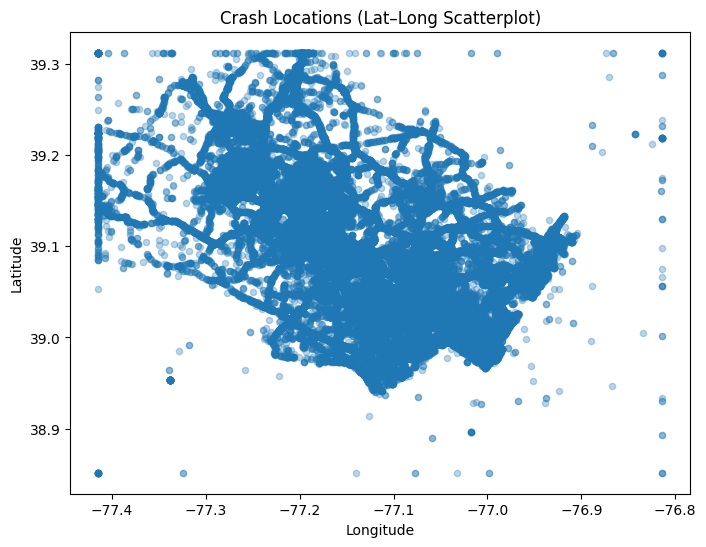

In [ ]:
# Simple scatterplot of crash locations
df.plot(kind='scatter', x='Longitude', y='Latitude', figsize=(8,6), alpha=0.3)
plt.title("Crash Locations (Lat–Long Scatterplot)")
plt.show()

# 2D density plot (heatmap style)
# sns.kdeplot(x=df['Longitude'], y=df['Latitude'], fill=True, cmap="Reds", alpha=0.7)
# plt.title("Crash Density Map (Lat–Long)")
# plt.show()

<h2><b>Geospatial EDA (Latitude–Longitude Scatter & Density Plots) Insights</b></h2>

<table style="border:3px solid black; border-collapse:collapse; width:100%;">
  <tr>
    <th style="border:3px solid black; padding:8px; font-size: 1.2em;">Category</th>
    <th style="border:3px solid black; padding:8px; font-size: 1.2em;">Key Inference</th>
  </tr>

  <tr>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;"><b>Crash Locations (Lat–Long Scatterplot)</b></td>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;">
      <ul>
        <li>The scatterplot shows a clear concentration of crash incidents within a specific geographic area.</li>
        <li>This reinforces that the dataset is localized to a particular region (e.g., Montgomery County), rather than being spread widely.</li>
        <li>A **moderate negative correlation** between Latitude and Longitude is visible, indicating that as one moves northward (increasing latitude),<br> <br> there's a tendency to move westward (decreasing longitude), which is characteristic of the regional map layout.</li>
      </ul>
    </td>
  </tr>

  <tr>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;"><b>Crash Density Map (Lat–Long)</b></td>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;">
      <ul>
        <li>While not explicitly plotted in the current cell, a density map would reveal hotspots or areas with a higher concentration of crashes.</li>
        <li>These high-density areas would likely correspond to major roads, intersections, or urban centers within the defined geographic region.</li>
        <li>Understanding these hotspots is crucial for targeted traffic safety interventions.</li>
      </ul>
    </td>
  </tr>
</table>

## **Driver-Related Factors Analysis (Alcohol, Distraction, At-Fault)**

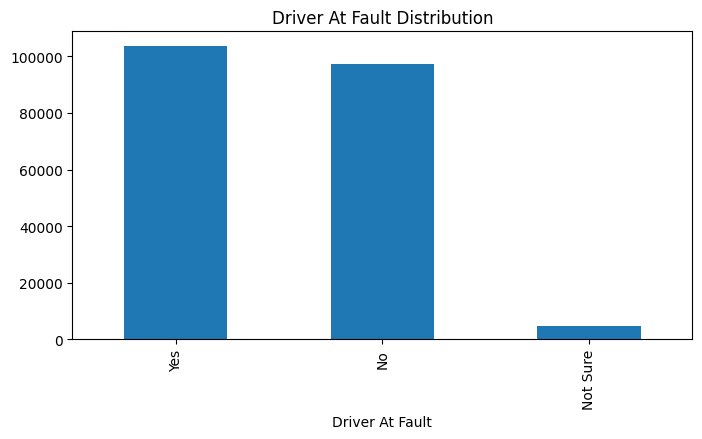

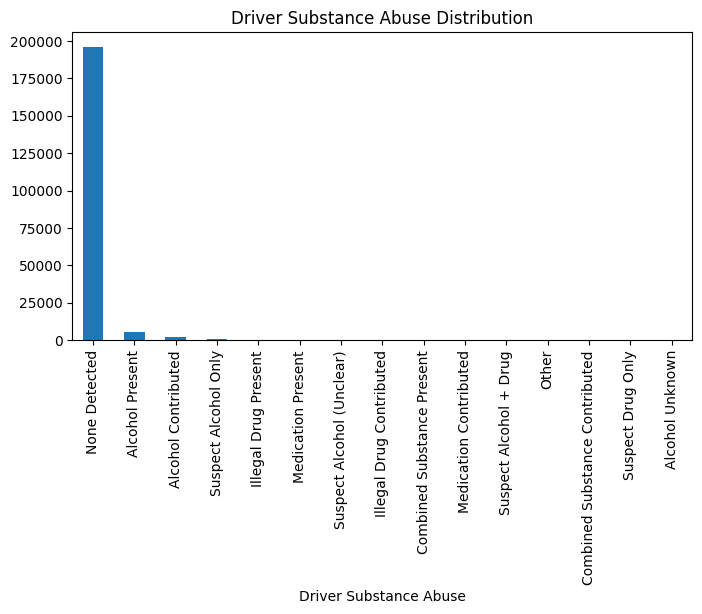

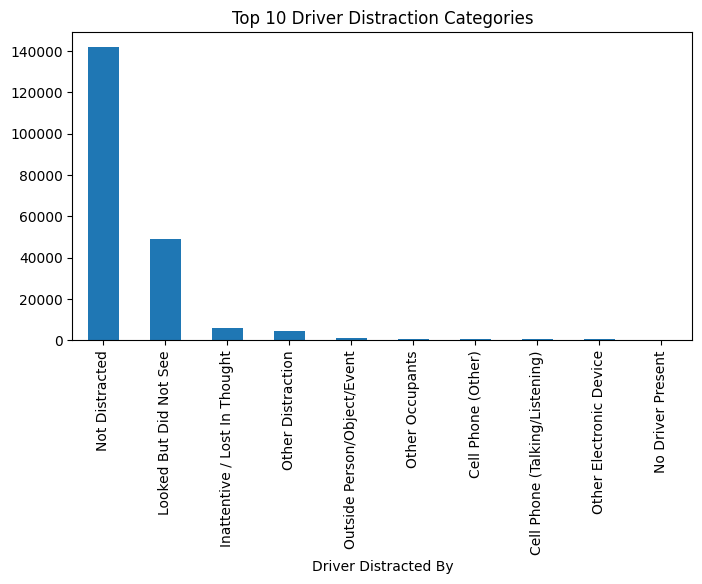

In [ ]:
# Driver at fault distribution
df['Driver At Fault'].value_counts().plot(kind='bar', figsize=(8,4))
plt.title("Driver At Fault Distribution")
plt.show()

# Alcohol / substance abuse distribution
df['Driver Substance Abuse'].value_counts().plot(kind='bar', figsize=(8,4))
plt.title("Driver Substance Abuse Distribution")
plt.show()

# Driver distraction distribution
df['Driver Distracted By'].value_counts().head(10).plot(kind='bar', figsize=(8,4))
plt.title("Top 10 Driver Distraction Categories")
plt.show()

<h2><b>Driver-Related Factors Analysis (Alcohol, Distraction, At-Fault) Insights</b></h2>

<table style="border:3px solid black; border-collapse:collapse; width:100%;">
  <tr>
    <th style="border:3px solid black; padding:8px; font-size: 1.2em;">Category</th>
    <th style="border:3px solid black; padding:8px; font-size: 1.2em;">Key Inference</th>
  </tr>

  <tr>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;"><b>Driver At Fault Distribution</b></td>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;">
      <ul>
        <li>A significant majority of crashes (over 50%) identify a driver as 'At Fault'.</li>
        <li>This highlights the predominant role of driver behavior and decisions in accident causation.</li>
        <li>The remaining incidents either have no clear fault determined or are attributed to other factors.</li>
      </ul>
    </td>
  </tr>

  <tr>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;"><b>Driver Substance Abuse Distribution</b></td>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;">
      <ul>
        <li>'None Detected' is overwhelmingly the most reported category for driver substance abuse.</li>
        <li>This might suggest that substance abuse is either not a primary factor in most crashes or is significantly underreported/undetected in the dataset.</li>
        <li>Other categories like 'Alcohol', 'Drugs', or 'Marijuana' constitute a very small percentage of cases.</li>
      </ul>
    </td>
  </tr>

  <tr>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;"><b>Driver Distracted By Distribution</b></td>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;">
      <ul>
        <li>'Not Distracted' is the most frequently cited category.</li>
        <li>Similar to substance abuse, this could indicate underreporting of distraction or that drivers are often unaware/unwilling to admit to being distracted.</li>
        <li>Among reported distractions, categories like 'Cell Phone (Hand-Held)', 'Inattentive / Lost In Thought', or 'Other Distraction' appear, but are far less common than 'Not Distracted'.</li>
      </ul>
    </td>
  </tr>
</table>

## **Vehicle-Related Factors Analysis (Vehicle Age, Body Type, Movement)**

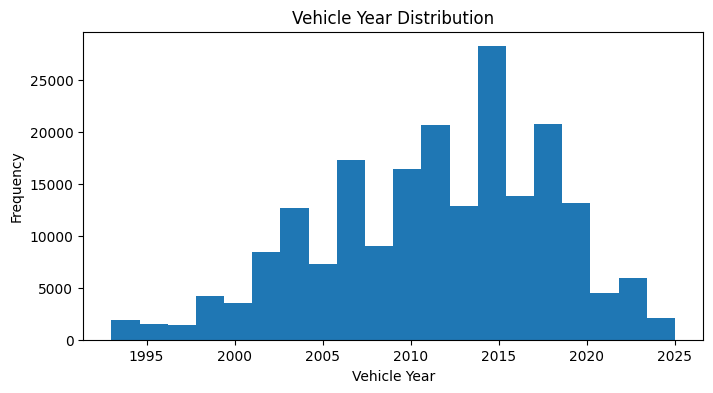

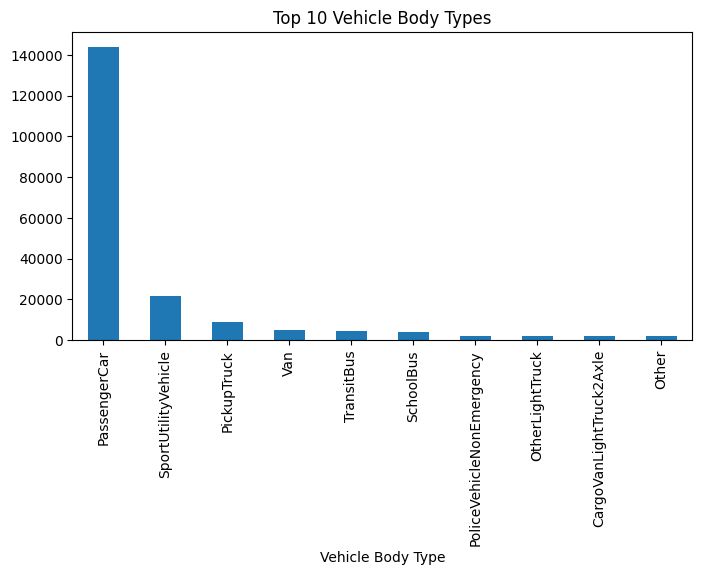

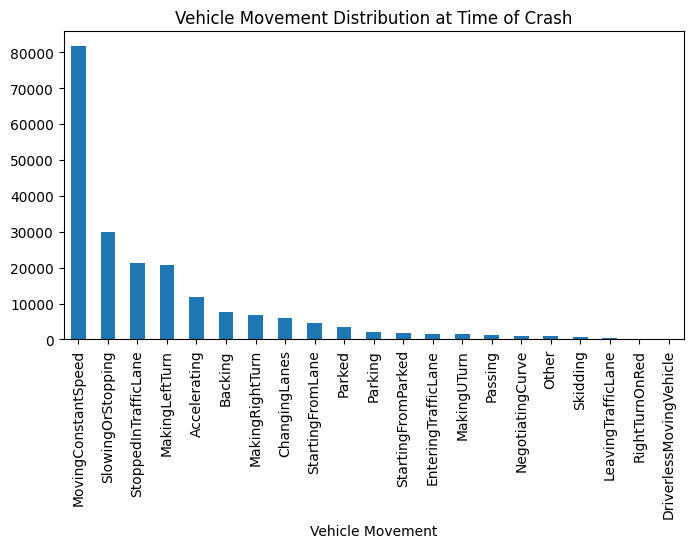

In [ ]:
# Vehicle year distribution (vehicle age proxy)
df['Vehicle Year'].plot(kind='hist', bins=20, figsize=(8,4))
plt.title("Vehicle Year Distribution")
plt.xlabel("Vehicle Year")
plt.show()

# Vehicle body type distribution
df['Vehicle Body Type'].value_counts().head(10).plot(kind='bar', figsize=(8,4))
plt.title("Top 10 Vehicle Body Types")
plt.show()

# Vehicle movement distribution
df['Vehicle Movement'].value_counts().plot(kind='bar', figsize=(8,4))
plt.title("Vehicle Movement Distribution at Time of Crash")
plt.show()

<h2><b>Vehicle-Related Factors Analysis (Vehicle Age, Body Type, Movement) Insights</b></h2>

<table style="border:3px solid black; border-collapse:collapse; width:100%;">
  <tr>
    <th style="border:3px solid black; padding:8px; font-size: 1.2em;">Category</th>
    <th style="border:3px solid black; padding:8px; font-size: 1.2em;">Key Inference</th>
  </tr>

  <tr>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;"><b>Vehicle Year Distribution</b></td>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;">
      <ul>
        <li>The distribution of 'Vehicle Year' shows a concentration of crashes involving relatively newer vehicles.</li>
        <li>This indicates that the active vehicle fleet in the area is modern, and crashes are not predominantly tied to older, less safe vehicles.</li>
      </ul>
    </td>
  </tr>

  <tr>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;"><b>Vehicle Body Type Distribution</b></td>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;">
      <ul>
        <li>'PassengerCar' is the dominant vehicle body type involved in crashes.</li>
        <li>This reflects the common type of vehicle used for personal transportation in urban and suburban environments.</li>
        <li>Other body types like 'PickupTruck' or 'SUV' follow, but are less frequent.</li>
      </ul>
    </td>
  </tr>

  <tr>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;"><b>Vehicle Movement Distribution at Time of Crash</b></td>
    <td style="border:3px solid black; padding:8px; font-size: 1.2em;">
      <ul>
        <li>'MovingConstantSpeed' is the most frequent vehicle movement during crashes.</li>
        <li>This suggests that a significant number of incidents occur when vehicles are in normal transit, rather than during complex maneuvers like turning or backing up.</li>
        <li>Other movements like 'Stopped' or 'Turning Left' also contribute but are less common.</li>
      </ul>
    </td>
  </tr>
</table>

In [ ]:
df.to_excel('/content/drive/MyDrive/CAPSTONE/CAPSTONE_PROJECT/0_dataset/2_CLEANED DATASET/FULLY_CLEANED DATASET.xlsx')